In [1]:
#load package
.libPaths(c("/cluster/home/liuhengxin/software/miniconda3_2/envs/r-kernel/lib/R/library",
           "/cluster/home/liuhengxin/software/miniconda3/envs/r4.1.2/lib/R/library",
           "/cluster/home/liuhengxin/software/miniconda3_2/envs/Rsplot/lib/R/library"))
library(data.table)
library(qs) 
library(GenomicRanges)
library(GenomicFeatures)
library(rtracklayer)
library(dplyr)
library(ggbio)
library(reshape2)
library(ggsci)
library(viridis)
library(ggpubr)
library(ggh4x)
library(ggtranscript)
library(khroma)
library(bambu)
library(ggdensity)
library(Seurat)
library(ggsignif) # Significance Brackets for 'ggplot2'
library(gghalves) # Compose Half-Half Plots Using Your Favourite Geoms
library(randomcoloR)
library(ComplexHeatmap)
library(ggvenn)

qs 0.25.5

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sapply, setdiff, sort,
    table, tapply, union, unique, unsplit, which.max, which.min


Loading required package: S4Vectors


Attaching package: ‘S4Vectors’


The following objects are masked from ‘package:data.table’:

    first, second


The following object is masked from ‘package:utils’:

    findMatches


The following objects are masked from ‘package:base’:

    expand.grid, I, unname


Loading required package: I

In [2]:
setwd("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/")
MySplit = function(str,sep, n){
  return(unlist(lapply(strsplit(str,sep),"[[",n)))
}
areaan = read.csv("../ref/area_annotation.csv")
# gtf = rtracklayer::import("ref/bambu_extended_annotations_novelname.gtf")
areaan = unique(areaan[c("L0","L3")])
colnames(areaan) = c("lobe","area")

In [3]:
fsraw.t42 = qread("data/reads_full_anotation/T42_main_data_read_total_annotation_delete_multiread_total_hubselect_25_12_10.qs")
fsraw.t47 = qread("data/reads_full_anotation/T47_main_data_read_total_annotation_delete_multiread_total_hubselect_25_12_10.qs")
fsraw.t44 = qread("data/reads_full_anotation/main_data_read_total_annotation_fil_delete_multiread_withsample_25_10_20.qs")
rt_vm116 = qread("/cluster/home/liuhengxin/P1_brain_nanopore/processed_data/VM_analysis/Revo/VM11LPT6_Y00983LA_trans_total_anno_withcid_filter_25_12_02.qs")
# rt_vm062 = qread("/cluster/home/liuhengxin/P1_brain_nanopore/processed_data/VM_analysis/Revo/VM06LP2_Y00985CC_trans_total_anno_withcid_filter_25_12_02.qs")
# rt_vm112 = qread("/cluster/home/liuhengxin/P1_brain_nanopore/processed_data/VM_analysis/Revo/VM11LPT2_B05253E6_trans_total_anno_withcid_filter_25_12_02.qs")
rt_me01 = qread("/cluster/home/liuhengxin/P1_brain_nanopore/processed_data/VM_analysis/Revo/ME012_Y00986G1_trans_total_anno_withcid_filter_25_12_02.qs")

In [16]:
# fsraw.t47$lobe = areaan[match(fsraw.t47$region,areaan$area),]$lobe
fsraw.t42$lobe = areaan[match(fsraw.t42$region,areaan$area),]$lobe

In [25]:
transt = qread("downstream_analysis/data/reads_full_anotation/read_trans_stat_list_dedup_fsrawcor_25_10_10.qs")
transti = transt$layer

gene_id,transcript_id,areatr,count,genecount
<chr>,<chr>,<chr>,<int>,<int>
A4GALT,XM_015457101.1,l1,12,16
A4GALT,XM_015457101.1,l2,4,4
A4GALT,XM_015457101.1,l3,22,22
A4GALT,XM_015457101.1,l4,9,9
A4GALT,XM_015457101.1,l5,8,8
A4GALT,XM_015457101.1,l6,3,3


In [28]:
sum(transti[transti$gene_id == "PPIB",]$genecount)
sum(transti[transti$gene_id == "GAPDH",]$genecount)
sum(transti[transti$gene_id == "DDRGK1",]$genecount)
transti[transti$gene_id == "PPIB",]
transti[transti$gene_id == "GAPDH",]
transti[transti$gene_id == "DDRGK1",]

[1] 11640

[1] 298234

[1] 59234

gene_id,transcript_id,areatr,count,genecount
<chr>,<chr>,<chr>,<int>,<int>
GAPDH,XM_005569912.2,l1,4928,4949
GAPDH,XM_005569912.2,l2,11981,12046
GAPDH,XM_005569912.2,l3,66918,67280
GAPDH,XM_005569912.2,l4,12733,12797
GAPDH,XM_005569912.2,l5,28539,28627
GAPDH,XM_005569912.2,l6,23325,23418
GAPDH,XM_015430282.1,l1,21,4949
GAPDH,XM_015430282.1,l2,65,12046
GAPDH,XM_015430282.1,l3,362,67280


gene_id,transcript_id,areatr,count,genecount
<chr>,<chr>,<chr>,<int>,<int>
DDRGK1,DDRGK1-FS-1,l1,1097,1787
DDRGK1,DDRGK1-FS-1,l2,2723,4160
DDRGK1,DDRGK1-FS-1,l3,9546,15246
DDRGK1,DDRGK1-FS-1,l4,723,1893
DDRGK1,DDRGK1-FS-1,l5,1164,3112
DDRGK1,DDRGK1-FS-1,l6,1490,3419
DDRGK1,XM_005568473.2,l1,690,1787
DDRGK1,XM_005568473.2,l2,1437,4160
DDRGK1,XM_005568473.2,l3,5700,15246


In [4]:
# fsraw.t42 = qread("downstream_analysis/data/reads_full_anotation/T42_main_data_read_total_annotation_delete_multiread_total_25_12_01.qs")
# fsraw.t47 = qread("downstream_analysis/data/reads_full_anotation/T47_main_data_read_total_annotation_delete_multiread_total_25_10_26.qs")
isosigls.t44 = qread("data/dtu_analysis/dtu_isoform_ls_fsraw_cor_25_10_10.qs")
isosigls.t42 = qread("data/dtu_analysis/T42_dtu_isoform_ls_fsraw_cor_25_12_16.qs")
isosigls.t47 = qread("data/dtu_analysis/T47_dtu_isoform_ls_fsraw_cor_25_12_16.qs")
# head(fsraw.t42)

In [17]:
theme_presentation<- function(base_size = 16, base_family = "") {
  # Starts with theme_grey and then modify some parts
  theme_bw(base_size = base_size, base_family = base_family) %+replace%
    theme(
      strip.background = element_blank(),
      strip.text.x = element_text(size=16,colour="white"),
      strip.text.y = element_text(size=16,colour="white"),
      axis.text.x = element_blank(),
      axis.text.y = element_blank(),
      axis.ticks =  element_blank(), 
      axis.title.x= element_blank(),
      axis.title.y= element_blank(),
      panel.background = element_rect(fill="black"), 
      panel.border =element_blank(),  
      panel.grid.major = element_blank(), 
      panel.grid.minor = element_blank(), 
      panel.margin = unit(1.0, "lines"), 
      plot.background = element_rect(fill="black"), 
      plot.title =element_text(size=16,colour="white"), 
      # plot.margin = unit(c(1,  1, 1, 1), "lines"),
      legend.background=element_rect(fill='black'),
      legend.title=element_text(size=12,colour="white"),
      legend.text=element_text(size=12,colour="white"),
      legend.key = element_rect( fill = 'black'),
      # legend.key.size = unit(c(0, 0), "lines"),
      axis.line.x = element_blank(),
      axis.line.y = element_blank()
    )
}

SpCasePlot = function(fsraw.cor,geneex,hubtrans,backpt,ptsize = 1,backsize = 0.05){
    mkdf = fsraw.cor[fsraw.cor$gene_id == geneex,]
    mkdf = mkdf[mkdf$transcript_id %in% hubtrans,]
    mkdf = mkdf[order(as.numeric(factor(mkdf$transcript_id,levels = hubtrans))),]
    mycolor = distinctColorPalette(length(hubtrans))
    #mkdf = mkdf[order(mkdf$transcript_id),]
    pmkpti1 = ggplot() +
      scattermore::geom_scattermore(
        data = backpt,
        aes(x,y),
        color = "white",
        # pixels = raster.dpi,
        pointsize = backsize
      ) +
      geom_point(data = mkdf,
                 aes(x,y,fill = transcript_id),shape = 21,size = ptsize,stroke = NA) + 
      # geom_segment(data = edgesdf, aes(x = x1, y = y1, xend = x2, yend = y2,color = areatr),
      #            size = 0.5,alpha = 0.75) + 
     # scale_size(range = c(0.05,0.1)) +
      #facet_wrap(~layer,nrow = 2) 
      theme_void() +
      scale_fill_discreterainbow() +
      #scale_fill_manual(values = mycolor) +
      #scale_color_flatui() +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 18)) +
      guides(color = guide_legend(override.aes = list(size=8),nrow = 3),
            fill = guide_legend(override.aes = list(size=8),nrow = 2),
            size = "none")
      #scale_y_reverse() + scale_x_reverse()
    return(pmkpti1)
}

In [3]:
backpt = qread(file = "downstream_analysis/data/dtu_analysis/T42_longread_cell_isoform_without_subcortical_25_11_24.qs")
head(backpt)
nrow(backpt)

x,y,layer,region,subcortical
<int>,<int>,<chr>,<chr>,<chr>
10000,22819,l2,3a/b,Cortex
10000,22991,l2,3a/b,Cortex
10000,23139,l3,3a/b,Cortex
10000,23216,l3,3a/b,Cortex
10000,23283,l3,3a/b,Cortex
10000,23350,l3,3a/b,Cortex


[1] 7206812

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
file saved to downstream_analysis/result/figure_revision/T42_annotation_layer_25_11_26.pdf



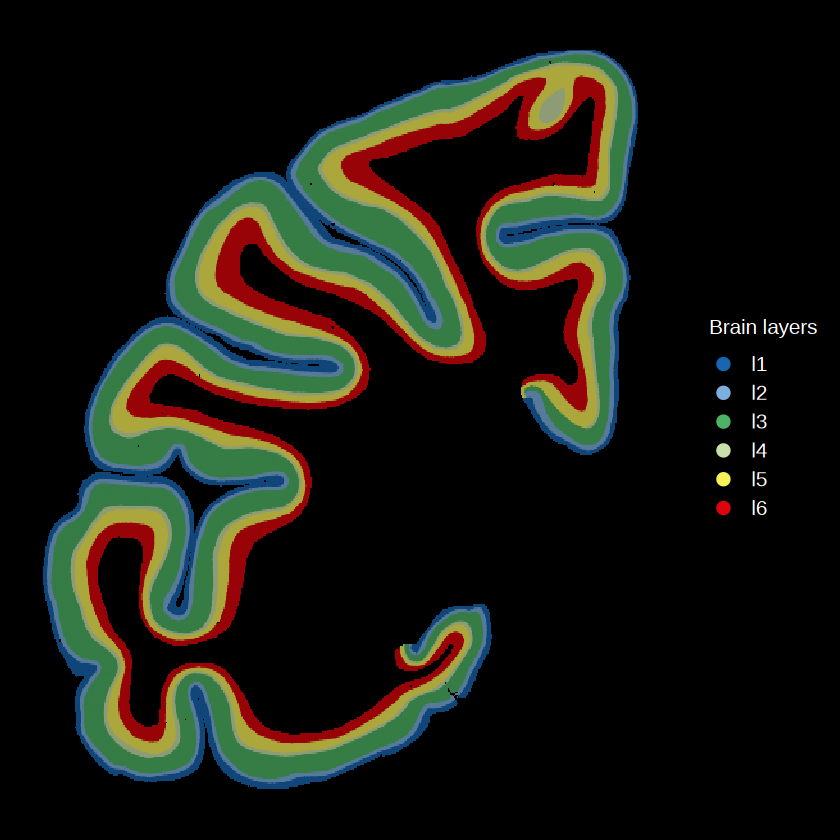

In [10]:
raster.dpi=c(512, 512)
playerno = ggplot() +
    scattermore::geom_scattermore(
      data = backpt[backpt$subcortical == "Cortex",],
      aes(x, y, color = layer),
      pixels = raster.dpi,
      pointsize = 0.7
    ) +
    # geom_point(data = refpos,
    #            aes(x, y, color = arealayer),size = 0.01) + 
    # geom_text(data = reflabel, aes(y = ymid, x = xmid, label= areaid),
    #           color = "white") +
    scale_color_discreterainbow() +
    guides(color = guide_legend(override.aes = list(size=3),
                                title = "Brain layers")) +
    theme_presentation() + scale_x_reverse() + scale_y_reverse()
playerno
ggexport(playerno,filename = "downstream_analysis/result/figure_revision/T42_annotation_layer_25_11_26.pdf",width = 6,height = 6)

In [73]:
unique(fsraw.t42$subcortical)
unique(fsraw.t47$subcortical)

[1] "Cortex"      "Midbrain"    "Pons"        "Ventricle"   "Thalamus"   
[6] "Striatum"    "Hippocampus" "Cerebellum"

[1] "Cortex"         "Hypothalamus"   "Thalamus"       "Ventricle"     
 [5] "Striatum"       "Midbrain"       "Hippocampus"    "Amygdala"      
 [9] "Globuspallidus" "Whitematter"    "Claustrum"      NA

### Transcript expression compare between replicates

In [ ]:
hubtrans = fsraw.t44 %>% group_by(gene_id) %>% filter(length(unique(transcript_id)) > 1)
hubtrans = unique(hubtrans$transcript_id)

In [315]:
TranstBasic = function(fsraw.t44,sample){
    transt.t44 = fsraw.t44[!is.na(fsraw.t44$areatr),] %>% 
        # group_by(gene_id) %>% 
        # mutate(genecount = length(unique(readid))) %>% 
        group_by(areatr,transcript_id) %>% 
        summarise(count = length(unique(readid)))
    transt.t44$norm = as.vector(scale(log10(transt.t44$count)))
    transt.t44 = transt.t44[,c("areatr","transcript_id","count","norm")]
    transt.t44$sample = sample
    # colnames(transt.t44)[3] = sample
    return(transt.t44)
}
fsraw.t44$areatr = fsraw.t44$subcortical
fsraw.t42$areatr = fsraw.t42$subcortical
fsraw.t47$areatr = fsraw.t47$subcortical
# fsraw.t44[fsraw.t44$areatr != "Cortex",]$areatr = "Other"
# fsraw.t42[fsraw.t42$areatr != "Cortex",]$areatr = "Other"
# fsraw.t47[fsraw.t47$areatr != "Cortex",]$areatr = "Other"
fsraw.me$areatr = "Hindbrain"
fsraw.vm$areatr = "Cortex"
# fsraw.t44$areatr = fsraw.t44$subcortical
transt.me = TranstBasic(fsraw.me,"M3_1")
transt.vm = TranstBasic(fsraw.vm,"M2_1")
transt.t44 = TranstBasic(fsraw.t44,"M1_1")
transt.t42 = TranstBasic(fsraw.t42,"M1_2")
transt.t47 = TranstBasic(fsraw.t47,"M1_3")
transt.all = rbind(transt.me,transt.vm,transt.t44,transt.t42,transt.t47)
transt.allf = transt.all[transt.all$count > 10,]

# transt.t44.cb = TranstBasic(fsraw.t44[fsraw.t44$subcortical %in% c("Cerebellum"),],"M1_1_Cb")
# transt.t42.cb = TranstBasic(fsraw.t42[fsraw.t42$subcortical %in% c("Cerebellum"),],"M1_2_Cb")
# transt.t47.cb = TranstBasic(fsraw.t47[fsraw.t47$subcortical %in% c("Cerebellum"),],"M1_3_Cb")
# fsraw.vm = rt_vm116 %>% group_by(readid) %>% filter(length(unique(transcript_id)) == 1)
# fsraw.me = rt_me01 %>% group_by(readid) %>% filter(length(unique(transcript_id)) == 1)

In [322]:
transt.all = rbind(transt.me,transt.vm,transt.t44,transt.t42,transt.t47)
transt.all[transt.all$sample %in% c("M1_1","M1_2","M1_3") & transt.all$areatr != "Cortex",]$areatr = "Other"

transt.all = transt.all %>% group_by(transcript_id,sample,areatr) %>% summarise(count = sum(count))
transt.all = transt.all %>% group_by(sample,areatr) %>% mutate(norm = as.vector(scale(log10(count))))
transt.allf = transt.all[transt.all$count > 10,]
head(transt.allf)
# transt.cmp.hub = apply(transt.cmp.hub,MARGIN = 2,FUN = function(x){ as.vector(log10(x))})

`summarise()` has grouped output by 'transcript_id', 'sample'. You can override
using the `.groups` argument.


transcript_id,sample,areatr,count,norm
<chr>,<chr>,<chr>,<int>,<dbl>
AAAS-FS-1,M1_1,Cortex,104,0.09348470
AAAS-FS-1,M1_1,Other,31,0.00551970
AAAS-FS-1,M1_3,Cortex,13,-0.50503135
AAAS-FS-2,M1_1,Cortex,22,-0.52465652
AADAT-FS-1,M1_1,Cortex,77,-0.02613062
AADAT-FS-1,M1_3,Cortex,39,-0.03754030


[1] 82509

[1] 28420

file saved to result/figure_revision/replicates_compare_transcript_expression_figure_25_12_30.pdf



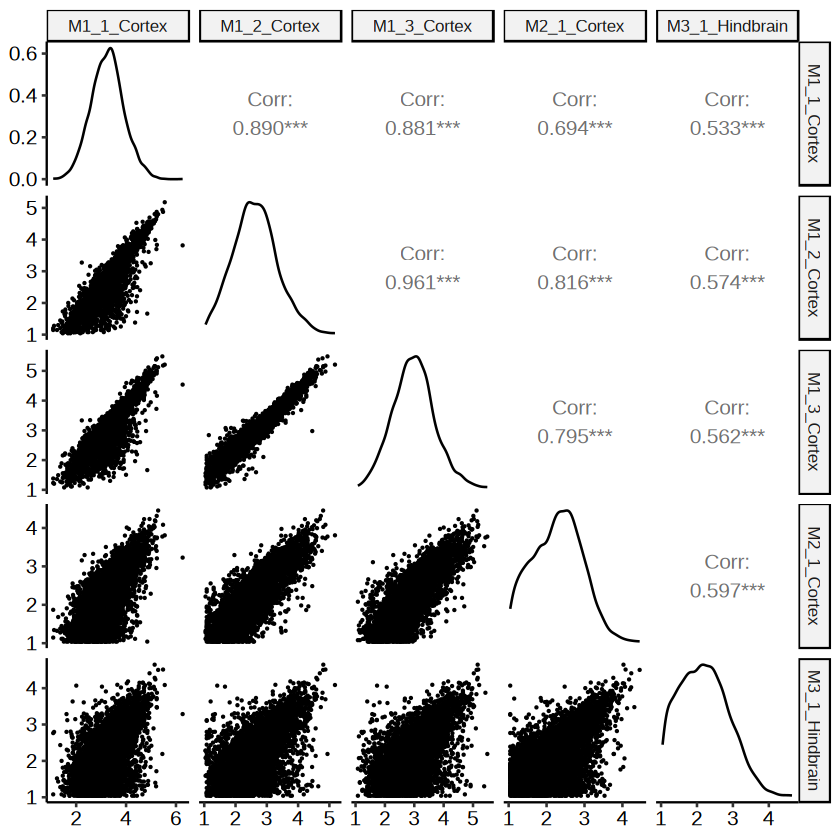

In [355]:
library(GGally)
transt.all = rbind(transt.me,transt.vm,transt.t44,transt.t42,transt.t47)
transt.allf = transt.all[transt.all$count > 10,]
transt.allf = transt.allf[transt.allf$areatr %in% c("Cortex","Hindbrain"),]
transt.allf = transt.allf %>% group_by(sample,areatr) %>% mutate(norm = scale(log10(count)))
nrow(transt.allf)
transt.allf = transt.allf %>% group_by(transcript_id) %>% filter(length(unique(sample)) >= 5)
nrow(transt.allf)
transt.allf$log = log10(transt.allf$count)
transt.cmp = dcast(transt.allf,transcript_id~sample+areatr,value.var = "log",fill = 0)
transt.cmp = transt.cmp[rowSums(transt.cmp[-1] != 0) == c(ncol(transt.cmp) -1),]

p1.1 = ggpairs(transt.cmp[, c(2:ncol(transt.cmp))], 
        upper = list(continuous = wrap("cor", method = "pearson")),
        lower = list(continuous = wrap("points",size = 0.1))) + 
        # xlim(c(-1,6)) + ylim(c(-1,6)) + 
        theme_pubr()
p1.1
ggexport(p1.1,filename = "result/figure_revision/replicates_compare_transcript_expression_figure_25_12_30.pdf",width = 5,height = 4)
write.csv(transt.cmp,file = "result/figure_revision/replicates_compare_transcript_expression.csv",quote = FALSE,row.names = F)

In [353]:
colnames(transt.allf)

[1] "areatr"        "transcript_id" "count"         "norm"         
[5] "sample"        "log"

Warning message in left_join(., long_data, by = c(x_var = "variable")):
"Detected an unexpected many-to-many relationship between `x` and `y`.
ℹ Row 1 of `x` matches multiple rows in `y`.
ℹ Row 1 of `y` matches multiple rows in `x`.
ℹ If a many-to-many relationship is expected, set `relationship =
  "many-to-many"` to silence this warning."
file saved to result/figure_revision/replicates_compare_transcript_expression_figure_neighbor_25_12_30.pdf



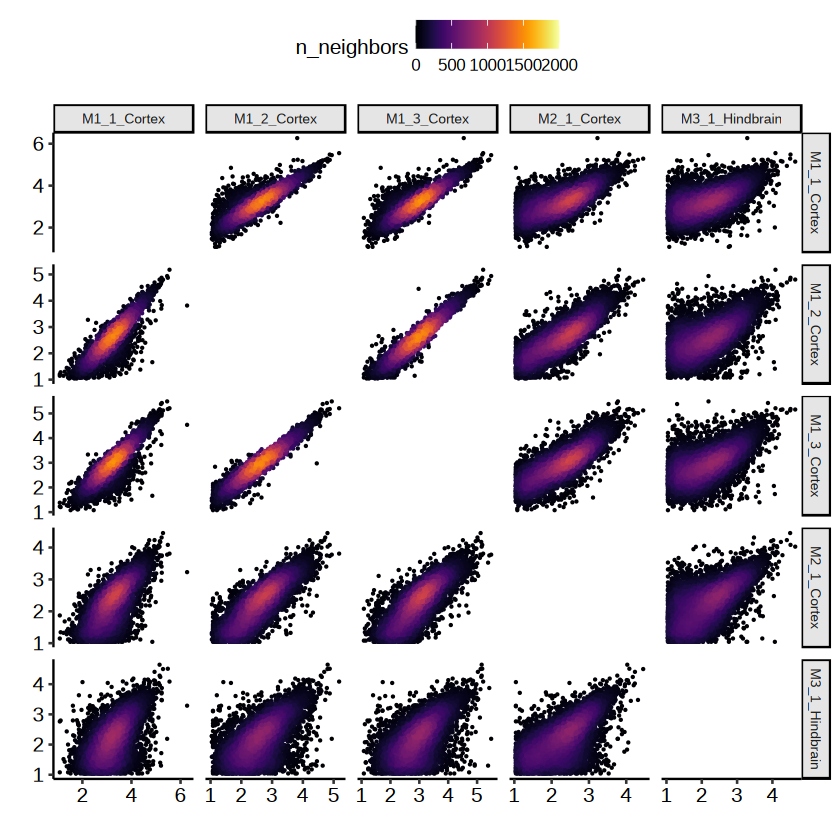

In [356]:
# 基础散点图矩阵
# 将宽格式转换为超长格式
library(tidyr)
long_data <- transt.cmp %>%
  pivot_longer(
    cols = c(M1_1_Cortex,M1_2_Cortex,M1_3_Cortex,M2_1_Cortex,M3_1_Hindbrain),
    names_to = "variable", 
    values_to = "value"
  ) %>%
  filter(!is.na(value))  # 移除NA值

# 创建变量对组合用于散点图矩阵
var_pairs <- expand.grid(
  x_var = unique(long_data$variable),
  y_var = unique(long_data$variable),
  stringsAsFactors = FALSE
)

# 为每个变量对创建对应的数值数据
plot_data <- var_pairs %>%
  left_join(long_data, by = c("x_var" = "variable")) %>%
  rename(x_value = value) %>%
  left_join(long_data, by = c("y_var" = "variable", "transcript_id" = "transcript_id")) %>%
  rename(y_value = value) %>%
  filter(!is.na(x_value), !is.na(y_value))  # 确保没有缺失值


library(ggpointdensity)
p <- ggplot(plot_data[plot_data$x_var != plot_data$y_var,], aes(x = x_value, y = y_value)) +
  geom_pointdensity(size = 0.1) +
  scale_color_viridis(option = "B",
    limits = c(0, 2000),
    oob = scales::squish) +
 # scale_color_gradient2(low = "#440D54",mid = "#20A386",high = "#FDE725",midpoint = 1000) +
  facet_grid(y_var ~ x_var, scales = "free") +  # 关键：使用facet_grid创建矩阵
  labs(x = "", y = "") +
  theme_pubr() +
  theme(
    panel.spacing = unit(0.5, "lines"),
    strip.background = element_rect(fill = "grey90"),
    strip.text = element_text(size = 8)
  ) 
# xlim(1, 6) + ylim(1, 6)
p
ggexport(p,filename = "result/figure_revision/replicates_compare_transcript_expression_figure_neighbor_25_12_30.pdf",width = 5,height = 5)


In [360]:
head(fsraw.t47)

cidPos,readid,tranid,type,transcript_id,gene_id,sample,cell_label,gene_area,x,y,origin_name,cell_type,subclass,class,region,layer,group,subcortical,areatr
<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
10000_105826,read_6160281|adapterG_RC-adapterH_RC|5954-6560(-),215226,compatible,NM_001283712.1,TAGLN,T47_revo,948063,900,10000,105826,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex,Cortex
10000_105826,read_16822062|adapterG_RC-adapterH_RC|5954-6560(-),215226,compatible,NM_001283712.1,TAGLN,T47_revo,948063,900,10000,105826,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex,Cortex
10000_108587,read_5998725|adapterM_RC-adapterN_RC|1495-1952(-),224049,compatible,XM_005548772.2,ATP5O,T47_revo,0,900,10000,108587,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex,Cortex
10000_108587,read_16660506|adapterM_RC-adapterN_RC|1495-1952(-),224049,compatible,XM_005548772.2,ATP5O,T47_revo,0,900,10000,108587,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex,Cortex
10000_109072,read_6443305|adapterB_RC-adapterC_RC|9953-10779(-),271096,compatible,XM_015449558.1,CUTA,T47_revo,0,900,10000,109072,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex,Cortex
10000_109072,read_17105086|adapterB_RC-adapterC_RC|9953-10779(-),271096,compatible,XM_015449558.1,CUTA,T47_revo,0,900,10000,109072,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex,Cortex


In [361]:
#PCA for platform
fsraw.t44$areatr = fsraw.t44$group
fsraw.t42$areatr = "Pacbio"
fsraw.t47$areatr = fsraw.t47$group
fsraw.me$areatr = "Pacbio"
fsraw.vm$areatr = "Pacbio"
transt.me = TranstBasic(fsraw.me,"M3_1")
transt.vm = TranstBasic(fsraw.vm,"M2_1")
transt.t44 = TranstBasic(fsraw.t44,"M1_1")
transt.t42 = TranstBasic(fsraw.t42,"M1_2")
transt.t47 = TranstBasic(fsraw.t47,"M1_3")
transt.all.pt = rbind(transt.me,transt.vm,transt.t44,transt.t42,transt.t47)
unique(transt.all.pt$areatr)
# transt.allf = transt.all[transt.all$count > 10,]

`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'areatr'. You can override using the
`.groups` argument.


[1] "Pacbio"  "cycf"    "ontd"    "ontf"    "pacbio"  "Cyclone" "ONT"

In [367]:
transt.all.pt[transt.all.pt$areatr == "pacbio",]$areatr = "FS-Pacbio"
transt.all.pt[transt.all.pt$areatr == "Pacbio",]$areatr = "FS-Pacbio"
transt.all.pt[transt.all.pt$areatr == "ontd",]$areatr = "Direct-ONT"
transt.all.pt[transt.all.pt$areatr == "ontf",]$areatr = "FS-ONT"
transt.all.pt[transt.all.pt$areatr == "cycf",]$areatr = "FS-Cyclone"
transt.all.pt[transt.all.pt$areatr == "Cyclone",]$areatr = "FS-Cyclone"
transt.all.pt[transt.all.pt$areatr == "ONT",]$areatr = "FS-ONT"
head(transt.all.pt)

areatr,transcript_id,count,norm,sample
<chr>,<chr>,<int>,<dbl>,<chr>
FS-Pacbio,ABCC12-FS-1,1,-1.3729715,M3_1
FS-Pacbio,ABLIM1-FS-1,4,-0.7597323,M3_1
FS-Pacbio,ACAA1-FS-1,1,-1.3729715,M3_1
FS-Pacbio,ACACA-FS-1,1,-1.3729715,M3_1
FS-Pacbio,ACTL6A-FS-2,1,-1.3729715,M3_1
FS-Pacbio,ADARB1-FS-1,1,-1.3729715,M3_1


In [369]:
transtmx = dcast(transt.all.pt[transt.all.pt$count > 10,],
                 sample+areatr~transcript_id,value.var = "norm",fill = 0)
head(transtmx[,1:5])

,sample,areatr,AAAS-FS-1,AAAS-FS-2,AADAT-FS-1
,<chr>,<chr>,<dbl>,<dbl>,<dbl>
1,M1_1,Direct-ONT,0.00000000,0.0000000,-0.42782319
2,M1_1,FS-Cyclone,0.11970470,0.0000000,-0.35697277
3,M1_1,FS-ONT,0.33846965,-0.3909202,0.05077772
4,M1_1,FS-Pacbio,-0.07963166,0.0000000,-0.17427056
5,M1_2,FS-Pacbio,-0.46464905,0.0000000,0.00000000
6,M1_3,FS-Cyclone,0.00000000,0.0000000,0.00000000


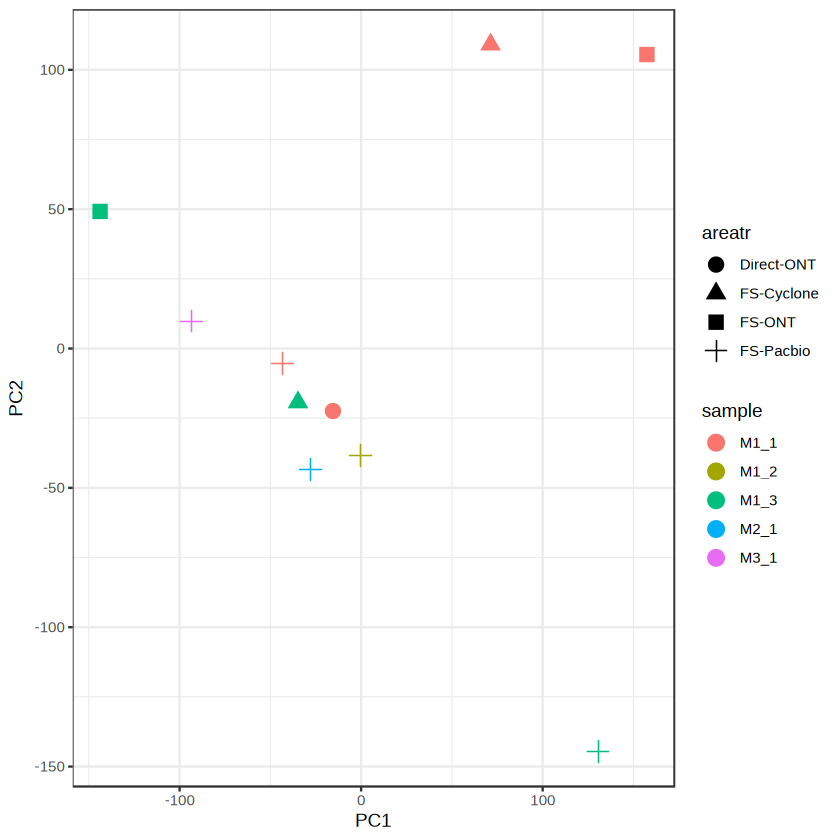

In [377]:
pca_clean <- transtmx[,-c(1,2)]
# dim(pca_data_clean)
# pca_data_clean = pca_data_clean[,colSums(pca_data_clean > 0.01 & pca_data_clean < 0.99) > 1 ]

pca_clean = pca_clean[,colSums(pca_clean != 0) >= 2]
res.pca <- prcomp(pca_clean, scale = TRUE)
res.pcadf = as.data.frame(res.pca$x)
res.pcadf$sample = transtmx$sample
res.pcadf$areatr = transtmx$areatr
p1.0 = ggplot(res.pcadf,aes(x = PC1,y = PC2,color = sample,shape = areatr)) + 
                geom_point(size = 4) + theme_bw()
p1.0

### transcript stat DTU calculate

In [64]:
#calculate DTUs
transtls = list()
FullLengthTranSt = function(fs.info){
      transtl = fs.info %>% group_by(gene_id, areatr) %>% 
        mutate(genecount = length(unique(readid))) %>% 
        group_by(gene_id,transcript_id,areatr) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount))
      transtl = transtl[transtl$areatr != "" &
                          !is.na(transtl$areatr),]
      return(transtl)
}

#build data
BuildTransls = function(fsraw.cor){
    
    #layer
    # npclf = npclf[npclf$arealayer %in% paste0("l",1:6),]
    fs.info.cortex = fsraw.cor[fsraw.cor$subcortical %in% paste0("Cortex"),]
    fs.info.cortex$areatr = fs.info.cortex$layer
    transtls$layer = FullLengthTranSt(fs.info.cortex)
    
    # #region
    fs.info.cortex$areatr = fs.info.cortex$region
    transtls$region = FullLengthTranSt(fs.info.cortex)
    
    #lobe
    fs.info.cortex$areatr = fs.info.cortex$lobe
    transtls$lobe = FullLengthTranSt(fs.info.cortex)
    
    #subclass
    fs.info.cortex$areatr = fs.info.cortex$subclass
    transtls$subclass = FullLengthTranSt(fs.info.cortex)
    
    #class
    fs.info.cortex$areatr = fs.info.cortex$class
    transtls$class = FullLengthTranSt(fs.info.cortex)

    # subcortical
    fsraw.cor$areatr = fsraw.cor$subcortical
    transtls$subcortical = FullLengthTranSt(fsraw.cor)
    return(transtls)
}

CalSigIsoform = function(transt){
    transt = transt[!is.na(transt$areatr),]
    transt = transt[transt$areatr != "",]
    transt$relative = transt$count/transt$genecount
    #transtf = transt[transt$count > 5,]
    transtf = transt[transt$genecount > 20,]
    transtf = transtf %>% group_by(transcript_id) %>% 
      mutate(meanrelative = mean(relative),
             otherrelative = (sum(relative) - relative)/(n() - 1))
    transtf = transtf[which(transtf$meanrelative > 0.05),]

    arean = length(unique(transtf$areatr))

    #areanth = arean*(1/3)
   # print(areanth)
    transtf = transtf %>% group_by(transcript_id) %>% 
       filter(length(unique(areatr)) > 1)
    transtf = transtf %>% group_by(gene_id) %>% 
      filter(length(unique(transcript_id))>1)
    
    # transtf$lfc = log2(transtf$relative/transtf$meanrelative)
    transtf$dr = transtf$relative - transtf$otherrelative
    transtf$sig = "N"
    table(transtf$sig)
    
    #transtf$pvalue = 1
    MyChiqTest = function(transcript_id, areatr, count){
      dat = data.frame(transcript_id = transcript_id, areatr = areatr,
                       count = count)
      dat = dcast(dat, areatr~transcript_id,
                  value.var = "count",
                  fun.aggregate = sum)
      rownames(dat) = dat$areatr;dat = dat[-1]
      p = tryCatch(chisq.test(as.matrix(dat))$p.value, 
                   error = function(e) NA)
      return(p)
    }
    pvdf = transtf %>% group_by(gene_id) %>% summarise(pvalue = MyChiqTest(transcript_id, areatr, count))
    pvdf$padj = p.adjust(pvdf$pvalue,method = "BH")
    transtf = merge(transtf,pvdf,by = "gene_id")
    #print(head(transtf))
    # table(transtf[transtf$padj < 0.05,]$sig)
    #transtf[transtf$padj < 0.05,]$sig = "Y"
    transtf[which(transtf$dr > 0.1 & transtf$padj < 0.05 & transtf$count > 10), "sig"] = "Up"
    transtf[which(transtf$dr < -0.1 & transtf$padj < 0.05 & transtf$count > 10), "sig"] = "Down"
    return(transtf)
}



In [ ]:
transtls.t47 = BuildTransls(fsraw.t47)
transtls.t42 = BuildTransls(fsraw.t42)
qsave(transtls.t47,"data/reads_full_anotation/T47_read_trans_stat_list_dedup_fsrawcor_25_12_16.qs")
qsave(transtls.t42,"data/reads_full_anotation/T42_read_trans_stat_list_dedup_fsrawcor_25_12_16.qs")

transtls = transtls.t47
isosigls = list()
for (i in 1:length(transtls)) {
    print(i)
    isosigls[[i]] = CalSigIsoform(transtls[[i]])
}
names(isosigls) = names(transtls)
for (i in 1:length(isosigls)) {
    print(length(unique(isosigls[[i]][isosigls[[i]]$sig!="N",]$gene_id)))
}
isosigls.t47 = isosigls
qsave(isosigls.t47,file = "data/dtu_analysis/T47_dtu_isoform_ls_fsraw_cor_25_12_16.qs")

transtls = transtls.t42
isosigls = list()
for (i in 1:length(transtls)) {
    print(i)
    isosigls[[i]] = CalSigIsoform(transtls[[i]])
}
names(isosigls) = names(transtls)
for (i in 1:length(isosigls)) {
    print(length(unique(isosigls[[i]][isosigls[[i]]$sig!="N",]$gene_id)))
}
isosigls.t42 = isosigls
qsave(isosigls.t42,file = "data/dtu_analysis/T42_dtu_isoform_ls_fsraw_cor_25_12_16.qs")

## Celltype replicates calculate and plot

In [10]:
#debug T42
fsraw.raw.t42 = qread("/cluster/home/liuhengxin/P1_brain_nanopore/processed_data/T42_analysis/Revo/T42_trans_total_anno_withcid_an_25_11_21.qs")
head(fsraw.raw.t42)

,cidPos,readid,tranid,type,sample,transcript_id,gene_id,V1,x,y,⋯,cell_id,cell_type_id,cell_type,subclass,class,global_region_id,origin_name,layer,region,subcortical
,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,⋯,<dbl>,<dbl>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>
1,10000_22740,read_1179842|adapterI_RC|5173-6092(-),34232,compatible,T42_revo,LOC102116757-WeiLab-1,LOC102116757,248997023,10000,22740,⋯,NA,NA,,,,288,L-3a/b-l1,l1,3a/b,Cortex
2,10000_22740,read_9836492|adapterI_RC|5173-6092(-),34232,compatible,T42_revo,LOC102116757-WeiLab-1,LOC102116757,248997023,10000,22740,⋯,NA,NA,,,,288,L-3a/b-l1,l1,3a/b,Cortex
3,10000_22740,read_1179842|adapterI_RC|5173-6092(-),34233,compatible,T42_revo,LOC102116757-WeiLab-2,LOC102116757,248997023,10000,22740,⋯,NA,NA,,,,288,L-3a/b-l1,l1,3a/b,Cortex
4,10000_22740,read_9836492|adapterI_RC|5173-6092(-),34233,compatible,T42_revo,LOC102116757-WeiLab-2,LOC102116757,248997023,10000,22740,⋯,NA,NA,,,,288,L-3a/b-l1,l1,3a/b,Cortex
5,10000_22740,read_9836492|adapterI_RC|5173-6092(-),72966,compatible,T42_revo,XM_005592569.2,LOC102116757,248997023,10000,22740,⋯,NA,NA,,,,288,L-3a/b-l1,l1,3a/b,Cortex
6,10000_22740,read_1179842|adapterI_RC|5173-6092(-),72966,compatible,T42_revo,XM_005592569.2,LOC102116757,248997023,10000,22740,⋯,NA,NA,,,,288,L-3a/b-l1,l1,3a/b,Cortex


In [62]:
# nrow(fsraw.t47)
fsraw.t42 = qread("/cluster/home/liuhengxin/P1_brain_nanopore/processed_data/T42_analysis/Revo/T42_trans_total_anno_withcid_an_25_11_21.qs")
# fsraw.t47 = qread("/cluster/home/liuhengxin/P1_brain_nanopore/processed_data/T47_analysis/T47_trans_total_anno_withcid_an_allsample_25_10_24.qs")
nrow(fsraw.t42)
fsraw.t42.equal = fsraw.t42[fsraw.t42$type == "equal",]
nrow(fsraw.t42.equal)
fsraw.t42.cmp = fsraw.t42[fsraw.t42$type != "equal",]
nrow(fsraw.t42.cmp)
fsraw.t42.cmp = fsraw.t42.cmp[!fsraw.t42.cmp$readid %in% fsraw.t42.equal$readid,]
nrow(fsraw.t42.cmp)
fsraw.t42 = rbind(fsraw.t42.cmp,fsraw.t42.equal)
fsraw.t42 = fsraw.t42[fsraw.t42$transcript_id %in% gtfdfant.kn$transnew,]
nrow(fsraw.t42)
fsraw.t42$transcript_id = gtfdfant.kn[match(fsraw.t42$transcript_id,gtfdfant.kn$transnew),]$transnew2
# fsraw.t47 = fsraw.t47 %>% group_by(readid) %>% filter(length(unique(transcript_id)) == 1)
# nrow(fsraw.t47)
qsave(fsraw.t42,"downstream_analysis/data/reads_full_anotation/T42_main_data_read_total_annotation_nodelete_total_25_12_01.qs")

[1] 78658747

[1] 6595785

[1] 72062962

[1] 71466549

[1] 45894018

In [12]:
qsave(fsraw.t42,"downstream_analysis/data/reads_full_anotation/T42_main_data_read_total_annotation_delete_multiread_total_25_12_01.qs")

[1] 16532859

In [14]:
gtfdfant.kn = read.csv("downstream_analysis/ref/gtf_filter_final_with_newname_25_10_09.csv")
fsraw.raw.t42 = fsraw.raw.t42[fsraw.raw.t42$transcript_id %in% gtfdfant.kn$transnew,]
nrow(fsraw.raw.t42)
fsraw.raw.t42$transcript_id = gtfdfant.kn[match(fsraw.raw.t42$transcript_id,gtfdfant.kn$transnew),]$transnew2
fsraw.t42 = fsraw.raw.t42 %>% group_by(readid) %>% filter(length(unique(transcript_id)) == 1)
nrow(fsraw.t42)
qsave(fsraw.t42,"downstream_analysis/data/reads_full_anotation/T42_main_data_read_total_annotation_delete_multiread_total_25_12_01.qs")

[1] 45894018

[1] 15270278

In [43]:
nrow(fsraw.t47)
fsraw.t47 = qread("/cluster/home/liuhengxin/P1_brain_nanopore/processed_data/T47_analysis/T47_trans_total_anno_withcid_an_allsample_25_10_24.qs")
nrow(fsraw.t47)
fsraw.t47.equal = fsraw.t47[fsraw.t47$type == "equal",]
nrow(fsraw.t47.equal)
fsraw.t47.cmp = fsraw.t47[fsraw.t47$type != "equal",]
nrow(fsraw.t47.cmp)
fsraw.t47.cmp = fsraw.t47.cmp[!fsraw.t47.cmp$readid %in% fsraw.t47.equal$readid,]
nrow(fsraw.t47.cmp)
fsraw.t47 = rbind(fsraw.t47.cmp,fsraw.t47.equal)
fsraw.t47 = fsraw.t47[fsraw.t47$transcript_id %in% gtfdfant.kn$transnew,]
nrow(fsraw.t47)
fsraw.t47$transcript_id = gtfdfant.kn[match(fsraw.t47$transcript_id,gtfdfant.kn$transnew),]$transnew2
# fsraw.t47 = fsraw.t47 %>% group_by(readid) %>% filter(length(unique(transcript_id)) == 1)
# nrow(fsraw.t47)
qsave(fsraw.t47,"downstream_analysis/data/reads_full_anotation/T47_main_data_read_total_annotation_nodelete_total_25_12_01.qs")

[1] 43585333

[1] 234216126

[1] 19880371

[1] 214335755

[1] 211884845

[1] 129428580

In [25]:
fsraw.t47 = fsraw.t47 %>% group_by(readid) %>% filter(length(unique(transcript_id)) == 1)
nrow(fsraw.t47)
qsave(fsraw.t47,"downstream_analysis/data/reads_full_anotation/T47_main_data_read_total_annotation_delete_multiread_total_25_12_01.qs")

[1] 43855709

In [28]:
groupan = data.frame("abv" = c("cb","cortex","HC","mb","p","str","v","amy","HyTh","cla","wm","th","GP"),
                       "ano" = c("Cerebellum","Cortex","Hippocampus","Midbrain",
                                 "Pons","Striatum","Ventricle","Amygdala","Hypothalamus",
                                 "Claustrum","Whitematter","Thalamus","Globuspallidus"))
fsraw.t47$subcortical = fsraw.t47$layer
fsraw.t47[fsraw.t47$subcortical %in% paste0("l",1:6),]$subcortical = "cortex"
fsraw.t47 = fsraw.t47[!fsraw.t47$subcortical %in% c("c","f"),]
fsraw.t47$subcortical = groupan[match(fsraw.t47$subcortical,groupan$abv),]$ano
nrow(fsraw.t47)
qsave(fsraw.t47,"downstream_analysis/data/reads_full_anotation/T47_main_data_read_total_annotation_delete_multiread_total_25_12_01.qs")

[1] 43585333

In [32]:
isosigls.t47 = qread("downstream_analysis/data/dtu_analysis/T47_dtu_isoform_ls_fsraw_cor_25_12_01.qs")

In [49]:
isosigi = isosigls.t42$subclass
isosigi[isosigi$gene_id == "SIVA1",]

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
17394,SIVA1,XM_005562346.2,ASC,60,68,0.88235294,0.8993675,0.9006763,-0.018323320,N,0.008520201,0.02194773
17395,SIVA1,XM_005562346.2,L2,86,100,0.86000000,0.8993675,0.9023957,-0.042395718,N,0.008520201,0.02194773
17396,SIVA1,XM_005562346.2,L2/3,224,252,0.88888889,0.8993675,0.9001735,-0.011284607,N,0.008520201,0.02194773
17397,SIVA1,XM_005562346.2,L2/3/4,50,52,0.96153846,0.8993675,0.8945851,0.066953395,N,0.008520201,0.02194773
17398,SIVA1,XM_005562346.2,L3/4,154,174,0.88505747,0.8993675,0.9004682,-0.015410749,N,0.008520201,0.02194773
17399,SIVA1,XM_005562346.2,L3/4/5,42,44,0.95454545,0.8993675,0.8951230,0.059422464,N,0.008520201,0.02194773
17400,SIVA1,XM_005562346.2,L4,94,110,0.85454545,0.8993675,0.9028153,-0.048269844,N,0.008520201,0.02194773
17401,SIVA1,XM_005562346.2,L4/5,180,212,0.84905660,0.8993675,0.9032375,-0.054180914,N,0.008520201,0.02194773
17402,SIVA1,XM_005562346.2,L4/5/6,84,98,0.85714286,0.8993675,0.9026155,-0.045472641,N,0.008520201,0.02194773


`summarise()` has grouped output by 'class', 'subclass', 'gene_id'. You can
override using the `.groups` argument.
Warning message:
"The dcast generic in data.table has been passed a grouped_df and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. Please do this redirection yourself like reshape2::dcast(casecti). In the next version, this warning will become an error."


,class,subclass,gene_id,1,2,groupid,geneidn
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1,GABA,LAMP5,ARPP19,0.1538462,0.8461538,11,2
2,GABA,LAMP5,DDRGK1,0.2500000,0.7500000,11,1
3,GABA,LAMP5,IDH3B,0.3333333,0.6666667,11,3
4,GABA,LAMP5,NTRK2,0.8181818,0.1818182,11,7
5,GABA,LAMP5,SIVA1,0.8750000,0.1250000,11,4
6,GABA,PVALB,ARPP19,0.2000000,0.8000000,14,2


file saved to result/figure3/T42_case_subclass_isoform_rate_stat_pie_25_12_02.pdf



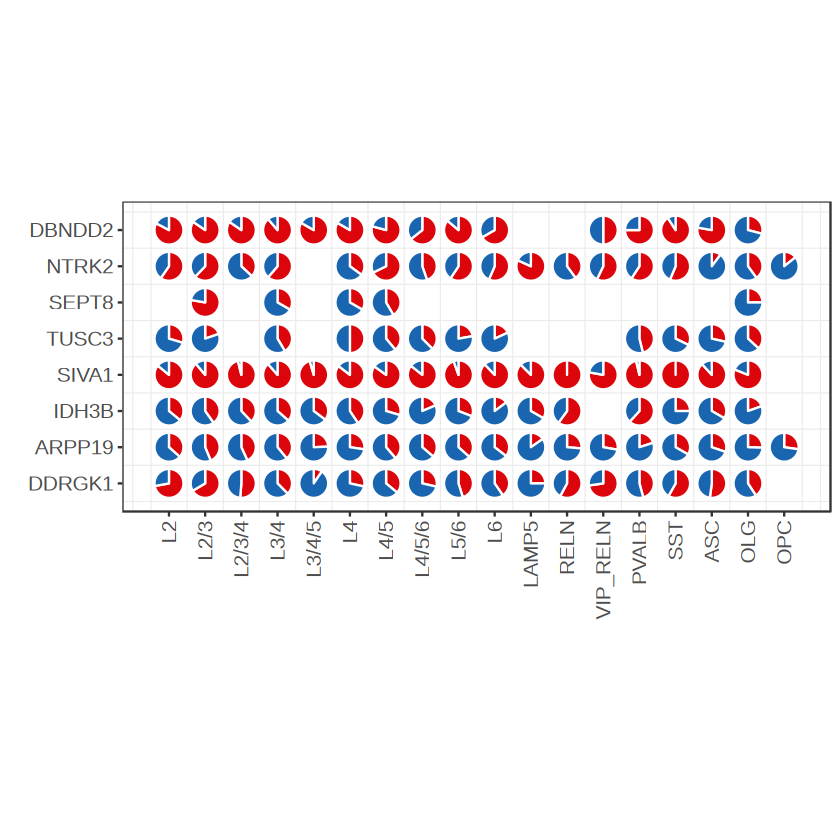

In [126]:
caseg = c("DDRGK1","ARPP19","IDH3B","SIVA1","TUSC3","SEPT8","NTRK2","DBNDD2")
hubtrans = c("XM_005568473.2","DDRGK1-FS-1","NM_001283415.1","XM_015452432.1","XM_005569136.2","XM_015429879.1",
            "XM_005582047.2","XM_005582051.2","XM_005582728.2","XM_005582727.1","XM_005562646.2","XM_005562645.2",
            "XM_005568512.1","XM_005568513.1","XM_005557741.2","XM_005557744.2","XM_005562346.2","XM_005562347.2")
fsraw.case = fsraw.t42[(fsraw.t42$gene_id %in% caseg) & (fsraw.t42$transcript_id %in% hubtrans),]
fsraw.case = fsraw.case %>% group_by(readid) %>% filter(length(unique(transcript_id)) == 1)
casect = fsraw.case[fsraw.case$subclass != "" & !is.na(fsraw.case$subclass),] %>% 
                group_by(class,subclass,gene_id,transcript_id) %>% 
                summarise(count = length(readid)) %>% 
                group_by(class,subclass,gene_id) %>% 
                mutate(genecount = sum(count),rate = count/genecount)
suborder = c('L2','L2/3','L2/3/4','L3/4','L3/4/5','L4','L4/5','L4/5/6','L5/6','L6','LAMP5','RELN',
             'VIP_RELN','VIP','PV_CHC',"PVALB",'SST','ASC','OLG','OPC','MG','EC','VLMC')

#caseg = unique(isosigi$gene_id)
# isosigi2 = isosigls.t47$subclass
# isosigi2 = isosigi2[isosigi2$sig != "N",]
# #isosigi2 = isosigi2[isosigi2$gene_id %in% caseg & isosigi2$sig != "N",] %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
# #isosigi = isosigi[isosigi$count > 20,]
# isosigi = isosigls.t47$subclass
# isosigi = isosigi %>% group_by(gene_id,areatr) %>% top_n(n = 3,wt = meanrelative)
# casecti = casect[casect$gene_id %in% caseg & casect$transcript_id %in% isosigi$transcript_id,]
casecti = casect
# casecti[!(casecti$transcript_id %in% isosigi2$transcript_id),]$transcript_id = "other"
# casecti = casecti %>% group_by(gene_id,transcript_id,class,subclass) %>% summarise(count = sum(count),
#                                                                             genecount = sum(genecount),
#                                                                             rate = count/genecount)
casecti = casecti[casecti$genecount > 10,]
casecti = casecti[!casecti$subclass %in% c("VLMC","VIP","PV_CHC","MG"),]

casecti = casecti %>% group_by(gene_id) %>% mutate(id = as.character(as.numeric(as.factor(transcript_id))))
casecti$gene_tran = paste0(casecti$gene_id,"-",casecti$id)
library(scatterpie)
casectl = dcast(casecti,class+subclass+gene_id~id,value.var = "rate")
casectl[is.na(casectl)] = 0
casectl = casectl[order(casectl$class,casectl$subclass),]
casectl$groupid = as.numeric(factor(casectl$subclass,levels = suborder[suborder %in% casectl$subclass]))
casectl$geneidn = as.numeric(factor(casectl$gene_id,levels = caseg))
head(casectl)
library(patchwork)
ison = casecti %>% group_by(gene_id) %>% summarise(transn = length(unique(transcript_id)))
ison = max(ison$transn)
# casectl$sig = 'N'
# casectl[paste0(casectl$subclass,casectl$gene_id) %in% paste0(isosigi2$areatr,isosigi2$gene_id),]$sig = "Y"
#caseg = c("INTU",'DNAJC7',"TUSC3","GRIP1","CACNB4","FAM173A","KLC1","MPG","MTG2","EIF5A","ARID4A","SIVA1","IDH3B")
#caseg = c("MYL6",'NTRK2',"DBNDD2","DDRGK1","ARPP19","ARPP21")
casectl$gene_id = factor(casectl$gene_id,levels = caseg)
#head(casectl)
plt = ggplot() + 
      geom_scatterpie(data = casectl[casectl$gene_id %in% caseg, ],
                      aes(x = groupid, y = geneidn, group = groupid,
                                           r = 0.4),
                      cols=colnames(casectl)[4:(4+ison-1)],color = "white") + 
      coord_fixed() +
      scale_x_continuous(breaks = c(1:length(unique(casectl$subclass))),labels = suborder[suborder %in% casectl$subclass]) +
      scale_y_continuous(breaks = c(1:length(caseg)),labels = caseg) +
      scale_color_manual(values = c("white","black")) +
      scale_fill_manual(values = c('#DC050C','#1965B0','#F7F056')) +
      # geom_smooth(data = tem2, aes(x=x, y=y), se = F, method = 'loess',color = "black") +
      # scale_fill_discreterainbow() +
      #annotate("text", x = 8, y = 7, label = caseg[i], hjust = 1.1, vjust = 1.1, size = 5, angle = 90) +
      ylab("") + xlab("") +
      theme_bw() + theme(legend.position="none",axis.text = element_text(size = 12),panel.grid.major = element_blank(),
                         axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1),
                        strip.background =element_rect(fill="white"))
plt
write.csv(casect,file = "result/figure3/T42_case_subclass_isoform_rate_stat_25_12_02.csv")
ggexport(plt,filename = "result/figure3/T42_case_subclass_isoform_rate_stat_pie_25_12_02.pdf",width = 6,height = 4)

In [ ]:
#subclass box plot
#genecs = c("MYL6","AKR1A1","CDC42")
# #trancs = c('XM_005595593.2','NM_001283401.1','MYL6-WeiLab-1')
# genecs = c("SEPT11","REXO2","CDC42")
# trancs = c('XM_015450063.1','NM_001287705.1','NM_001283401.1')
# ST8SIA5 XM_005586777.2
genecs = c("SEPT11","REXO2","CDC42")
trancs = c('XM_015450063.1','NM_001287705.1','NM_001283401.1')
casest = fsraw.t47[fsraw.t47$gene_id %in% genecs & fsraw.t47$subclass != "" & !is.na(fsraw.t47$subclass),]
casest = casest %>% group_by(readid) %>% filter(length(unique(transcript_id)) == 1)
casest = casest %>% 
        group_by(class,subclass,gene_id) %>%
        mutate(genecount = length(unique(readid))) %>% 
       # filter(genecount > 10) %>%
        group_by(class,subclass,gene_id,transcript_id) %>%
        summarise(count = length(unique(readid)),genecount = genecount[1])
casest$relative = casest$count/casest$genecount
#casest = casest[casest$count > 5,]
#casest = casest[casest$subclass != "",]
casest = casest[casest$subclass != "" & casest$transcript_id %in% trancs,]

#isosigi = isosigls$subclass
#casest = isosigi[isosigi$gene_id %in% genecs & isosigi$transcript_id %in%trancs,]
#casest = casest %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
#casest = merge(casest,cellan,by.x = "areatr",by.y = "subclass")
#casest = casest[casest$count > 5,]
casest$gene_id = paste0(casest$gene_id,"-",casest$transcript_id)
casest$gene_id = factor(casest$gene_id,levels = c("SEPT11-XM_015450063.1",
                                                 "REXO2-NM_001287705.1",
                                                 "CDC42-NM_001283401.1"))
casest$class = factor(casest$class,levels = c("GLU","GABA","NonNeuron"))
pcmp2 = ggplot(casest[casest$count > 10,],aes(x = class,y = relative,fill = class)) +  
    geom_half_violin(position = position_nudge(x=0.25),side = "r",width=0.8,color=NA)+  
    geom_boxplot(width=0.4,size=0.5,outlier.color =NA)+  
    geom_jitter(aes(fill=class),shape=21,size=2.5,width=0.2)+  
    stat_compare_means(method = "t.test",label = "p.signif",
                       ref.group = ".all.",
                       # comparisons = list(c("GLU","GABA"),c("GLU","NonNeuron"),c("NonNeuron","GABA")),
                       map_signif_level = T,
                       tip_length = c(0.02),size= 4,margin_top = 0.08)  +
    facet_wrap(.~gene_id,nrow = 1) +
    theme_bw()+  theme(panel.grid = element_blank(),legend.position = "top",
                       panel.border = element_rect(size = 1),
                       axis.text.x = element_blank(),
                       axis.text.y = element_text(color = "black",size = 13),
                       axis.ticks = element_blank())+  
    labs(x=NULL)+  scale_fill_manual(values = c("#F7F056",'#1965B0','#DC050C')) + ggtitle("") +
    #scale_y_continuous(limits = c(0,1)) + 
    ylab("Isoform ratio")
pcmp2
ggexport(pcmp2,filename = "downstream_analysis/result/figure3/T42_Class_DTU_case_box_plot_25_11_26.pdf",
           width = 6.5,height = 4)

`summarise()` has grouped output by 'class', 'gene_id'. You can override using
the `.groups` argument.


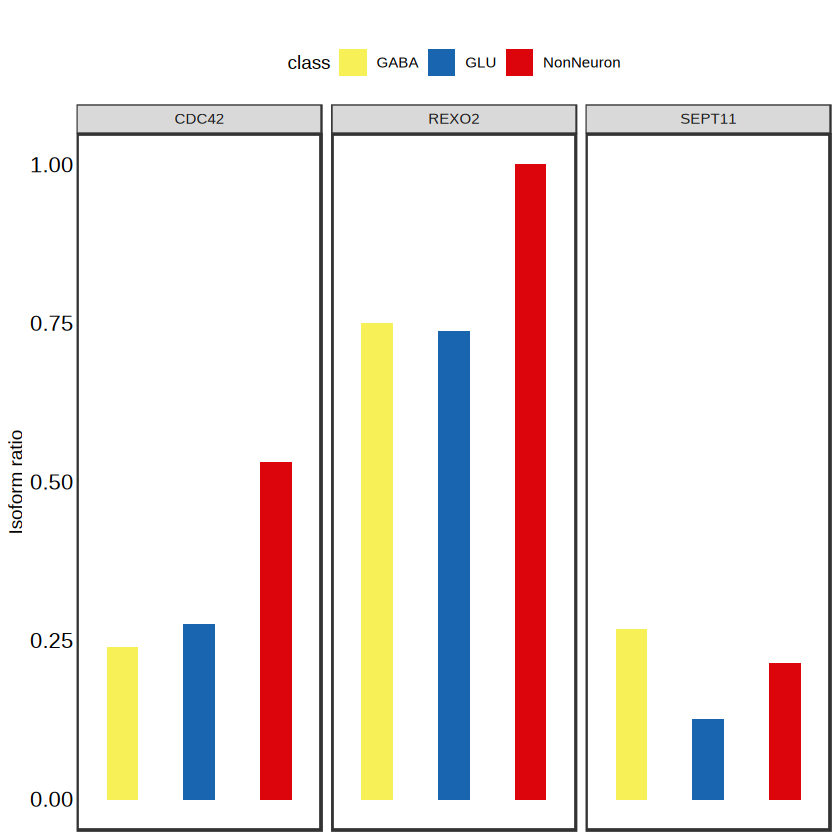

In [84]:
genecs = c("SEPT11","REXO2","CDC42")
trancs = c('XM_015450063.1','NM_001287705.1','NM_001283401.1')
casest = fsraw.t42[fsraw.t42$gene_id %in% genecs & fsraw.t42$subclass != "" & !is.na(fsraw.t42$subclass),]
casest = casest %>% group_by(readid) %>% filter(length(unique(transcript_id)) == 1)
casest = casest %>% 
        group_by(class,gene_id) %>%
        mutate(genecount = length(unique(readid))) %>% 
       # filter(genecount > 10) %>%
        group_by(class,gene_id,transcript_id) %>%
        summarise(count = length(unique(readid)),genecount = genecount[1])
casest$relative = casest$count/casest$genecount
casest = casest[casest$class != "" & casest$transcript_id %in% trancs,]
pcmp2 = ggplot(casest,aes(x = class,y = relative,fill = class)) +  
    geom_bar(width=0.4,stat = "identity")+  
    facet_wrap(.~gene_id,nrow = 1) +
    theme_bw()+  theme(panel.grid = element_blank(),legend.position = "top",
                       panel.border = element_rect(size = 1),
                       axis.text.x = element_blank(),
                       axis.text.y = element_text(color = "black",size = 13),
                       axis.ticks = element_blank())+  
    labs(x=NULL)+  scale_fill_manual(values = c("#F7F056",'#1965B0','#DC050C')) + ggtitle("") +
    #scale_y_continuous(limits = c(0,1)) + 
    ylab("Isoform ratio")
pcmp2

## System calculate DTU between replicates

In [146]:
#layer deep analysis
edget47 = qread("ref/areaedge_density_T47_12_02.qs")
edget42 = qread("ref/areaedge_density_T42_12_02.qs")
head(edget42)
edget44 = qread("../ref/area_figure_an.qs")
names(edget44)

,ind1,ind2,x1,y1,x2,y2,mx1,my1,mx2,my2,bp1,bp2,areaid
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,164560,164563,23873,86922,23878,86854,23864.60,86887.20,16589.89,86352.29,0,0,cb
2,1,164563,23879,86851,23878,86854,23610.48,86763.16,23886.67,86855.22,0,0,cb
3,6,7,23899,86659,23902,86705,23667.55,86697.19,23922.94,86680.54,0,0,cb
4,6,15,23899,86659,23914,86597,23775.88,86596.40,23635.15,86562.35,0,0,cb
5,164562,164564,23873,86964,23908,87087,23575.80,87115.05,23763.28,87061.70,0,0,cb
6,29,164571,23936,86404,23939,86372,23959.21,86390.04,23724.44,86368.03,0,0,cb


[1] "layeredges" "areaedges"  "player"     "parea"      "areaorder" 
[6] "reflabel"

In [147]:
write.csv(edget47[,c("x1","y1","areaid")],file = "ref/areaedge_coord_T47_12_16.csv",quote = F,row.names = F)
write.csv(edget42[,c("x1","y1","areaid")],file = "ref/areaedge_coord_T42_12_16.csv",quote = F,row.names = F)
write.csv(edget44$layeredges[,c("x1","y1","areaid")],file = "ref/areaedge_coord_T44_12_16.csv",quote = F,row.names = F)

In [211]:
#calculate jaccard score
# isosigi = isosigls$subcortical
# isosig.t42
# isosig.t47
jaccard_similarity <- function(vec1, vec2) {
  intersection <- length(intersect(vec1, vec2))
  union <- length(union(vec1, vec2))
  return(intersection/union)
}


DTUJaccard = function(isosigi1,isosigi2,thred){
    comarea = intersect(isosigi1$areatr,isosigi2$areatr)
    jcdf = NULL
    for(i in 1:length(comarea)){
        for(j in 1:length(comarea)){
            df1 = isosigi1[isosigi1$areatr == comarea[i],]
            df2 = isosigi2[isosigi2$areatr == comarea[j],]
            comgene = intersect(df1$gene_id,df2$gene_id)
            df1 = df1[(df1$gene_id %in% comgene) & (df1$sig != "N"),]
            df2 = df2[(df2$gene_id %in% comgene) & (df2$sig != "N"),]
            vec1 = paste0(df1$transcript_id,"-",df1$sig)
            vec2 = paste0(df2$transcript_id,"-",df2$sig)
            nt = length(comgene)
            nt1 = length(vec1)
            nt2 = length(vec2)
            jcv = jaccard_similarity(vec1,vec2)
            jcdf = rbind(jcdf,data.frame("Var1" = comarea[i],"Var2" = comarea[j],"value" = jcv,
                                         "nt" = nt,"nt" = nt1,"nt" = nt2))
        }
    }
    return(jcdf)
}


DTUCormx = function(isosigi1,isosigi2,thred){
    comarea = unique(intersect(isosigi1$areatr,isosigi2$areatr))
    jcdf = NULL
    for(i in 1:length(comarea)){
        for(j in 1:length(comarea)){
            df1 = isosigi1[isosigi1$areatr == comarea[i] & isosigi1$count > thred,]
            df2 = isosigi2[isosigi2$areatr == comarea[j] & isosigi2$count > thred,]
            # comgene = intersect(df1$gene_id,df2$gene_id)
            # df1 = df1[(df1$gene_id %in% comgene) & (df1$sig != "N"),]
            # df2 = df2[(df2$gene_id %in% comgene) & (df2$sig != "N"),]
            df = merge(df1[,c("transcript_id","dr")],df2[,c("transcript_id","dr")],by = "transcript_id")
            nt = nrow(df)
            if(nrow(df) < 50) next;
            corv = cor(df$dr.x,df$dr.y)
            jcdf = rbind(jcdf,data.frame("Var1" = comarea[i],"Var2" = comarea[j],"value" = corv,
                                         "nt" = nt))
        }
    }
    return(jcdf)
}
# isosigi1 = isosigls.t44$subcortical
# isosigi2 = isosigls.t42$subcortical


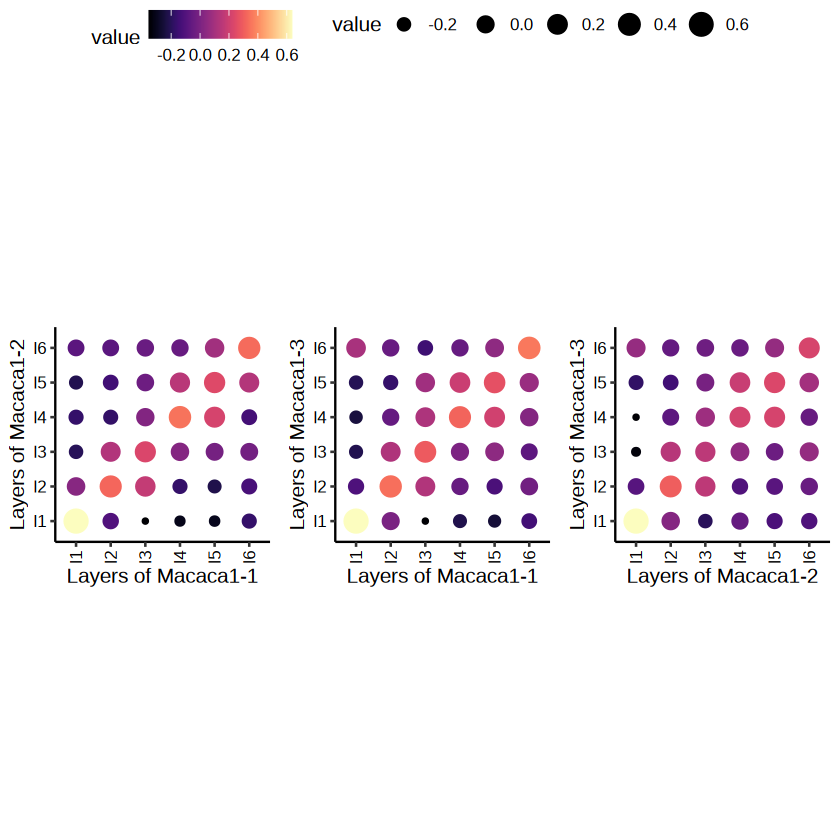

In [160]:
isosigi1 = isosigls.t44$layer
isosigi2 = isosigls.t42$layer
jcdf1 = DTUCormx(isosigi1,isosigi2,50)

p1.1 = ggplot(jcdf1,aes(x = Var1,y = Var2, color = value,size = value)) + geom_point() + 
    scale_color_viridis(option = "A") + theme_pubr() + coord_fixed(ratio = 1) +
    theme(
    axis.text.x = element_text(
      size = 10,
      angle = 90,vjust = 0.5,
      hjust = 1
    ),
    axis.text.y = element_text(
      size = 10
    ),
    legend.position = "right", 
    panel.grid.minor = element_blank(),
    panel.background = element_blank(),
    plot.background = element_rect(fill = "white", color = NA)
  ) + xlab("Layers of Macaca1-1")  + ylab("Layers of Macaca1-2")

isosigi1 = isosigls.t44$layer
isosigi2 = isosigls.t47$layer
jcdf2 = DTUCormx(isosigi1,isosigi2,50)
p1.2 = ggplot(jcdf2,aes(x = Var1,y = Var2, color = value,size = value)) + geom_point() + 
    scale_color_viridis(option = "A") + theme_pubr() + coord_fixed(ratio = 1) +
    theme(
    axis.text.x = element_text(
      size = 10,
      angle = 90,vjust = 0.5,
      hjust = 1
    ),
    axis.text.y = element_text(
      size = 10
    ),
    legend.position = "right", 
    panel.grid.minor = element_blank(),
    panel.background = element_blank(),
    plot.background = element_rect(fill = "white", color = NA)
  ) + xlab("Layers of Macaca1-1")  + ylab("Layers of Macaca1-3")

isosigi1 = isosigls.t42$layer
isosigi2 = isosigls.t47$layer
jcdf3 = DTUCormx(isosigi1,isosigi2,50)

p1.3 = ggplot(jcdf3,aes(x = Var1,y = Var2, color = value,size = value)) + geom_point() + 
    scale_color_viridis(option = "A") + theme_pubr() + coord_fixed(ratio = 1) +
    theme(
    axis.text.x = element_text(
      size = 10,
      angle = 90,vjust = 0.5,
      hjust = 1
    ),
    axis.text.y = element_text(
      size = 10
    ),
    legend.position = "right", 
    panel.grid.minor = element_blank(),
    panel.background = element_blank(),
    plot.background = element_rect(fill = "white", color = NA)
  ) + xlab("Layers of Macaca1-2")  + ylab("Layers of Macaca1-3")
p1t = ggarrange(p1.1,p1.2,p1.3,nrow = 1,common.legend = T)
p1t


In [161]:
ggexport(p1t,filename = "result/figure_revision/relicates_DTU_compare_layers_25_12_16.pdf",width = 9,height = 3)

file saved to result/figure_revision/relicates_DTU_compare_layers_25_12_16.pdf



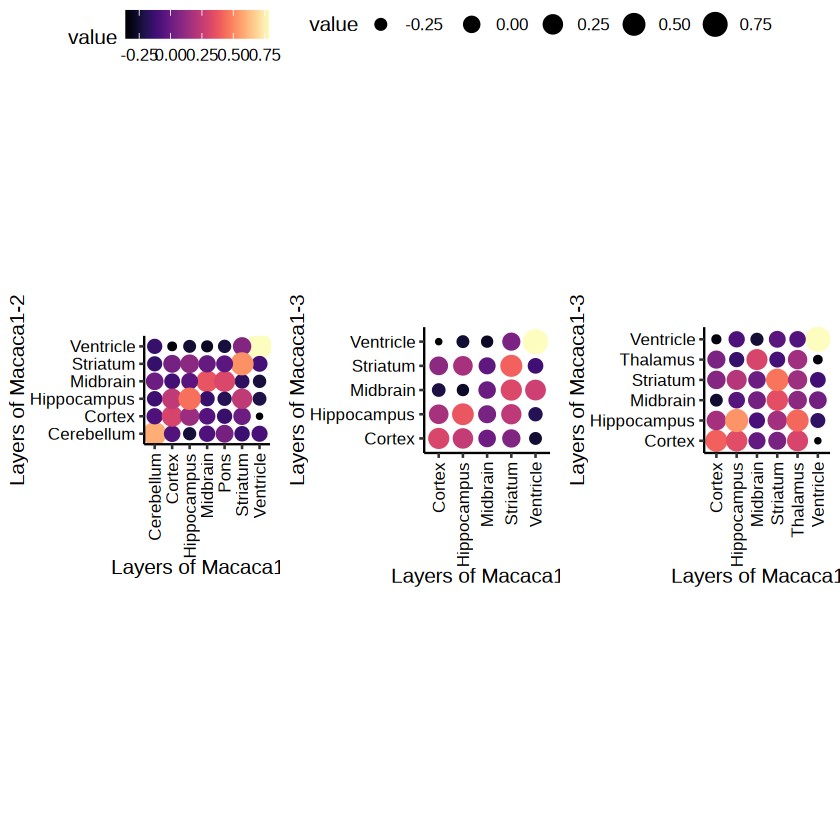

In [218]:
isosigi1 = isosigls.t44$subcortical
isosigi2 = isosigls.t42$subcortical
jcdf1 = DTUCormx(isosigi1,isosigi2,50)

p1.1 = ggplot(jcdf1,aes(x = Var1,y = Var2, color = value,size = value)) + geom_point() + 
    scale_color_viridis(option = "A") + theme_pubr() + coord_fixed(ratio = 1) +
    theme(
    axis.text.x = element_text(
      size = 10,
      angle = 90,vjust = 0.5,
      hjust = 1
    ),
    axis.text.y = element_text(
      size = 10
    ),
    legend.position = "right", 
    panel.grid.minor = element_blank(),
    panel.background = element_blank(),
    plot.background = element_rect(fill = "white", color = NA)
  ) + xlab("Layers of Macaca1-1")  + ylab("Layers of Macaca1-2")

isosigi1 = isosigls.t44$subcortical
isosigi2 = isosigls.t47$subcortical
jcdf2 = DTUCormx(isosigi1,isosigi2,50)
p1.2 = ggplot(jcdf2,aes(x = Var1,y = Var2, color = value,size = value)) + geom_point() + 
    scale_color_viridis(option = "A") + theme_pubr() + coord_fixed(ratio = 1) +
    theme(
    axis.text.x = element_text(
      size = 10,
      angle = 90,vjust = 0.5,
      hjust = 1
    ),
    axis.text.y = element_text(
      size = 10
    ),
    legend.position = "right", 
    panel.grid.minor = element_blank(),
    panel.background = element_blank(),
    plot.background = element_rect(fill = "white", color = NA)
  ) + xlab("Layers of Macaca1-1")  + ylab("Layers of Macaca1-3")

isosigi1 = isosigls.t42$subcortical
isosigi2 = isosigls.t47$subcortical
jcdf3 = DTUCormx(isosigi1,isosigi2,50)

p1.3 = ggplot(jcdf3,aes(x = Var1,y = Var2, color = value,size = value)) + geom_point() + 
    scale_color_viridis(option = "A") + theme_pubr() + coord_fixed(ratio = 1) +
    theme(
    axis.text.x = element_text(
      size = 10,
      angle = 90,vjust = 0.5,
      hjust = 1
    ),
    axis.text.y = element_text(
      size = 10
    ),
    legend.position = "right", 
    panel.grid.minor = element_blank(),
    panel.background = element_blank(),
    plot.background = element_rect(fill = "white", color = NA)
  ) + xlab("Layers of Macaca1-2")  + ylab("Layers of Macaca1-3")
p1t = ggarrange(p1.1,p1.2,p1.3,nrow = 1,common.legend = T)
p1t


In [227]:
ggexport(p1t,filename = "result/figure_revision/relicates_DTU_compare_subcortical_25_12_16.pdf",width = 9,height = 3)

file saved to result/figure_revision/relicates_DTU_compare_subcortical_25_12_16.pdf



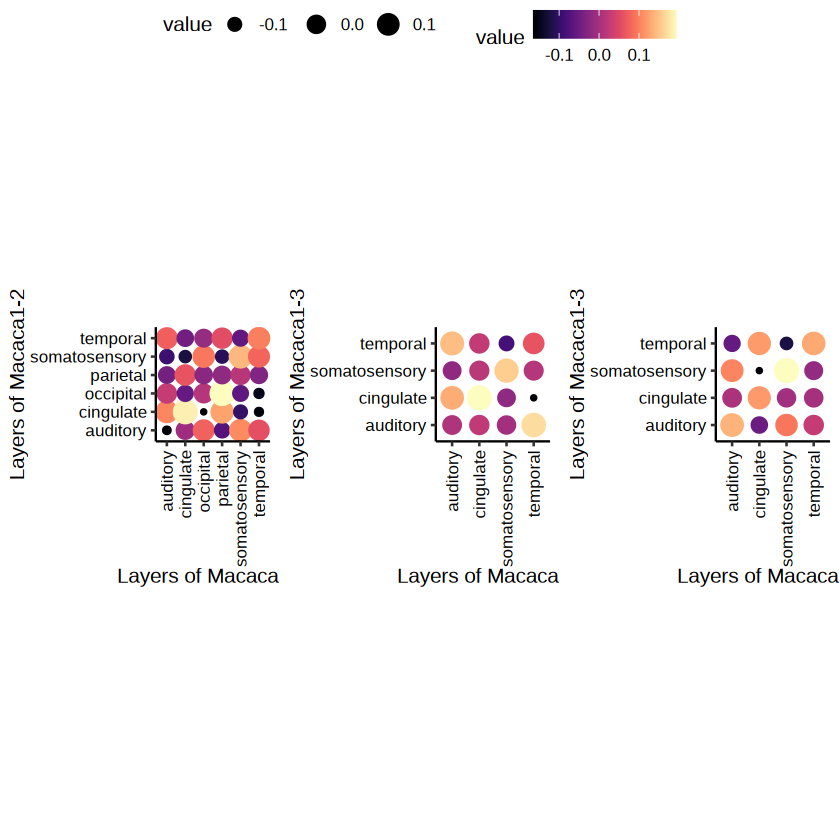

In [19]:
isosigi1 = isosigls.t44$lobe
isosigi2 = isosigls.t42$lobe
jcdf1 = DTUCormx(isosigi1,isosigi2,50)

p1.1 = ggplot(jcdf1,aes(x = Var1,y = Var2, color = value,size = value)) + geom_point() + 
    scale_color_viridis(option = "A") + theme_pubr() + coord_fixed(ratio = 1) +
    theme(
    axis.text.x = element_text(
      size = 10,
      angle = 90,vjust = 0.5,
      hjust = 1
    ),
    axis.text.y = element_text(
      size = 10
    ),
    legend.position = "right", 
    panel.grid.minor = element_blank(),
    panel.background = element_blank(),
    plot.background = element_rect(fill = "white", color = NA)
  ) + xlab("Layers of Macaca1-1")  + ylab("Layers of Macaca1-2")

isosigi1 = isosigls.t44$lobe
isosigi2 = isosigls.t47$lobe
jcdf2 = DTUCormx(isosigi1,isosigi2,50)
p1.2 = ggplot(jcdf2,aes(x = Var1,y = Var2, color = value,size = value)) + geom_point() + 
    scale_color_viridis(option = "A") + theme_pubr() + coord_fixed(ratio = 1) +
    theme(
    axis.text.x = element_text(
      size = 10,
      angle = 90,vjust = 0.5,
      hjust = 1
    ),
    axis.text.y = element_text(
      size = 10
    ),
    legend.position = "right", 
    panel.grid.minor = element_blank(),
    panel.background = element_blank(),
    plot.background = element_rect(fill = "white", color = NA)
  ) + xlab("Layers of Macaca1-1")  + ylab("Layers of Macaca1-3")

isosigi1 = isosigls.t42$lobe
isosigi2 = isosigls.t47$lobe
jcdf3 = DTUCormx(isosigi1,isosigi2,50)

p1.3 = ggplot(jcdf3,aes(x = Var1,y = Var2, color = value,size = value)) + geom_point() + 
    scale_color_viridis(option = "A") + theme_pubr() + coord_fixed(ratio = 1) +
    theme(
    axis.text.x = element_text(
      size = 10,
      angle = 90,vjust = 0.5,
      hjust = 1
    ),
    axis.text.y = element_text(
      size = 10
    ),
    legend.position = "right", 
    panel.grid.minor = element_blank(),
    panel.background = element_blank(),
    plot.background = element_rect(fill = "white", color = NA)
  ) + xlab("Layers of Macaca1-2")  + ylab("Layers of Macaca1-3")
p1t = ggarrange(p1.1,p1.2,p1.3,nrow = 1,common.legend = T)
p1t


In [184]:
mean(jcdf1[jcdf1$Var1 == jcdf1$Var2,]$value)
mean(jcdf2[jcdf2$Var1 == jcdf2$Var2,]$value)
mean(jcdf3[jcdf3$Var1 == jcdf3$Var2,]$value)

[1] 0.3387313

[1] 0.1458115

[1] 0.1549059

file saved to result/figure_revision/relicates_DTU_compare_subclass_25_12_16.pdf



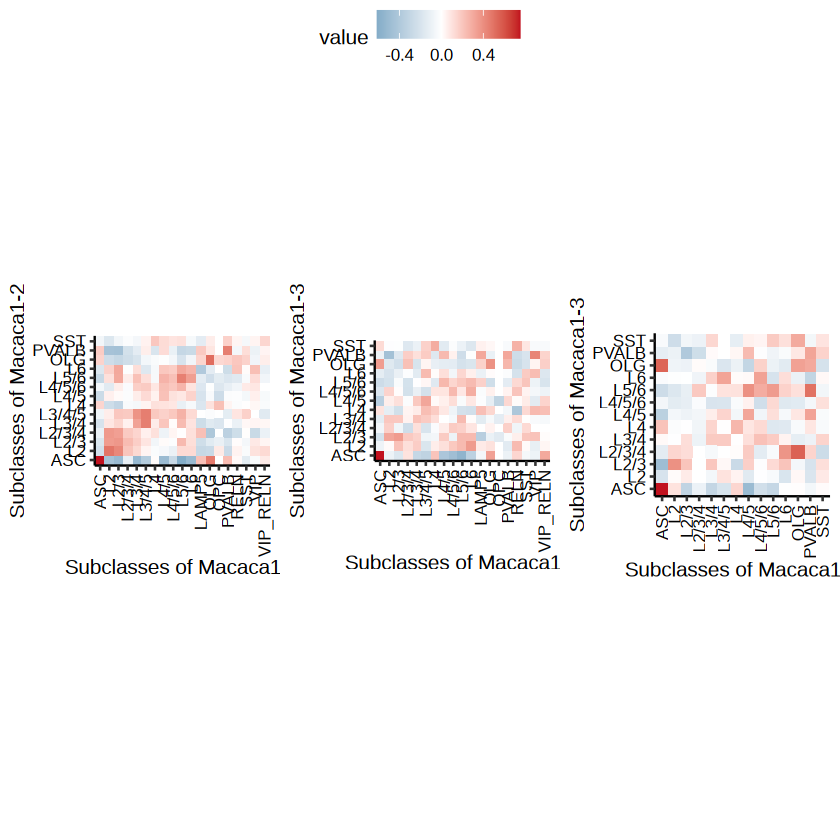

In [183]:
isosigi1 = isosigls.t44$subclass
isosigi2 = isosigls.t42$subclass
jcdf1 = DTUCormx(isosigi1,isosigi2,50)

p1.1 = ggplot(jcdf1,aes(x = Var1,y = Var2, fill = value)) + 
    geom_tile() + 
    scale_fill_gradient2(low = "#669bbc",high = "#c1121f",mid = "white") + theme_pubr() + coord_fixed(ratio = 1) +
    theme(
    axis.text.x = element_text(
      size = 10,
      angle = 90,vjust = 0.5,
      hjust = 1
    ),
    axis.text.y = element_text(
      size = 10
    ),
    legend.position = "right", 
    panel.grid.minor = element_blank(),
    panel.background = element_blank(),
    plot.background = element_rect(fill = "white", color = NA)
  ) + xlab("Subclasses of Macaca1-1")  + ylab("Subclasses of Macaca1-2")

isosigi1 = isosigls.t44$subclass
isosigi2 = isosigls.t47$subclass
jcdf2 = DTUCormx(isosigi1,isosigi2,50)
p1.2 = ggplot(jcdf2,aes(x = Var1,y = Var2, fill = value)) + 
    geom_tile() + 
    scale_fill_gradient2(low = "#669bbc",high = "#c1121f",mid = "white") + theme_pubr() + coord_fixed(ratio = 1) +
    theme(
    axis.text.x = element_text(
      size = 10,
      angle = 90,vjust = 0.5,
      hjust = 1
    ),
    axis.text.y = element_text(
      size = 10
    ),
    legend.position = "right", 
    panel.grid.minor = element_blank(),
    panel.background = element_blank(),
    plot.background = element_rect(fill = "white", color = NA)
  ) + xlab("Subclasses of Macaca1-1")  + ylab("Subclasses of Macaca1-3")

isosigi1 = isosigls.t42$subclass
isosigi2 = isosigls.t47$subclass
jcdf3 = DTUCormx(isosigi1,isosigi2,50)

p1.3 = ggplot(jcdf3,aes(x = Var1,y = Var2, fill = value)) + 
    geom_tile() + 
    scale_fill_gradient2(low = "#669bbc",high = "#c1121f",mid = "white") + theme_pubr() + coord_fixed(ratio = 1) +
    theme(
    axis.text.x = element_text(
      size = 10,
      angle = 90,vjust = 0.5,
      hjust = 1
    ),
    axis.text.y = element_text(
      size = 10
    ),
    legend.position = "right", 
    panel.grid.minor = element_blank(),
    panel.background = element_blank(),
    plot.background = element_rect(fill = "white", color = NA)
  ) + xlab("Subclasses of Macaca1-2")  + ylab("Subclasses of Macaca1-3")
p1t = ggarrange(p1.1,p1.2,p1.3,nrow = 1,common.legend = T)
p1t
ggexport(p1t,filename = "result/figure_revision/relicates_DTU_compare_subclass_25_12_16.pdf",width = 9,height = 3)

file saved to result/figure_revision/relicates_DTU_compare_class_25_12_16.pdf



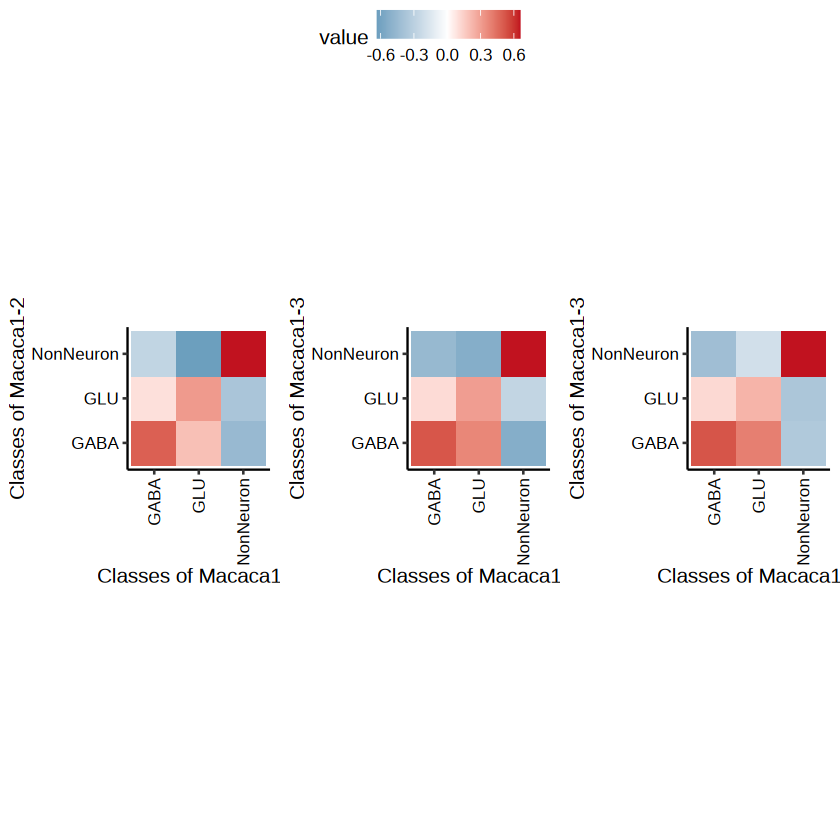

In [185]:
isosigi1 = isosigls.t44$class
isosigi2 = isosigls.t42$class
jcdf1 = DTUCormx(isosigi1,isosigi2,100)

p1.1 = ggplot(jcdf1,aes(x = Var1,y = Var2, fill = value)) + 
    geom_tile() + 
    scale_fill_gradient2(low = "#669bbc",high = "#c1121f",mid = "white") + theme_pubr() + coord_fixed(ratio = 1) +
    theme(
    axis.text.x = element_text(
      size = 10,
      angle = 90,vjust = 0.5,
      hjust = 1
    ),
    axis.text.y = element_text(
      size = 10
    ),
    legend.position = "right", 
    panel.grid.minor = element_blank(),
    panel.background = element_blank(),
    plot.background = element_rect(fill = "white", color = NA)
  ) + xlab("Classes of Macaca1-1")  + ylab("Classes of Macaca1-2")

isosigi1 = isosigls.t44$class
isosigi2 = isosigls.t47$class
jcdf2 = DTUCormx(isosigi1,isosigi2,100)
p1.2 = ggplot(jcdf2,aes(x = Var1,y = Var2, fill = value)) + 
    geom_tile() + 
    scale_fill_gradient2(low = "#669bbc",high = "#c1121f",mid = "white") + theme_pubr() + coord_fixed(ratio = 1) +
    theme(
    axis.text.x = element_text(
      size = 10,
      angle = 90,vjust = 0.5,
      hjust = 1
    ),
    axis.text.y = element_text(
      size = 10
    ),
    legend.position = "right", 
    panel.grid.minor = element_blank(),
    panel.background = element_blank(),
    plot.background = element_rect(fill = "white", color = NA)
  ) + xlab("Classes of Macaca1-1")  + ylab("Classes of Macaca1-3")

isosigi1 = isosigls.t42$class
isosigi2 = isosigls.t47$class
jcdf3 = DTUCormx(isosigi1,isosigi2,100)

p1.3 = ggplot(jcdf3,aes(x = Var1,y = Var2, fill = value)) + 
    geom_tile() + 
    scale_fill_gradient2(low = "#669bbc",high = "#c1121f",mid = "white") + theme_pubr() + coord_fixed(ratio = 1) +
    theme(
    axis.text.x = element_text(
      size = 10,
      angle = 90,vjust = 0.5,
      hjust = 1
    ),
    axis.text.y = element_text(
      size = 10
    ),
    legend.position = "right", 
    panel.grid.minor = element_blank(),
    panel.background = element_blank(),
    plot.background = element_rect(fill = "white", color = NA)
  ) + xlab("Classes of Macaca1-2")  + ylab("Classes of Macaca1-3")
p1t = ggarrange(p1.1,p1.2,p1.3,nrow = 1,common.legend = T)
p1t
ggexport(p1t,filename = "result/figure_revision/relicates_DTU_compare_class_25_12_16.pdf",width = 9,height = 3)

file saved to result/figure_revision/T44_DTU_compare_across_region_25_12_16.pdf



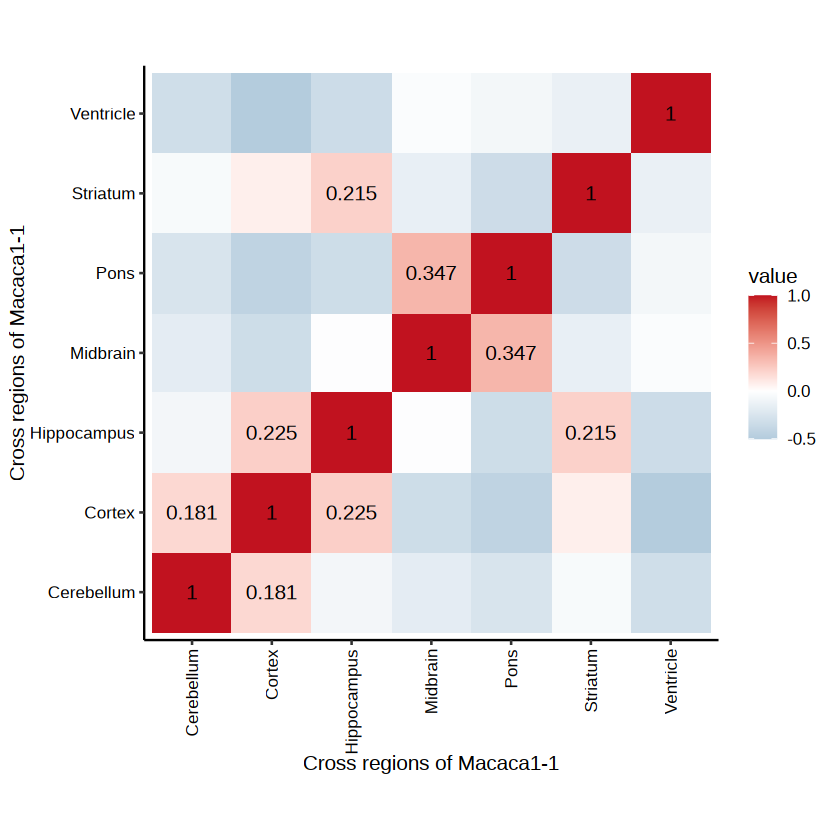

In [266]:
isosigi1 = isosigls.t44$subcortical
isosigi2 = isosigls.t44$subcortical
jcdf1 = DTUCormx(isosigi1,isosigi2,100)

p1.1 = ggplot(jcdf1,aes(x = Var1,y = Var2, fill = value)) + 
    geom_tile() + 
    geom_text(data = jcdf1[jcdf1$value > 0.1,],aes(label = round(value,3))) + 
    scale_fill_gradient2(low = "#669bbc",high = "#c1121f",mid = "white") + theme_pubr() + coord_fixed(ratio = 1) +
    theme(
    axis.text.x = element_text(
      size = 10,
      angle = 90,vjust = 0.5,
      hjust = 1
    ),
    axis.text.y = element_text(
      size = 10
    ),
    legend.position = "right", 
    panel.grid.minor = element_blank(),
    panel.background = element_blank(),
    plot.background = element_rect(fill = "white", color = NA)
  ) + xlab("Cross regions of Macaca1-1")  + ylab("Cross regions of Macaca1-1")
p1.1
ggexport(p1.1,filename = "result/figure_revision/T44_DTU_compare_across_region_25_12_16.pdf",width = 5,height = 4)

In [186]:
mean(jcdf1[jcdf1$Var1 == jcdf1$Var2,]$value)
mean(jcdf2[jcdf2$Var1 == jcdf2$Var2,]$value)
mean(jcdf3[jcdf3$Var1 == jcdf3$Var2,]$value)

[1] 0.4880041

[1] 0.4195075

[1] 0.3699771

In [396]:
setwd("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/")
isosig.vm =  qread("data/dtu_analysis/VM_ME_dtu_isoform_ls_fsraw_cor_25_12_26.qs")
isosig.vm

gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
AACS,NM_001284010.1,Cerebellum,71,71,1.000000000,0.960317460,0.920634921,0.079365079,N,4.967492e-02,6.235863e-02
AACS,NM_001284010.1,Cortex,58,63,0.920634921,0.960317460,1.000000000,-0.079365079,N,4.967492e-02,6.235863e-02
AACS,XM_015430724.1,Cortex,5,63,0.079365079,0.079365079,NaN,NaN,N,4.967492e-02,6.235863e-02
AADAT,AADAT-FS-1,Cortex,4,63,0.063492063,0.063492063,NaN,NaN,N,4.227826e-12,1.152450e-11
AADAT,XM_005556303.2,Cortex,59,63,0.936507937,0.936507937,NaN,NaN,N,4.227826e-12,1.152450e-11
AAMDC,AAMDC-FS-1,Cortex,18,187,0.096256684,0.096256684,NaN,NaN,N,2.825807e-57,2.631953e-56
AAMDC,NM_001283690.1,Cortex,3,187,0.016042781,0.016042781,NaN,NaN,N,2.825807e-57,2.631953e-56
AAMDC,XM_005579175.2,Cortex,166,187,0.887700535,0.887700535,NaN,NaN,N,2.825807e-57,2.631953e-56
AAMP,XM_005574266.2,Cerebellum,15,236,0.063559322,0.088922518,0.114285714,-0.050726392,N,4.580183e-01,5.050936e-01


In [421]:
# fsraw.t44$areatr = fsraw.t44$subcortical
# transti = FullLengthTranSt(fsraw.t44[fsraw.t44$subcortical %in% c("Cortex","Cerebellum"),],20)
# isosig.t44.cc = CalSigIsoform(transti)
fsraw.t42$areatr = fsraw.t42$subcortical
transti = FullLengthTranSt(fsraw.t42[fsraw.t42$subcortical %in% c("Cortex","Cerebellum"),],20)
isosig.t42.cc = CalSigIsoform(transti)

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
Warning message:
"There were 324 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 2: `gene_id = "ABCC5"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 323 remaining warnings."


[1] 773

[1] 112

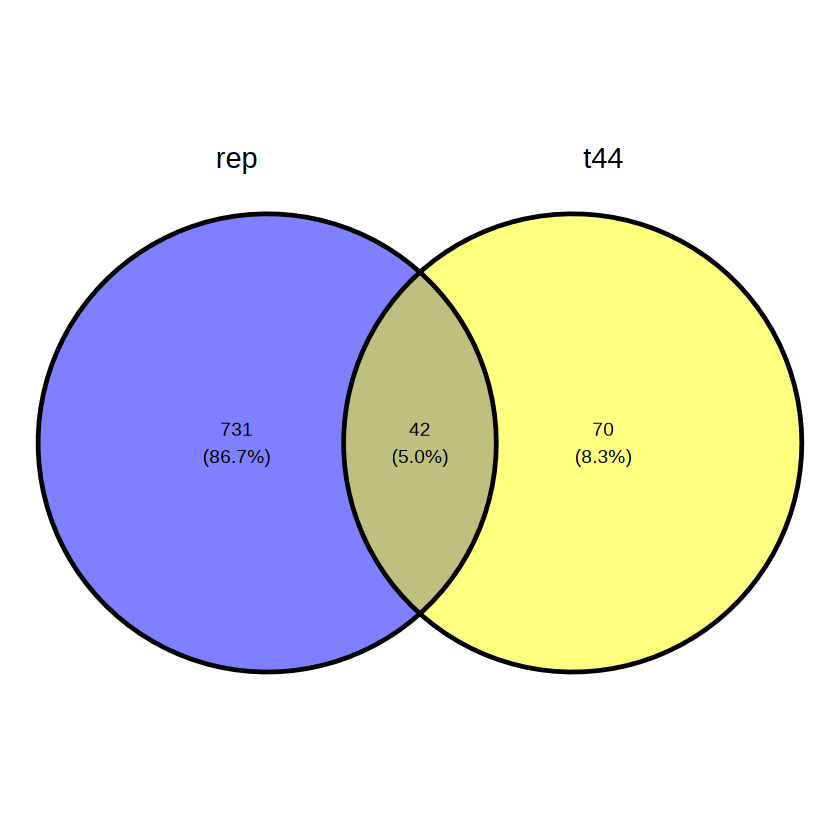

In [422]:
length(unique(isosig.vm[isosig.vm$sig != "N",]$gene_id))
length(unique(isosig.t42.cc[isosig.t42.cc$sig != "N",]$gene_id))
ggvenn::ggvenn(list("rep" = unique(isosig.vm[isosig.vm$sig != "N",]$gene_id),
              "t44" = unique(isosig.t42.cc[isosig.t42.cc$sig != "N",]$gene_id)))

In [436]:
isosig.vmf = isosig.vm %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
isosig.t44.ccf = isosig.t42.cc %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))
isosig.vml = dcast(isosig.vmf,gene_id+transcript_id~areatr,value.var = "relative",fill = 0)
isosig.vml$dr = isosig.vml$Cortex - isosig.vml$Cerebellum
isosig.t44.ccl = dcast(isosig.t44.ccf,gene_id+transcript_id~areatr,value.var = "relative",fill = 0)
isosig.t44.ccl$dr = isosig.t44.ccl$Cortex - isosig.t44.ccl$Cerebellum
isosig.cmp = merge(isosig.t44.ccl[,c("gene_id","transcript_id","dr")],
                   isosig.vml[,c("gene_id","transcript_id","dr")],by = c("gene_id","transcript_id"))
isosig.cmp = isosig.cmp[isosig.cmp$transcript_id %in% isosig.t44.cc[isosig.t44.cc$sig != "N",]$transcript_id,]
head(isosig.cmp)
cor(isosig.cmp$dr.x,isosig.cmp$dr.y)

,gene_id,transcript_id,dr.x,dr.y
,<chr>,<chr>,<dbl>,<dbl>
23,APOO,XM_005593179.2,0.10563354,0.78070175
45,BID,XM_005568046.2,-0.01298701,0.80645161
54,C19H19orf24,XM_005587384.2,-0.18743824,0.70256410
78,CCDC107,XM_005581373.2,0.05523275,0.63414634
80,CCDC136,XM_015448015.1,0.04573935,-0.08928571
86,CCNH,XM_015451359.1,0.18788981,-0.32622913


[1] 0.1800302

[1] 0.4152525

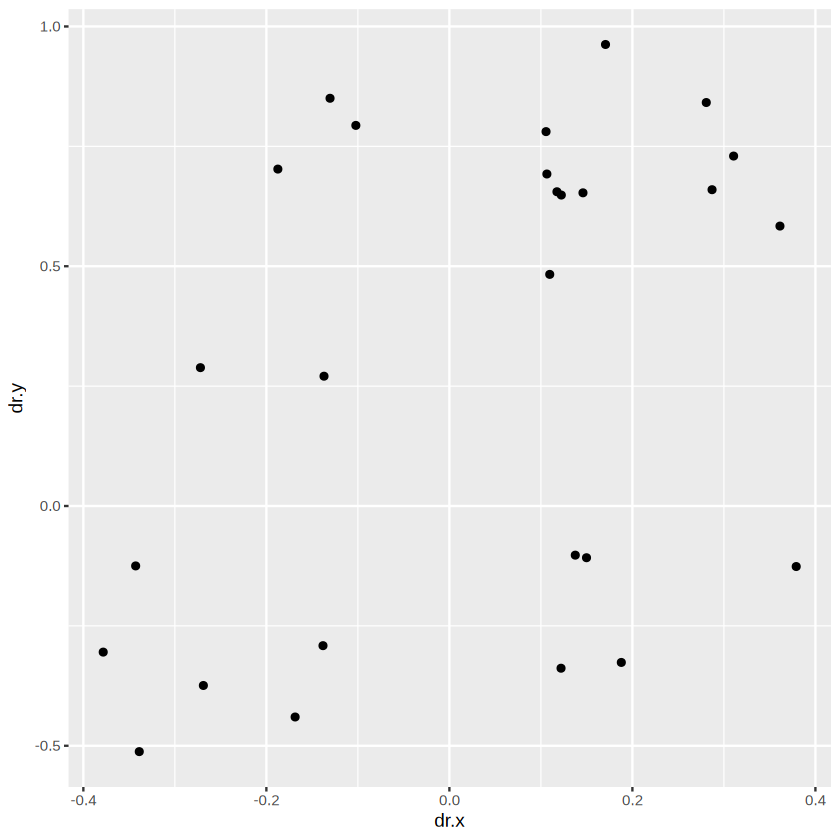

In [437]:
isosig.cmp.hub = isosig.cmp[abs(isosig.cmp$dr.x) > 0.1 & abs(isosig.cmp$dr.y) > 0.1,]
cor(isosig.cmp.hub$dr.x,isosig.cmp.hub$dr.y)
ggplot(isosig.cmp.hub,aes(x = dr.x,y = dr.y)) + geom_point()

,gene_id,cluster
,<chr>,<chr>
1,ABCE1,c7
2,ACLY,c4
3,ACSF2,c1
4,AK1,c1
5,ALG13,c8
6,ALKBH6,c1


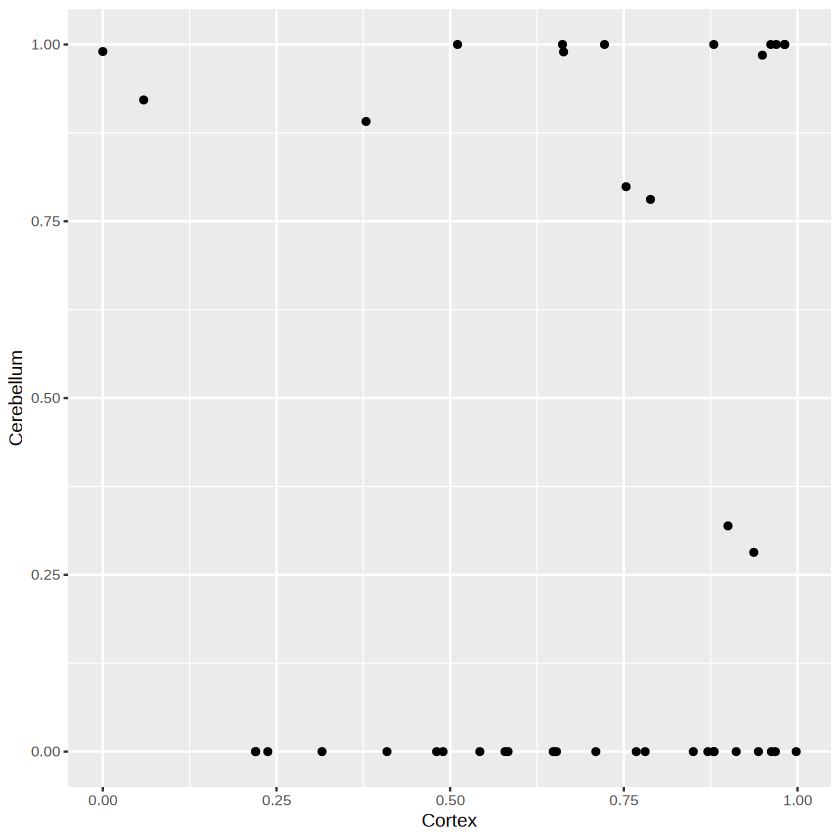

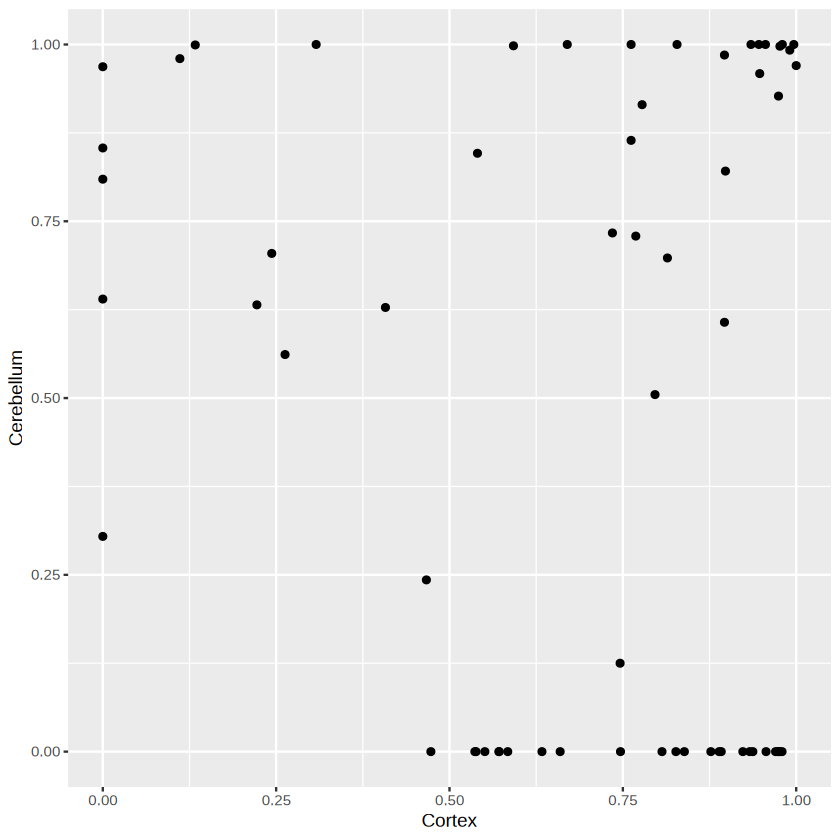

In [415]:
#shiftgcl
shiftgcl = read.csv(file = "result/figure6_other_cmp/sigiso_subcortical_isoform_shift_cluster_heatmap_clone_25_11_04.csv")
head(shiftgcl)
isosig.vml = dcast(isosig.vmf,gene_id+transcript_id~areatr,value.var = "relative",fill = 0)
isosig.vml.hub = isosig.vml[isosig.vml$gene_id %in% shiftgcl[shiftgcl$cluster == "c3",]$gene_id,]
ggplot(isosig.vml.hub,
       aes(x = Cortex,y = Cerebellum)) + geom_point()
isosig.vml.hub = isosig.vml[isosig.vml$gene_id %in% shiftgcl[shiftgcl$cluster == "c1",]$gene_id,]
ggplot(isosig.vml.hub,
       aes(x = Cortex,y = Cerebellum)) + geom_point()

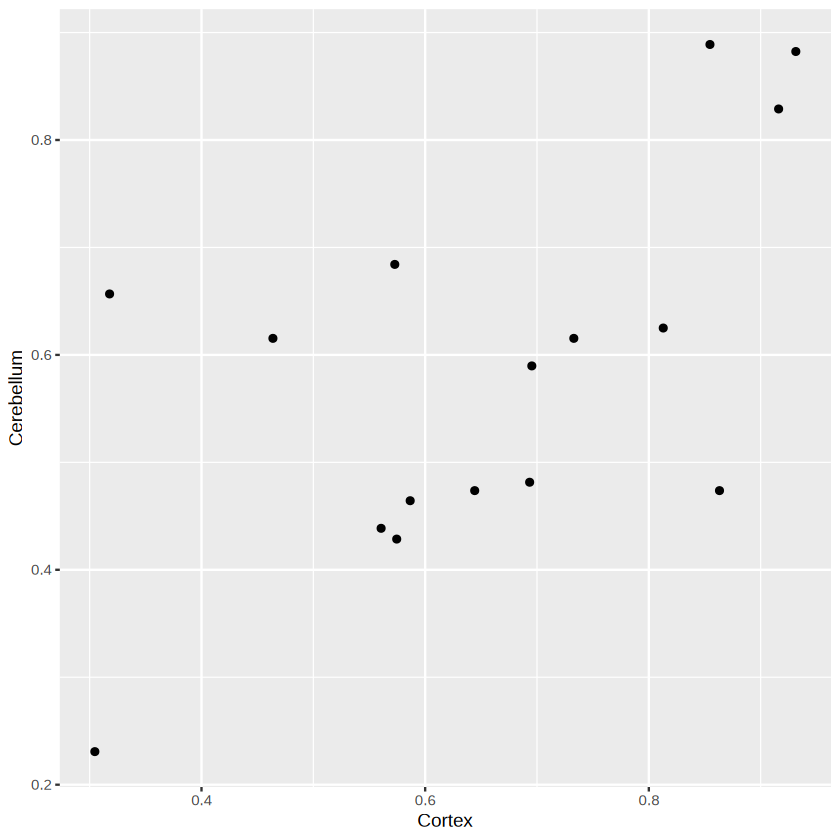

In [425]:
isosig.t44.ccl.hub = isosig.t44.ccl[isosig.t44.ccl$gene_id %in% shiftgcl[shiftgcl$cluster == "c3",]$gene_id,]
ggplot(isosig.t44.ccl.hub[isosig.t44.ccl.hub$Cortex > 0 & isosig.t44.ccl.hub$Cerebellum > 0 ,],
       aes(x = Cortex,y = Cerebellum)) + geom_point()

In [377]:
isosig.cmp.hub = isosig.cmp[abs(isosig.cmp$dr.x) > 0.2 & abs(isosig.cmp$dr.y) > 0.2,]
cor(isosig.cmp.hub$dr.x,isosig.cmp.hub$dr.y)

[1] 0.1850144

In [370]:
# isosig.vm
isosig.vm[isosig.vm$gene_id == "DDRGK1",]

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
1425,DDRGK1,DDRGK1-FS-1,Cortex,36,669,0.05381166,0.05381166,NaN,NaN,N,2.483291e-09,6.591657e-09
1426,DDRGK1,XM_005568473.2,Cerebellum,680,680,1.00000000,0.97309417,0.9461883,0.05381166,N,2.483291e-09,6.591657e-09
1427,DDRGK1,XM_005568473.2,Cortex,633,669,0.94618834,0.97309417,1.0000000,-0.05381166,N,2.483291e-09,6.591657e-09


In [369]:
isosig.cmp[isosig.cmp$gene_id == "DDRGK1",]
# isosig.t44.cc[isosig.t44.cc$gene_id == "IDH3B",]
isosig.vm[isosig.cmp$gene_id == "DDRGK1",]

,gene_id,transcript_id,areatr,relative.x,dr.x,relative.y,dr.y
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
83,DDRGK1,DDRGK1-FS-1,Cortex,0.05381166,NaN,0.5653172,0.2574638
84,DDRGK1,XM_005568473.2,Cerebellum,1.00000000,0.05381166,0.6921466,0.2574638
85,DDRGK1,XM_005568473.2,Cortex,0.94618834,-0.05381166,0.4346828,-0.2574638


,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
83,ADAM11,XM_005584444.2,Cortex,30,46,0.65217391,0.64878199,0.64539007,0.006783842,N,1.000000e+00,1.000000e+00
84,ADAM15,XM_005541615.2,Cerebellum,162,174,0.93103448,0.62405383,0.31707317,0.613961312,Up,4.812227e-22,2.646169e-21
85,ADAM15,XM_005541615.2,Cortex,13,41,0.31707317,0.62405383,0.93103448,-0.613961312,Down,4.812227e-22,2.646169e-21
582,C11H12orf57,XM_005569990.2,Cortex,1600,2169,0.73766713,0.86883356,1.00000000,-0.262332872,Down,1.835810e-194,1.410020e-192
583,C11H12orf57,XM_015430313.1,Cortex,569,2169,0.26233287,0.26233287,NaN,NaN,N,1.835810e-194,1.410020e-192
584,C11H12orf73,C11H12orf73-FS-1,Cortex,5,85,0.05882353,0.05882353,NaN,NaN,N,2.759197e-19,1.383084e-18
1081,CLDND1,XM_005548338.2,Cerebellum,6,58,0.10344828,0.12931034,0.15517241,-0.051724138,N,7.018623e-03,9.351618e-03
1082,CLDND1,XM_005548338.2,Cortex,9,58,0.15517241,0.12931034,0.10344828,0.051724138,N,7.018623e-03,9.351618e-03
1083,CLDND1,XM_005548339.2,Cerebellum,25,58,0.43103448,0.54310345,0.65517241,-0.224137931,Down,7.018623e-03,9.351618e-03


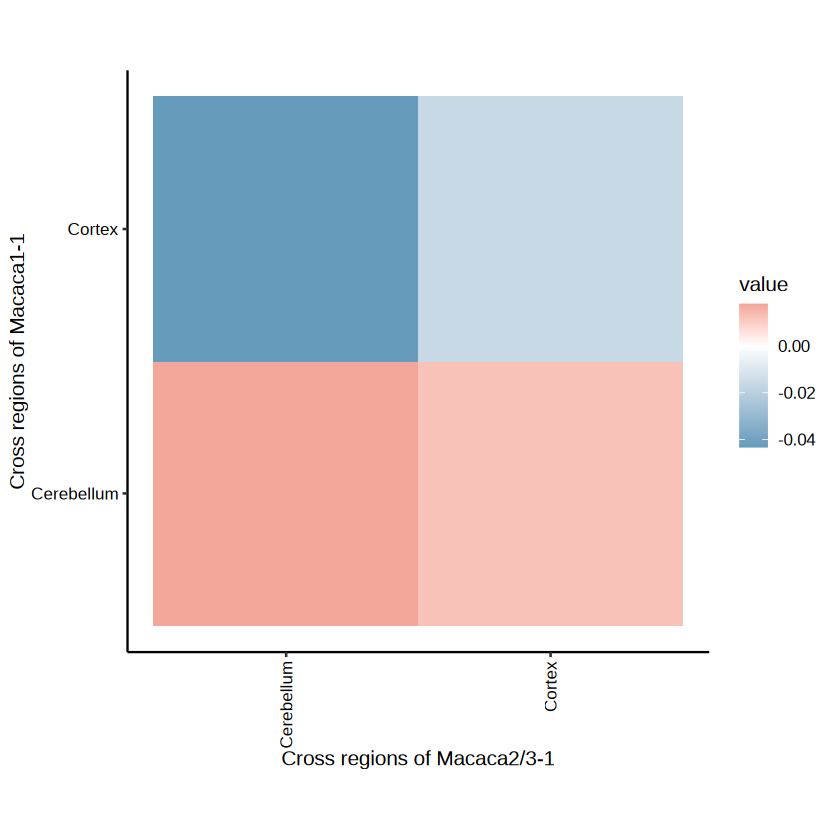

In [332]:
isosigi1 = isosig.vm
isosigi2 = isosig.t44.cc
jcdf1 = DTUCormx(isosigi1,isosigi2,100)

p1.1 = ggplot(jcdf1,aes(x = Var1,y = Var2, fill = value)) + 
    geom_tile() + 
    geom_text(data = jcdf1[jcdf1$value > 0.1,],aes(label = round(value,3))) + 
    scale_fill_gradient2(low = "#669bbc",high = "#c1121f",mid = "white") + theme_pubr() + coord_fixed(ratio = 1) +
    theme(
    axis.text.x = element_text(
      size = 10,
      angle = 90,vjust = 0.5,
      hjust = 1
    ),
    axis.text.y = element_text(
      size = 10
    ),
    legend.position = "right", 
    panel.grid.minor = element_blank(),
    panel.background = element_blank(),
    plot.background = element_rect(fill = "white", color = NA)
  ) + xlab("Cross regions of Macaca2/3-1")  + ylab("Cross regions of Macaca1-1")
p1.1

In [193]:
l1cv.t44 = read.table("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/ref/curve_coordinates_T44.txt",header = TRUE)
l1cv.t47 = read.table("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/ref/curve_coordinates_T47.txt",header = TRUE)
l1cv.t42 = read.table("/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/ref/curve_coordinates_T42.txt",header = TRUE)
l1cv.vm = read.table("/cluster/home/liuhengxin/P1_brain_nanopore/processed_data/VM_analysis/Revo/ref/curve_coordinates_vm1106.txt",header = TRUE)

In [244]:
rt_vm116 = qread("/cluster/home/liuhengxin/P1_brain_nanopore/processed_data/VM_analysis/Revo/VM11LPT6_Y00983LA_trans_total_anno_withcid_filter_25_12_02.qs")
# fsraw.case = rt_vm116[rt_vm116$gene_id == genehub & rt_vm116$transcript_id %in% transhub,]
rt_vm116 = rt_vm116 %>% group_by(readid) %>% mutate(transn = length(unique(transcript_id)))
rt_vm116[rt_vm116$transn >1, ]$transcript_id = "ambi"
rt_vm116 = rt_vm116[rt_vm116$transn == 1,]

rt_me01 = qread("/cluster/home/liuhengxin/P1_brain_nanopore/processed_data/VM_analysis/Revo/ME012_Y00986G1_trans_total_anno_withcid_filter_25_12_02.qs")
# fsraw.case = rt_vm116[rt_vm116$gene_id == genehub & rt_vm116$transcript_id %in% transhub,]
rt_me01 = rt_me01 %>% group_by(readid) %>% mutate(transn = length(unique(transcript_id)))
rt_me01[rt_me01$transn >1, ]$transcript_id = "ambi"
rt_me01 = rt_me01[rt_me01$transn == 1,]

In [182]:
#load layer deep curve
library(sf)
Plotlayerdist = function(fsraw.cor,l1cv,genehub,transhub,disbin=500){
    fsraw.case = fsraw.cor[fsraw.cor$gene_id == genehub & fsraw.cor$transcript_id %in% transhub & 
                           fsraw.cor$subcortical %in% c("Cortex"),]
    fsraw.case = fsraw.case %>% group_by(readid) %>% mutate(transn = length(unique(transcript_id)))
    fsraw.case[fsraw.case$transn >1, ]$transcript_id = "ambi"
    fsraw.case = fsraw.case[fsraw.case$transn == 1,]
    fsraw.case$transcript_id = factor(fsraw.case$transcript_id,levels = transhub)
    library(sf)
    calculate_point_to_line_distance <- function(points_df, line_df) {
      points_sf <- st_as_sf(points_df, coords = c("x", "y"))
      line_sf <- st_as_sf(line_df, coords = c("x", "y"))
      line_sf <- st_cast(st_combine(line_sf), "LINESTRING")
      distances <- st_distance(points_sf, line_sf)
      points_df$distance_to_line <- as.numeric(distances)
      
      return(points_df)
    }
    casedis <- calculate_point_to_line_distance(fsraw.case[,c("x","y")], l1cv)
    # head(casedis)
    fsraw.case = merge(fsraw.case,casedis,by = c("x","y"))
    #adjust
    fsraw.case = fsraw.case %>% group_by(region) %>% 
                mutate(distance_to_line = distance_to_line - min(distance_to_line))
    fsraw.case$distance_bin = as.integer(fsraw.case$distance_to_line/disbin)

    disst = fsraw.case %>% group_by(distance_bin,gene_id,transcript_id) %>% 
                summarise(count = n()) %>% group_by(distance_bin) %>% mutate(ratio = count/sum(count))
    pi = ggplot(disst,aes(x = distance_bin,y = ratio,color = transcript_id)) +
          geom_point() + 
          geom_line() + 
          theme_pubr() + 
          scale_color_discreterainbow() +
          theme(legend.position = "top",legend.title = element_blank(),
                legend.text = element_text(size = 10)) +
          guides(color = guide_legend(override.aes = list(size=8),
                                      nrow = 2),
                size = "none") + xlab(paste0("Distance to layer1 (windows = ",disbin," bin)")) + ylab("Isoform ratio")
    pi2 = ggplot(fsraw.case,aes(x = region,y = distance_to_line,color = transcript_id)) +
          geom_jitter(size = 0.1,stroke.size = NA) + 
          theme_pubr() + 
          scale_color_discreterainbow() +
          theme_presentation() +
          theme(legend.position = "top",legend.title = element_blank(),
                legend.text = element_text(size = 10)) +
          guides(color = guide_legend(override.aes = list(size=8),
                                      nrow = 2),
                size = "none") + xlab(paste0("region")) + ylab("Distance to layer1")
    return(list("disst" = disst,"pstat" = pi,"player" = pi2))
}


In [191]:
genehub = "DDRGK1"
transhub = c("DDRGK1-FS-1","XM_005568473.2")
pdt = Plotlayerdist(fsraw.t44,l1cv.t44,genehub,transhub,200)
disst.t44 = pdt$disst
disst.t44$disgroup = "Macaca1-1"
pdt = Plotlayerdist(fsraw.t42,l1cv.t42,genehub,transhub,200)
disst.t42 = pdt$disst
disst.t42$disgroup = "Macaca1-2"
pdt = Plotlayerdist(fsraw.t47,l1cv.t47,genehub,transhub,200)
disst.t47 = pdt$disst
disst.t47$disgroup = "Macaca1-3"
disst = rbind(disst.t47,disst.t44,disst.t42)

`summarise()` has grouped output by 'distance_bin', 'gene_id'. You can override
using the `.groups` argument.
Warning message in geom_jitter(size = 0.1, stroke.size = NA):
"Ignoring unknown parameters: `stroke.size`"
`summarise()` has grouped output by 'distance_bin', 'gene_id'. You can override
using the `.groups` argument.
Warning message in geom_jitter(size = 0.1, stroke.size = NA):
"Ignoring unknown parameters: `stroke.size`"
`summarise()` has grouped output by 'distance_bin', 'gene_id'. You can override
using the `.groups` argument.
Warning message in geom_jitter(size = 0.1, stroke.size = NA):
"Ignoring unknown parameters: `stroke.size`"


In [201]:
rt_vm116$subcortical = "Cortex"
rt_vm116$region = "Cortex"
pdt = Plotlayerdist(rt_vm116,l1cv.vm,genehub,transhub,500)
disst.vm = pdt$disst
disst.vm$disgroup = "Macaca2-1"
disst = rbind(disst.t47,disst.t44,disst.t42,disst.vm)

`summarise()` has grouped output by 'distance_bin', 'gene_id'. You can override
using the `.groups` argument.
Warning message in geom_jitter(size = 0.1, stroke.size = NA):
"Ignoring unknown parameters: `stroke.size`"


file saved to result/figure_revision/Distance_to_layer1_DDRGK1_12_17.pdf



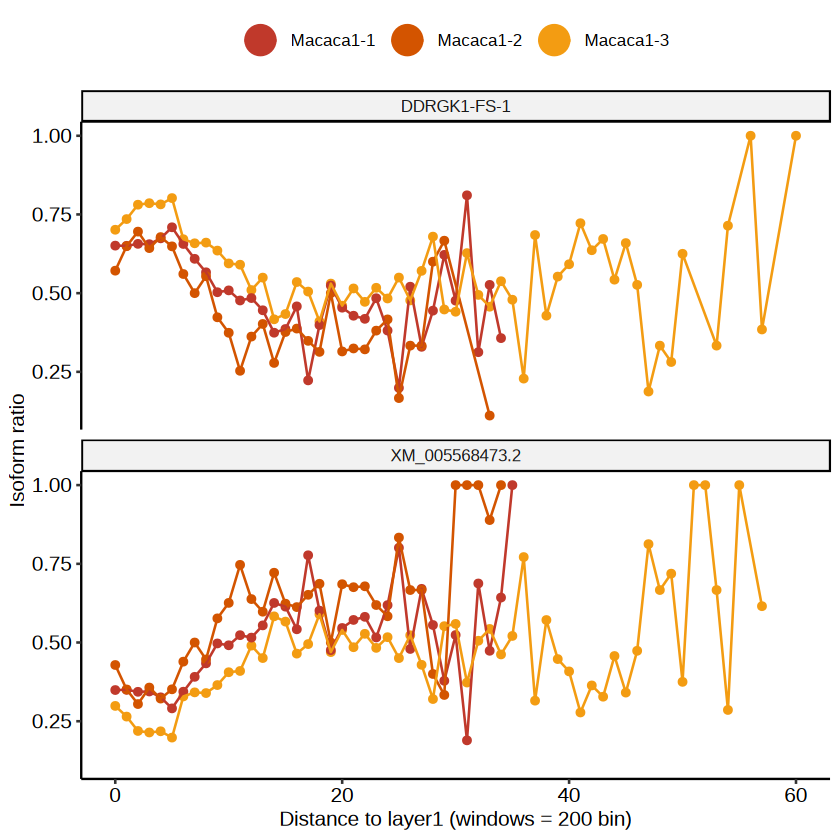

In [205]:
disst = rbind(disst.t47,disst.t44,disst.t42)
pi = ggplot(disst,aes(x = distance_bin,y = ratio,color = disgroup)) +
          geom_point() + 
          geom_line() + 
          facet_wrap(transcript_id~.,ncol = 1) +
          theme_pubr() + 
          scale_color_flatui() +
          theme(legend.position = "top",legend.title = element_blank(),
                legend.text = element_text(size = 10)) +
          guides(color = guide_legend(override.aes = list(size=8),
                                      nrow = 1),
                size = "none") + xlab(paste0("Distance to layer1 (windows = ",200," bin)")) + ylab("Isoform ratio")
pi
ggexport(pi,filename = "result/figure_revision/Distance_to_layer1_DDRGK1_12_17.pdf",width = 5,height = 4)

In [207]:
fsraw.case = fsraw.t47[fsraw.t47$gene_id == genehub & fsraw.t47$transcript_id %in% transhub & 
                           fsraw.t47$subcortical %in% c("Cortex"),]
    fsraw.case = fsraw.case %>% group_by(readid) %>% mutate(transn = length(unique(transcript_id)))
    fsraw.case[fsraw.case$transn >1, ]$transcript_id = "ambi"
    fsraw.case = fsraw.case[fsraw.case$transn == 1,]
    fsraw.case$transcript_id = factor(fsraw.case$transcript_id,levels = transhub)
    library(sf)
    calculate_point_to_line_distance <- function(points_df, line_df) {
      points_sf <- st_as_sf(points_df, coords = c("x", "y"))
      line_sf <- st_as_sf(line_df, coords = c("x", "y"))
      line_sf <- st_cast(st_combine(line_sf), "LINESTRING")
      distances <- st_distance(points_sf, line_sf)
      points_df$distance_to_line <- as.numeric(distances)
      
      return(points_df)
    }
    casedis <- calculate_point_to_line_distance(fsraw.case[,c("x","y")], l1cv.t47)
    # head(casedis)
    fsraw.case = merge(fsraw.case,casedis,by = c("x","y"))
    #adjust
    fsraw.case = fsraw.case %>% group_by(region) %>% 
                mutate(distance_to_line = distance_to_line - min(distance_to_line))
    fsraw.case$distance_bin = as.integer(fsraw.case$distance_to_line/disbin)

Warning message in min(cc[[1]], na.rm = TRUE):
"no non-missing arguments to min; returning Inf"
Warning message in min(cc[[2]], na.rm = TRUE):
"no non-missing arguments to min; returning Inf"
Warning message in max(cc[[1]], na.rm = TRUE):
"no non-missing arguments to max; returning -Inf"
Warning message in max(cc[[2]], na.rm = TRUE):
"no non-missing arguments to max; returning -Inf"
Warning message:
"There was 1 warning in `mutate()`.
ℹ In argument: `distance_to_line = distance_to_line - min(distance_to_line)`.
Caused by warning in `min()`:
! no non-missing arguments to min; returning Inf"


ERROR: Error: object 'disbin' not found


In [215]:
fsraw.t47[fsraw.t47$layer %in% paste0("l",1:6),]$subcortical = "Cortex"

`summarise()` has grouped output by 'distance_bin', 'gene_id'. You can override
using the `.groups` argument.
Warning message in geom_jitter(size = 0.1, stroke.size = NA):
"Ignoring unknown parameters: `stroke.size`"
`summarise()` has grouped output by 'distance_bin', 'gene_id'. You can override
using the `.groups` argument.
Warning message in geom_jitter(size = 0.1, stroke.size = NA):
"Ignoring unknown parameters: `stroke.size`"
`summarise()` has grouped output by 'distance_bin', 'gene_id'. You can override
using the `.groups` argument.
Warning message in geom_jitter(size = 0.1, stroke.size = NA):
"Ignoring unknown parameters: `stroke.size`"
file saved to result/figure_revision/Distance_to_layer1_ARPP19_12_17.pdf



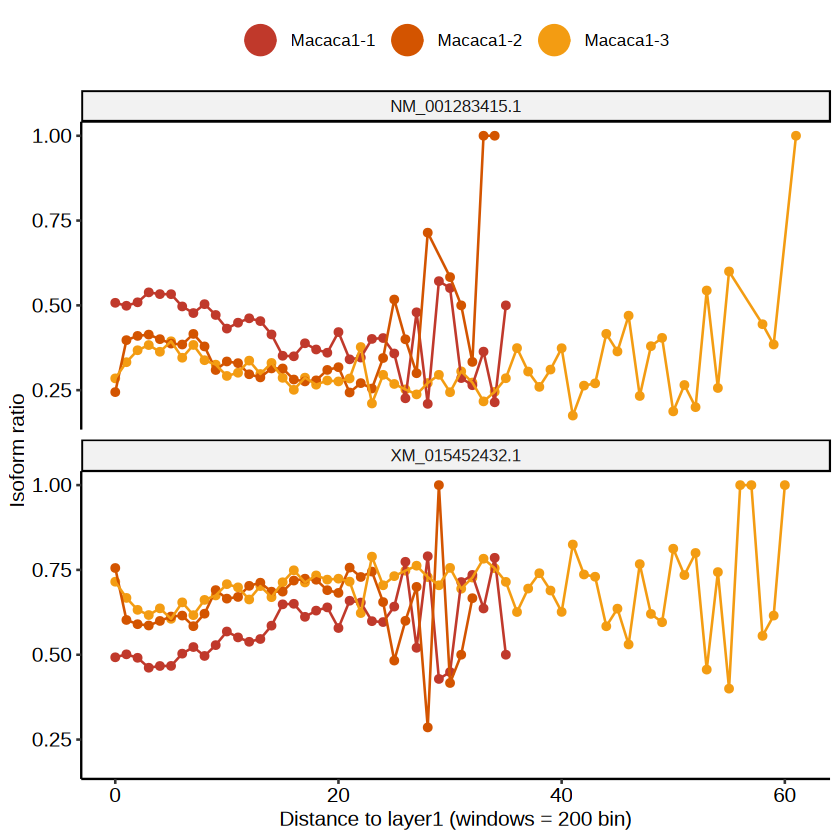

In [216]:
genehub = "ARPP19"
transhub = c("NM_001283415.1","XM_015452432.1")
pdt = Plotlayerdist(fsraw.t44,l1cv.t44,genehub,transhub,200)
disst.t44 = pdt$disst
disst.t44$disgroup = "Macaca1-1"
pdt = Plotlayerdist(fsraw.t42,l1cv.t42,genehub,transhub,200)
disst.t42 = pdt$disst
disst.t42$disgroup = "Macaca1-2"
pdt = Plotlayerdist(fsraw.t47,l1cv.t47,genehub,transhub,200)
disst.t47 = pdt$disst
disst.t47$disgroup = "Macaca1-3"
disst = rbind(disst.t47,disst.t44,disst.t42)
disst = rbind(disst.t47,disst.t44,disst.t42)
pi = ggplot(disst,aes(x = distance_bin,y = ratio,color = disgroup)) +
          geom_point() + 
          geom_line() + 
          facet_wrap(transcript_id~.,ncol = 1) +
          theme_pubr() + 
          scale_color_flatui() +
          theme(legend.position = "top",legend.title = element_blank(),
                legend.text = element_text(size = 10)) +
          guides(color = guide_legend(override.aes = list(size=8),
                                      nrow = 1),
                size = "none") + xlab(paste0("Distance to layer1 (windows = ",200," bin)")) + ylab("Isoform ratio")
pi
ggexport(pi,filename = "result/figure_revision/Distance_to_layer1_ARPP19_12_17.pdf",width = 5,height = 4)

`summarise()` has grouped output by 'distance_bin', 'gene_id'. You can override
using the `.groups` argument.
Warning message in geom_jitter(size = 0.1, stroke.size = NA):
"Ignoring unknown parameters: `stroke.size`"
`summarise()` has grouped output by 'distance_bin', 'gene_id'. You can override
using the `.groups` argument.
Warning message in geom_jitter(size = 0.1, stroke.size = NA):
"Ignoring unknown parameters: `stroke.size`"
`summarise()` has grouped output by 'distance_bin', 'gene_id'. You can override
using the `.groups` argument.
Warning message in geom_jitter(size = 0.1, stroke.size = NA):
"Ignoring unknown parameters: `stroke.size`"
file saved to result/figure_revision/Distance_to_layer1_DBNDD2_12_17.pdf



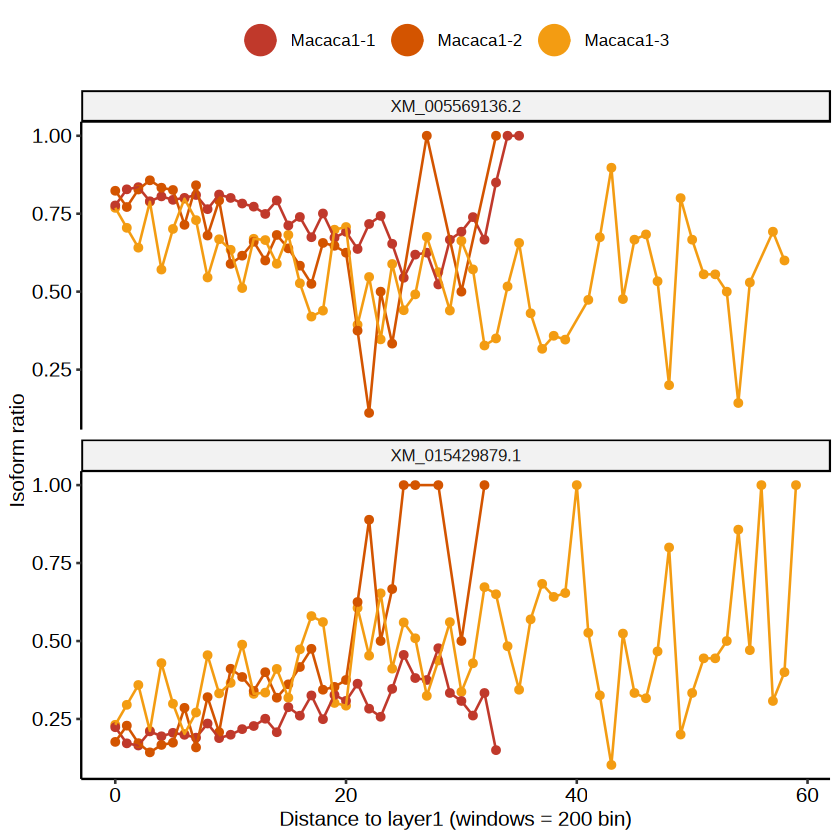

In [217]:
genehub = "DBNDD2"
transhub = c("XM_005569136.2","XM_015429879.1")
pdt = Plotlayerdist(fsraw.t44,l1cv.t44,genehub,transhub,200)
disst.t44 = pdt$disst
disst.t44$disgroup = "Macaca1-1"
pdt = Plotlayerdist(fsraw.t42,l1cv.t42,genehub,transhub,200)
disst.t42 = pdt$disst
disst.t42$disgroup = "Macaca1-2"
pdt = Plotlayerdist(fsraw.t47,l1cv.t47,genehub,transhub,200)
disst.t47 = pdt$disst
disst.t47$disgroup = "Macaca1-3"
disst = rbind(disst.t47,disst.t44,disst.t42)
disst = rbind(disst.t47,disst.t44,disst.t42)
pi = ggplot(disst,aes(x = distance_bin,y = ratio,color = disgroup)) +
          geom_point() + 
          geom_line() + 
          facet_wrap(transcript_id~.,ncol = 1) +
          theme_pubr() + 
          scale_color_flatui() +
          theme(legend.position = "top",legend.title = element_blank(),
                legend.text = element_text(size = 10)) +
          guides(color = guide_legend(override.aes = list(size=8),
                                      nrow = 1),
                size = "none") + xlab(paste0("Distance to layer1 (windows = ",200," bin)")) + ylab("Isoform ratio")
pi
ggexport(pi,filename = "result/figure_revision/Distance_to_layer1_DBNDD2_12_17.pdf",width = 5,height = 4)

In [229]:
head(fsraw.t47)

cidPos,readid,tranid,type,transcript_id,gene_id,sample,cell_label,gene_area,x,y,origin_name,cell_type,subclass,class,region,layer,group,subcortical
<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
10000_105826,read_6160281|adapterG_RC-adapterH_RC|5954-6560(-),215226,compatible,NM_001283712.1,TAGLN,T47_revo,948063,900,10000,105826,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex
10000_105826,read_16822062|adapterG_RC-adapterH_RC|5954-6560(-),215226,compatible,NM_001283712.1,TAGLN,T47_revo,948063,900,10000,105826,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex
10000_108587,read_5998725|adapterM_RC-adapterN_RC|1495-1952(-),224049,compatible,XM_005548772.2,ATP5O,T47_revo,0,900,10000,108587,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex
10000_108587,read_16660506|adapterM_RC-adapterN_RC|1495-1952(-),224049,compatible,XM_005548772.2,ATP5O,T47_revo,0,900,10000,108587,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex
10000_109072,read_6443305|adapterB_RC-adapterC_RC|9953-10779(-),271096,compatible,XM_015449558.1,CUTA,T47_revo,0,900,10000,109072,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex
10000_109072,read_17105086|adapterB_RC-adapterC_RC|9953-10779(-),271096,compatible,XM_015449558.1,CUTA,T47_revo,0,900,10000,109072,L-F1-l1,NA,NA,NA,F1,l1,Pacbio,Cortex


In [266]:
#PCA analysis
transt.t42 = fsraw.t42 %>% group_by(sample,gene_id,transcript_id) %>% summarise(count = length(unique(readid))) %>% 
                            group_by(sample,gene_id) %>% mutate(relative = count/sum(count)) %>% filter(count > 10) 
transt.t44 = fsraw.t44 %>% group_by(group,gene_id,transcript_id) %>% summarise(count = length(unique(readid))) %>% 
                            group_by(group,gene_id) %>% mutate(relative = count/sum(count)) %>% filter(count > 10) 
transt.t47 = fsraw.t47 %>% group_by(group,gene_id,transcript_id) %>% summarise(count = length(unique(readid))) %>% 
                            group_by(group,gene_id) %>% mutate(relative = count/sum(count)) %>% filter(count > 10) 
cmtrans = intersect(transt.t42$transcript_id,transt.t44$transcript_id)
cmtrans = intersect(transt.t47$transcript_id,cmtrans)
colnames(transt.t42)[1] = "group"
transtmx.t42 = dcast(transt.t42,group~transcript_id,value.var = "relative",fun.aggregate = sum)
transtmx.t47 = dcast(transt.t47,group~transcript_id,value.var = "relative",fun.aggregate = sum)
transtmx.t44 = dcast(transt.t44,group~transcript_id,value.var = "relative",fun.aggregate = sum)


`summarise()` has grouped output by 'sample', 'gene_id'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'group', 'gene_id'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'group', 'gene_id'. You can override using
the `.groups` argument.
Warning message:
"The dcast generic in data.table has been passed a grouped_df and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. Please do this redirection yourself like reshape2::dcast(transt.t42). In the next version, this warning will become an error."
Warning message:
"The dcast generic in data.table has been passed a grouped_df and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. Please do this redirection yourself like reshap

In [267]:
# rt_vm116
rt_vm116$group = "VM_Pacbio"
transt.vm = rt_vm116 %>% group_by(group,gene_id,transcript_id) %>% summarise(count = length(unique(readid))) %>% 
                            group_by(group,gene_id) %>% mutate(relative = count/sum(count)) %>% filter(count > 10) 
transtmx.vm = dcast(transt.vm,group~transcript_id,value.var = "relative",fun.aggregate = sum)

rt_me01$group = "ME_Pacbio"
transt.me = rt_me01 %>% group_by(group,gene_id,transcript_id) %>% summarise(count = length(unique(readid))) %>% 
                            group_by(group,gene_id) %>% mutate(relative = count/sum(count)) %>% filter(count > 10) 
transtmx.me = dcast(transt.me,group~transcript_id,value.var = "relative",fun.aggregate = sum)

cmtrans = intersect(transt.t42$transcript_id,transt.t44$transcript_id)
cmtrans = intersect(transt.t47$transcript_id,cmtrans)
cmtrans = intersect(transt.vm$transcript_id,cmtrans)
cmtrans = intersect(transt.me$transcript_id,cmtrans)
length(cmtrans)
transtmx = rbind(transtmx.t42[,c("group",cmtrans)],
                 transtmx.t44[,c("group",cmtrans)],
                 transtmx.t47[,c("group",cmtrans)],
                transtmx.vm[,c("group",cmtrans)],
                transtmx.me[,c("group",cmtrans)])
dim(transtmx)
transtmx[,1:5]

`summarise()` has grouped output by 'group', 'gene_id'. You can override using
the `.groups` argument.
Warning message:
"The dcast generic in data.table has been passed a grouped_df and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. Please do this redirection yourself like reshape2::dcast(transt.vm). In the next version, this warning will become an error."
`summarise()` has grouped output by 'group', 'gene_id'. You can override using
the `.groups` argument.
Warning message:
"The dcast generic in data.table has been passed a grouped_df and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. Please do this redirection yourself like reshape2::dcast(transt.me). In the next version, this warning will become an error."


[1] 5733

[1]   10 5734

group,NM_001284010.1,XM_015433569.1,XM_005574267.2,XM_005584316.2
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
T42_revo,0.4375000,1,0.9059829,0.9790105
cycf,0.8943948,1,0.1066282,0.9904580
ontd,0.8409091,1,0.9238754,0.9907514
ontf,0.8987952,1,0.1252108,0.9900442
pacbio,0.5217391,1,0.0000000,0.9812081
Cyclone,0.6081081,1,0.0000000,0.9781250
ONT,0.0000000,1,0.0000000,0.0000000
Pacbio,0.9008264,1,0.8800000,0.9872242
VM_Pacbio,0.9206349,1,0.8857143,0.9724771


In [268]:
transtmx = rbind(transtmx.t42[,c("group",cmtrans)],
                 transtmx.t44[,c("group",cmtrans)],
                 transtmx.t47[,c("group",cmtrans)],
                transtmx.vm[,c("group",cmtrans)],
                transtmx.me[,c("group",cmtrans)])
groupmap = data.frame("group" = c("T42_revo","cycf","ontd","ontf","pacbio","Cyclone","ONT","Pacbio","VM_Pacbio","ME_Pacbio"),
                     "Methods" = c("Fullscope-Pacbio",
                                   "Fullscope-Cyclone","Direct-ONT","Fullscope-ONT","Fullscope-Pacbio",
                                   "Fullscope-Cyclone","Fullscope-ONT","Fullscope-Pacbio","Fullscope-Pacbio","Fullscope-Pacbio"),
                     "Sample" = c("Macaca1-2","Macaca1-1","Macaca1-1","Macaca1-1","Macaca1-1",
                                 "Macaca1-3","Macaca1-3","Macaca1-3","Macaca2-1","Macaca3-1"))
transtmx = merge(transtmx,groupmap,by = "group")
rownames(transtmx) = transtmx$group;transtmx = transtmx[,-1]
transtmx[,1:10]

,NM_001284010.1,XM_015433569.1,XM_005574267.2,XM_005584316.2,XM_005579510.2,XM_005591210.2,XM_005584793.2,XM_005574365.2,XM_015431731.1,XM_005552911.2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
cycf,0.8943948,1,0.1066282,0.9904580,1,0.9050825,1,1,0.9963768,1
Cyclone,0.6081081,1,0.0000000,0.9781250,1,0.7222222,1,1,1.0000000,1
ME_Pacbio,1.0000000,1,0.9364407,0.9905858,1,1.0000000,1,1,1.0000000,1
ONT,0.0000000,1,0.0000000,0.0000000,1,0.9230769,1,0,0.0000000,0
ontd,0.8409091,1,0.9238754,0.9907514,1,0.9418605,1,1,1.0000000,1
ontf,0.8987952,1,0.1252108,0.9900442,1,0.9038986,1,1,0.9977679,1
pacbio,0.5217391,1,0.0000000,0.9812081,1,0.9359823,1,1,1.0000000,1
Pacbio,0.9008264,1,0.8800000,0.9872242,1,0.6211340,1,1,0.9980658,1
T42_revo,0.4375000,1,0.9059829,0.9790105,1,0.7523364,1,1,0.9874687,1


[1]   10 5733

[1]    9 5733

[1]    9 2209

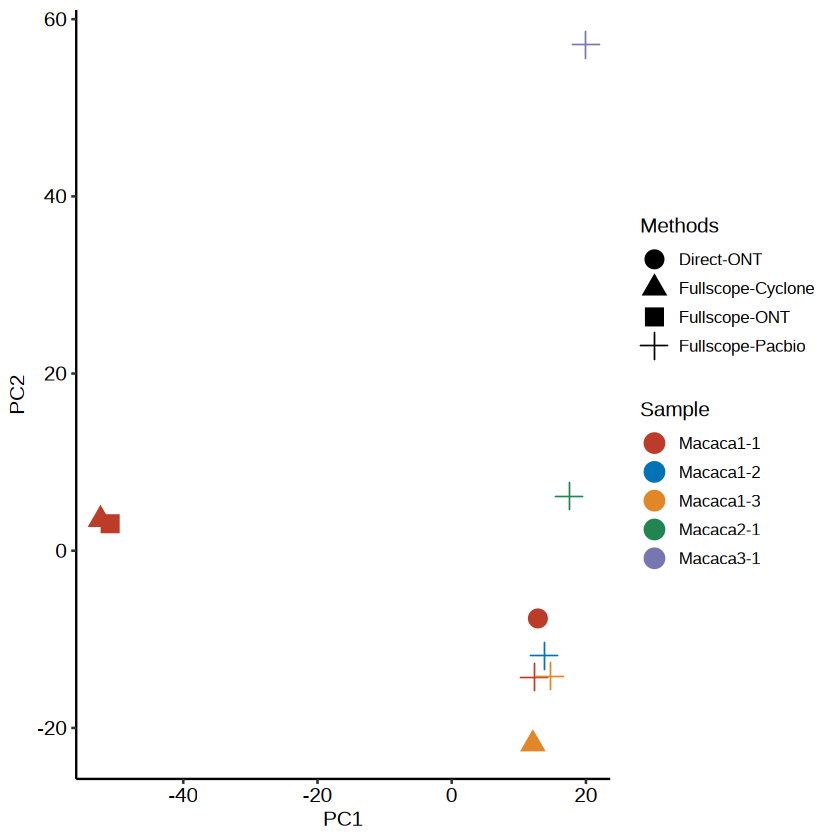

In [269]:

pca_data_clean <- transtmx[,-c(ncol(transtmx),ncol(transtmx)-1)]
dim(pca_data_clean)
transtmx = transtmx[rowSums(pca_data_clean > 0) > ncol(pca_data_clean)/2,]
pca_data_clean = pca_data_clean[rowSums(pca_data_clean > 0) > ncol(pca_data_clean)/2,]
dim(pca_data_clean)
pca_data_clean = pca_data_clean[,colSums(pca_data_clean > 0.01 & pca_data_clean < 0.99) > 1 ]
# dim(pca_data_clean)
# zero_var_cols <- which(apply(pca_data_clean, 2, var) == 0)
# pca_data_clean <- pca_data_clean[, -zero_var_cols]
dim(pca_data_clean)
res.pca <- prcomp(pca_data_clean, scale = TRUE)
res.pcadf = as.data.frame(res.pca$x)
res.pcadf$Methods = transtmx$Methods
res.pcadf$Sample = transtmx$Sample
p1.0 = ggplot(res.pcadf,aes(x = PC1,y = PC2,color = Sample,shape = Methods)) + 
                geom_point(size = 5) + theme_pubr() + theme(legend.position = "right") + 
                # facet_wrap(~group) + 
                scale_color_nejm()
p1.0

In [271]:
ggexport(p1.0,filename = "result/figure_revision/Sample_technology_PCA_compare_25_12_17.pdf",width = 6,height = 4)

file saved to result/figure_revision/Sample_technology_PCA_compare_25_12_17.pdf



### Case replicates plot

In [22]:
lobeorder = c('cingulate','somatosensory','parietal','auditory','temporal','occipital')

In [28]:
unique(fsraw.t47[fsraw.t47$gene_id == "ARPP19",]$lobe)

[1] NA              "frontal"       "cingulate"     "temporal"     
[5] "insulate"      "somatosensory" "auditory"

In [35]:
## Spatial cases pie plot
caseg = c("CD47",'NTRK2',"DDRGK1","ARPP19","DBNDD2","TPM3")
#"ARPP21"
isosigi = isosigls.t47$layer
transsig = c('XM_015452432.1','XM_005541217.2','XR_001492897.1','XM_005541701.2',
             'XM_005541710.2','XM_005570477.2','XM_005570483.2',' NM_001284070.1',
             'XM_005541713.2','XM_005548232.2','XM_005548234.2','NM_001283415.1',
             'XM_005548232.2','XM_005548234.2','XM_005569136.2',
             'XM_015429879.1','DDRGK1-FS-1','XM_005568473.2','XM_005582047.2','XM_005582051.2','XM_005541710.2')
# transsig
fsraw.cor.hub = fsraw.t47[fsraw.t47$gene_id %in% caseg & fsraw.t47$layer %in% paste0("l",1:6),]
isosigi = isosigls.t47$layer
casect = fsraw.cor.hub %>% group_by(layer,lobe,gene_id,transcript_id) %>% 
                summarise(count = length(readid)) %>% 
                group_by(layer,lobe,gene_id) %>% 
                mutate(genecount = sum(count),rate = count/genecount)


casect.totall = fsraw.cor.hub %>% group_by(layer,gene_id,transcript_id) %>% 
                summarise(count = length(readid)) %>% 
                group_by(layer,gene_id) %>% 
                mutate(genecount = sum(count),rate = count/genecount)
casect.totall$lobe = "Total"
casect.totalb = fsraw.cor.hub %>% group_by(lobe,gene_id,transcript_id) %>% 
                summarise(count = length(readid)) %>% 
                group_by(lobe,gene_id) %>% 
                mutate(genecount = sum(count),rate = count/genecount)
casect.totalb$layer = "Total"
casect.total = fsraw.cor.hub %>% group_by(gene_id,transcript_id) %>% 
                summarise(count = length(readid)) %>% 
                group_by(gene_id) %>% 
                mutate(genecount = sum(count),rate = count/genecount)
casect.total$layer = "Total"
casect.total$lobe = "Total"

casect = rbind(casect.totall,casect.totalb,casect.total,casect)
casect = casect[casect$transcript_id %in% transsig,]
casect = casect %>% group_by(gene_id) %>% mutate(id = as.character(as.numeric(as.factor(transcript_id))))
casect$gene_tran = paste0(casect$gene_id,"-",casect$id)
#casect = casect[casect$genecount > 5,]
casectl = dcast(casect,layer+lobe+gene_id~id,value.var = "rate")
casectl$group = paste0(casectl$layer,"-",casectl$lobe,"-",casectl$gene_id)
casectl[is.na(casectl)] = 0
casectl$layerid = as.numeric(factor(casectl$layer,levels = c(paste0("l",1:6),"Total")))
casectl$lobeid = as.numeric(factor(casectl$lobe,levels = c("Total",lobeorder)))
unique(casectl$lobe)

`summarise()` has grouped output by 'layer', 'lobe', 'gene_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'layer', 'gene_id'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'lobe', 'gene_id'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'gene_id'. You can override using the
`.groups` argument.


[1] "auditory"      "cingulate"     "frontal"       "insulate"     
[5] "somatosensory" "temporal"      "Total"

[1] "#C084C7" "#B6D49D"

Warning message:
"Removed 154 rows containing non-finite outside the scale range (`stat_pie()`)."
Warning message:
"Removed 77 rows containing missing values or values outside the scale range
(`geom_tile()`)."
Warning message:
"Removed 154 rows containing non-finite outside the scale range (`stat_pie()`)."
Warning message:
"Removed 77 rows containing missing values or values outside the scale range
(`geom_tile()`)."
file saved to result/figure2/case_layer_isoform_rate_stat_pie_T47_25_12_22.pdf



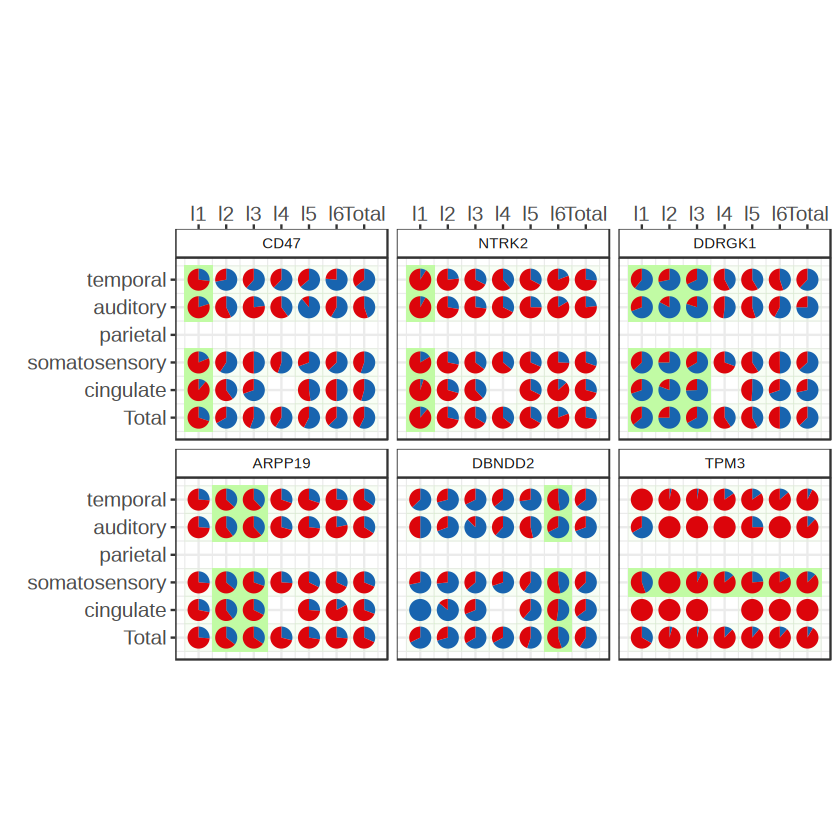

In [36]:
library(patchwork)
library(scatterpie)
#caseg = c("MYL6",'NTRK2',"DBNDD2","DDRGK1","ARPP19","KCNIP4")
mycolors = distinctColorPalette(2)
mycolor =  c('#1864AF','#DC050B','#F7EF55')
mycolors
#names(mycolors) = transname

casectl$gene_id = factor(casectl$gene_id,levels = caseg)
casectl$sig = 'N'
casectl$siggroup = paste0(casectl$gene_id,"-",casectl$layer)
casectl[casectl$siggroup %in% c("CD47-l1","NTRK2-l1","DDRGK1-l1","DDRGK1-l2","DDRGK1-l3",
                                "ARPP19-l2","ARPP19-l3","DBNDD2-l6"),]$sig = "Y"
casectl$siggroup = paste0(casectl$gene_id,"-",casectl$lobe)
casectl[casectl$siggroup %in% c("TPM3-somatosensory"),]$sig = "Y"
casectl$alpha = 0
casectl[casectl$sig == "Y",]$alpha = 0.3
#casectl
# isosigi = isosigls$layer
# isosigi = isosigi[isosigi$sig != "N",]
# casectl[paste0(casectl$layer,casectl$gene_id) %in% paste0(isosigi$areatr,isosigi$gene_id),]$sig = "Y"

plt = ggplot(data = casectl,aes(x = layerid, y = lobeid)) + 
      geom_tile(aes(alpha = alpha),fill = "#c1fba4") +
      geom_scatterpie(data = casectl,aes(x = layerid, y = lobeid,group = group,r = 0.4),color=NA,
                      cols=colnames(casectl)[4:5]) + 
      facet_wrap(~gene_id,nrow = 2) +
      # geom_histogram(data = root_sprn,aes(mean.model),bins = 100) +
      coord_fixed() +
      scale_x_continuous(breaks = c(1:7),labels = c(paste0("l",1:6),"Total"),position = "top")+
      scale_y_continuous(breaks = c(1:7),labels = c("Total",lobeorder)) +
      # geom_smooth(data = tem2, aes(x=x, y=y), se = F, method = 'loess',color = "black") +
      scale_fill_manual(values = mycolor) +
      #scale_fill_manual(values = mycolors) +
      #annotate("text", x = 8, y = 7, label = caseg[i], hjust = 1.1, vjust = 1.1, size = 5, angle = 90) +
      ylab("") + xlab("") +
      theme_bw() + theme(legend.position="none",axis.text = element_text(size = 12),
                        strip.background =element_rect(fill="white"))
plt
ggexport(plt,filename = "result/figure2/case_layer_isoform_rate_stat_pie_T47_25_12_22.pdf",width = 9,height = 4)

## Celltype annotation

In [110]:
unique(fsraw.case$transcript_id)
cellanuq.t44 = unique(fsraw.t44[fsraw.t44$subclass != "" & !is.na(fsraw.t44$subclass),c("x","y","region","class","subclass")])

[1] "XM_005569136.2" "XM_015429879.1" "XM_005569137.2" "XM_005569139.2"
[5] "XM_005569138.2" "DBNDD2-FS-1"

In [122]:
summary(cellanuq.t44.hub$x)
summary(cellanuq.t44.hub$y)
nrow(cellanuq.t44.hub)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  41551   45623   49091   48518   50937   54239 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  67981   74139   76883   77536   80589   87410 

[1] 10000

[1] 19192

[1] 24192

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."


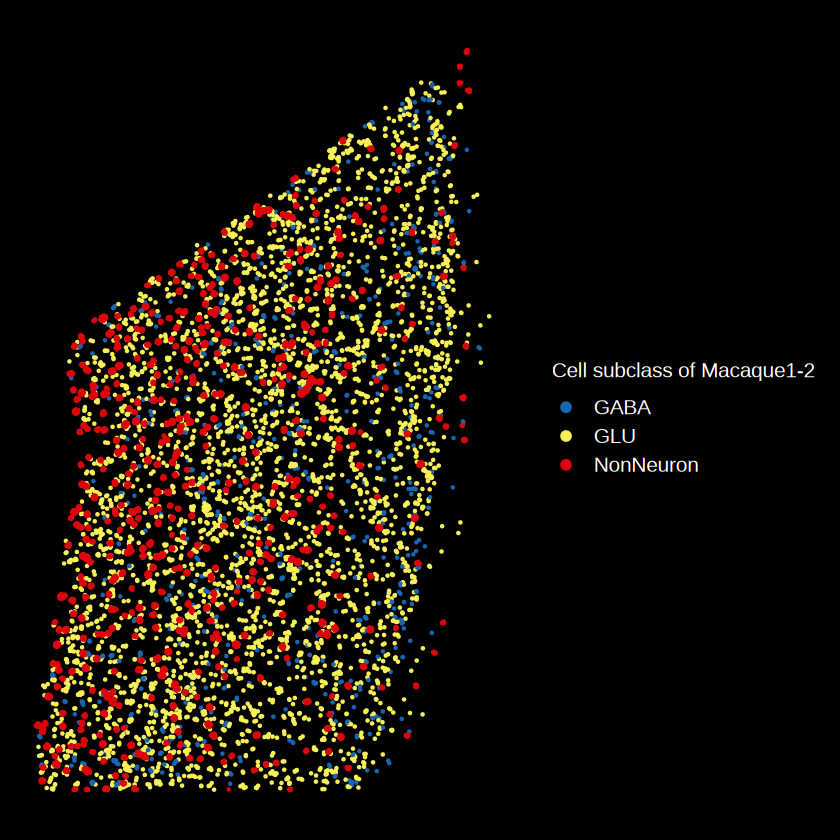

In [137]:
# fsraw.case = fsraw.t44[fsraw.t44$gene_id == "DBNDD2",]
# fsraw.case$cluster = "other"
# fsraw.case[fsraw.case$subclass != "OLG",]$cluster = "other"
# fsraw.case[fsraw.case$transcript_id == "XM_015429879.1",]$cluster = "OLG"
cellanuq.t44.hub = cellanuq.t44[cellanuq.t44$region == "TEO" &
                                cellanuq.t44$x < 48000 & 
                                cellanuq.t44$y < 75000,]
cellanuq.t44.hub.nn = cellanuq.t44.hub[cellanuq.t44.hub$subclass == "OLG",]
nrow(cellanuq.t44.hub.nn)
cellanuq.t44.hub.ot = cellanuq.t44.hub[cellanuq.t44.hub$class != "NonNeuron",]
# cellanuq.t44.hub.nn = cellanuq.t44.hub.nn[sample(1:nrow(cellanuq.t44.hub.nn),10000),]
cellanuq.t44.hub.ot = cellanuq.t44.hub.ot[sample(1:nrow(cellanuq.t44.hub.ot),5000),]
cellanuq.t44.hub = rbind(cellanuq.t44.hub.ot,cellanuq.t44.hub.nn)
nrow(cellanuq.t44.hub)
mytest = ggplot() +
        geom_point(
            data = cellanuq.t44.hub, aes(x, y,color = class),
            size = 1,stroke = NA
          ) +
        # geom_point(data = fsraw.case[fsraw.case$region == "1|2" & fsraw.case$x < 10000 &
        #                              fsraw.case$y < 35000, ], aes(x, y,color = cluster),
        #     size = 2,stroke = NA
        #   ) +
    # scale_color_manual(values = c("red","grey")) +
    scale_color_discreterainbow() +
    guides(color = guide_legend(override.aes = list(size=3),
                                title = "Cell subclass of Macaque1-2")) +
    theme_presentation() + scale_y_reverse() + scale_x_reverse()
mytest

In [41]:
cellanuq.t42 = unique(fsraw.t42[fsraw.t42$subclass != "" & !is.na(fsraw.t42$subclass),c("x","y","cell_label","lobe","layer","subclass","class")])
cellanuq.t47 = unique(fsraw.t47[fsraw.t47$subclass != "" & !is.na(fsraw.t47$subclass),c("x","y","cell_label","lobe","layer","subclass","class")])
head(cellanuq.t42)

x,y,cell_label,lobe,layer,subclass,class
<int>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>
10000,23139,594174,somatosensory,l3,L2/3,GLU
10000,23557,655781,somatosensory,l3,L3/4,GLU
10000,24474,627531,somatosensory,l5,L4/5,GLU
10000,25672,592688,somatosensory,l5,L6,GLU
10000,26769,345979,somatosensory,l5,L4/5,GLU
10000,27618,747574,somatosensory,l6,L4/5/6,GLU


In [42]:
cellanuq.t42 = cellanuq.t42 %>% group_by(cell_label,lobe,layer,subclass,class) %>% summarise(x = mean(x),y = mean(y))
cellanuq.t47 = cellanuq.t47 %>% group_by(cell_label,lobe,layer,subclass,class) %>% summarise(x = mean(x),y = mean(y))
cellstlayer.t42 = cellanuq.t42 %>% group_by(layer,subclass,class) %>% summarise(cellnum = length(unique(cell_label)))
cellstlayer.t47 = cellanuq.t47 %>% group_by(layer,subclass,class) %>% summarise(cellnum = length(unique(cell_label)))
cellstlobe.t42 = cellanuq.t42 %>% group_by(lobe,subclass,class) %>% summarise(cellnum = length(unique(cell_label)))
cellstlobe.t47 = cellanuq.t47 %>% group_by(lobe,subclass,class) %>% summarise(cellnum = length(unique(cell_label)))


`summarise()` has grouped output by 'cell_label', 'lobe', 'layer', 'subclass'.
You can override using the `.groups` argument.
`summarise()` has grouped output by 'cell_label', 'lobe', 'layer', 'subclass'.
You can override using the `.groups` argument.
`summarise()` has grouped output by 'layer', 'subclass'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'layer', 'subclass'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'lobe', 'subclass'. You can override using
the `.groups` argument.
`summarise()` has grouped output by 'lobe', 'subclass'. You can override using
the `.groups` argument.


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
file saved to result/figure3/subclass_annotation_T42_25_12_23.pdf

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."


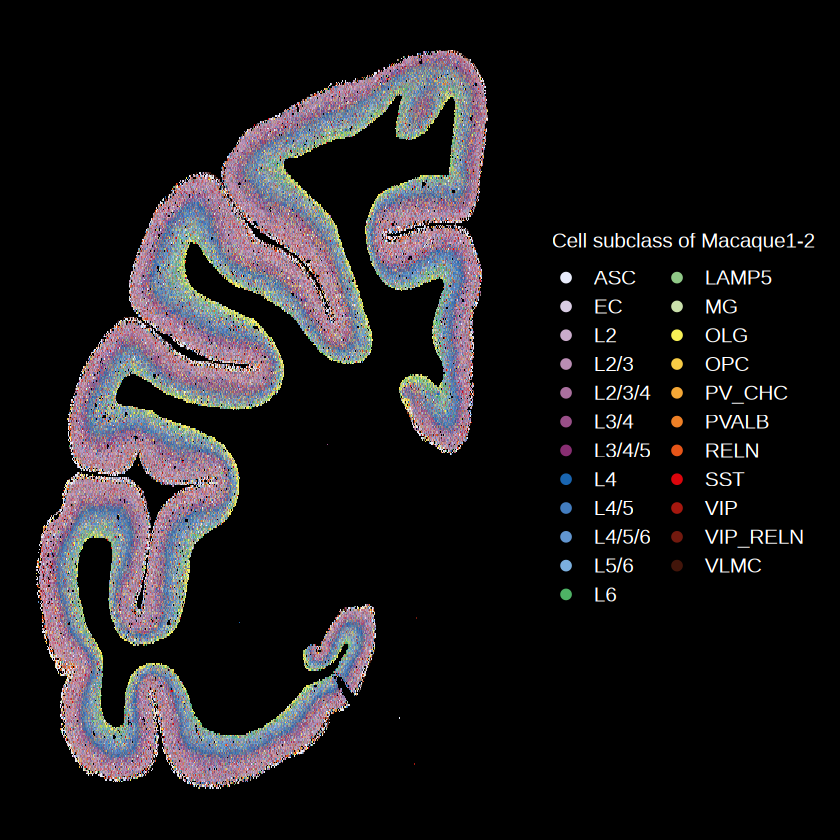

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
file saved to result/figure3/subclass_annotation_T47_25_12_23.pdf



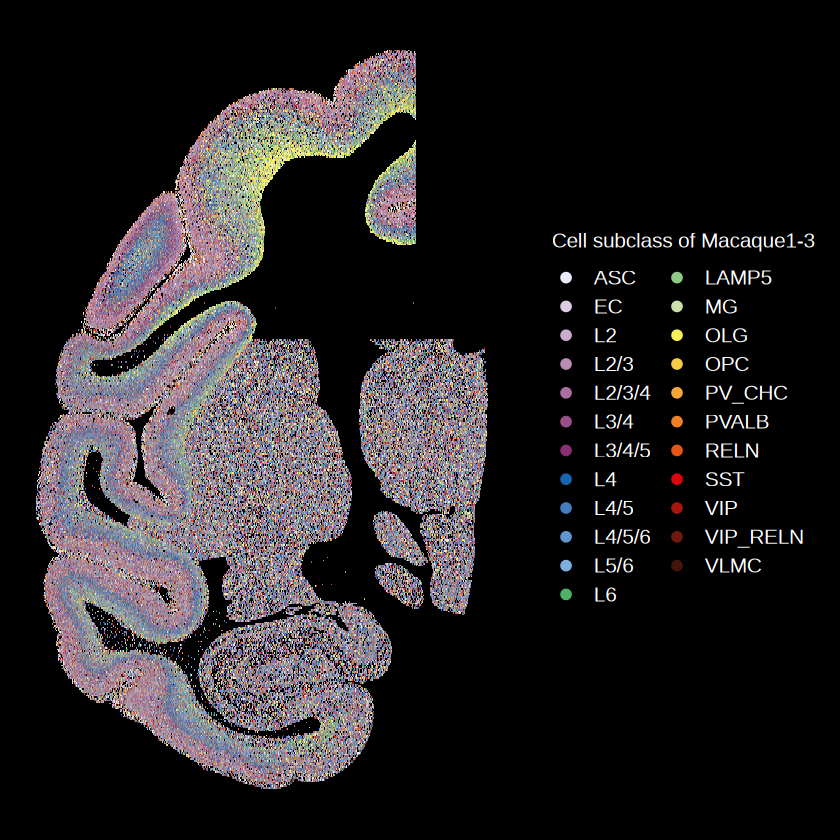

In [54]:
pmetacp.t42 = ggplot(data = cellanuq.t42, aes(x, y,color = subclass)) +
        # geom_point(
        #     size = 0.01,stroke = NA
        #   ) +
    scattermore::geom_scattermore(
        pointsize = 1,stroke = NA
      ) +
    scale_color_discreterainbow() +
    guides(color = guide_legend(override.aes = list(size=3),
                                title = "Cell subclass of Macaque1-2")) +
    theme_presentation() + scale_y_reverse() + scale_x_reverse()
pmetacp.t42
ggexport(pmetacp.t42, filename = "result/figure3/subclass_annotation_T42_25_12_23.pdf", width = 6, height = 4)

pmetacp.t47 = ggplot(data = cellanuq.t47, aes(x, y,color = subclass)) +
        # geom_point(
        #     size = 0.01,stroke = NA
        #   ) +
    scattermore::geom_scattermore(
        pointsize = 1,stroke = NA
      ) +
    scale_color_discreterainbow() +
    guides(color = guide_legend(override.aes = list(size=3),
                                title = "Cell subclass of Macaque1-3")) +
    theme_presentation() + scale_x_reverse()
pmetacp.t47
ggexport(pmetacp.t47, filename = "result/figure3/subclass_annotation_T47_25_12_23.pdf", width = 6, height = 4)

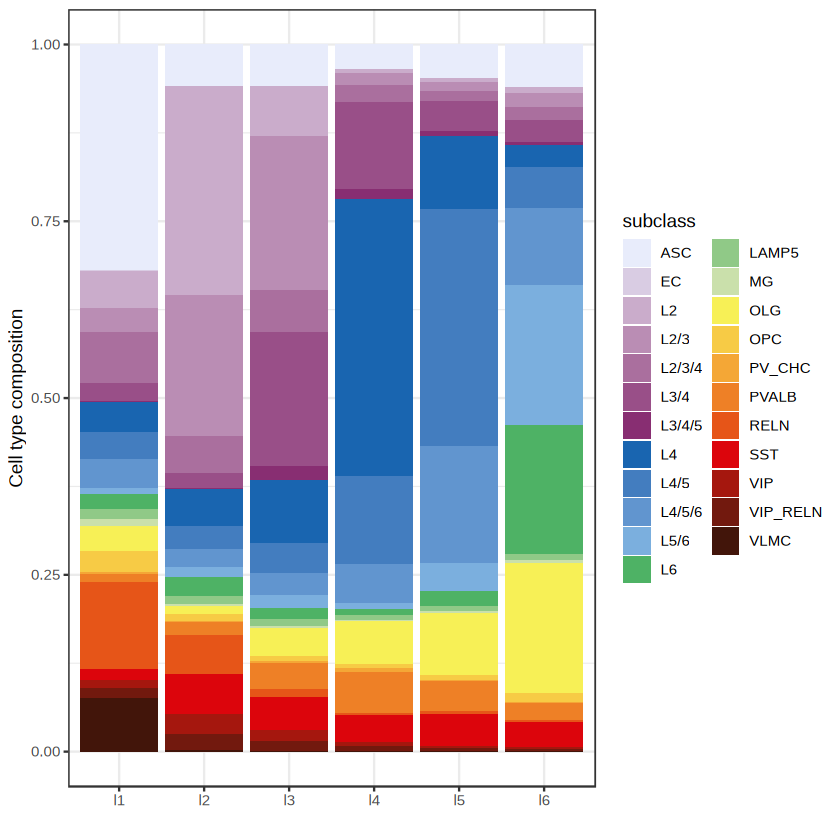

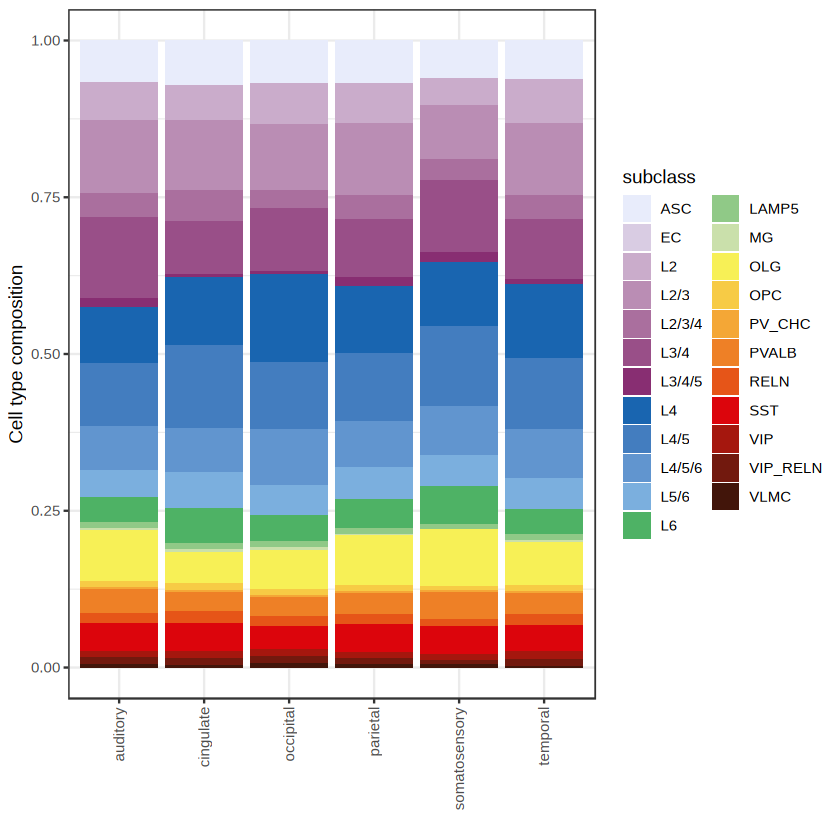

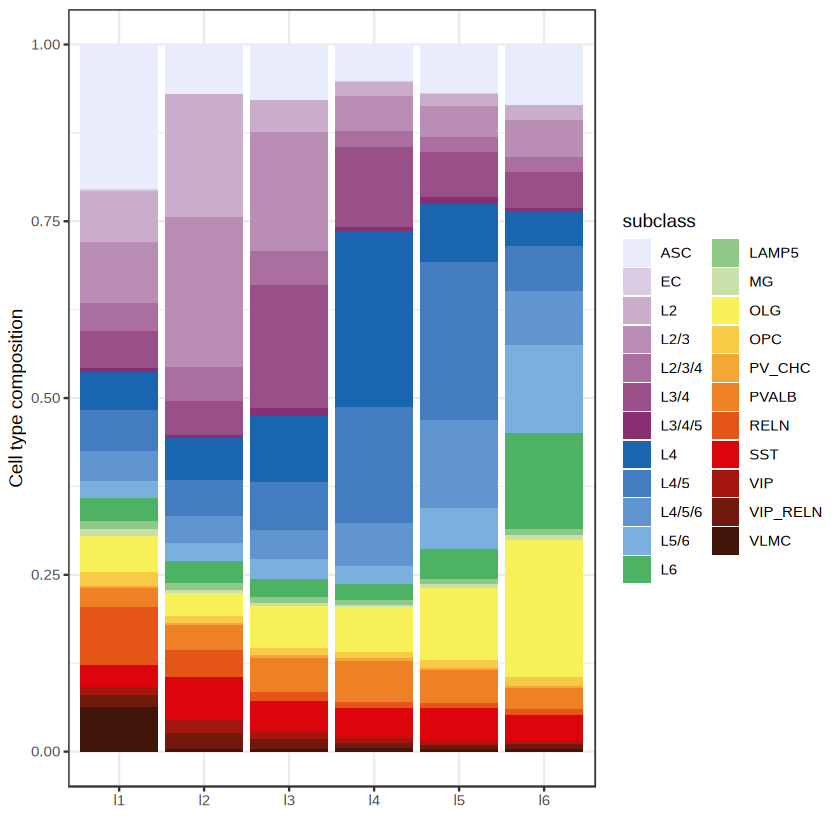

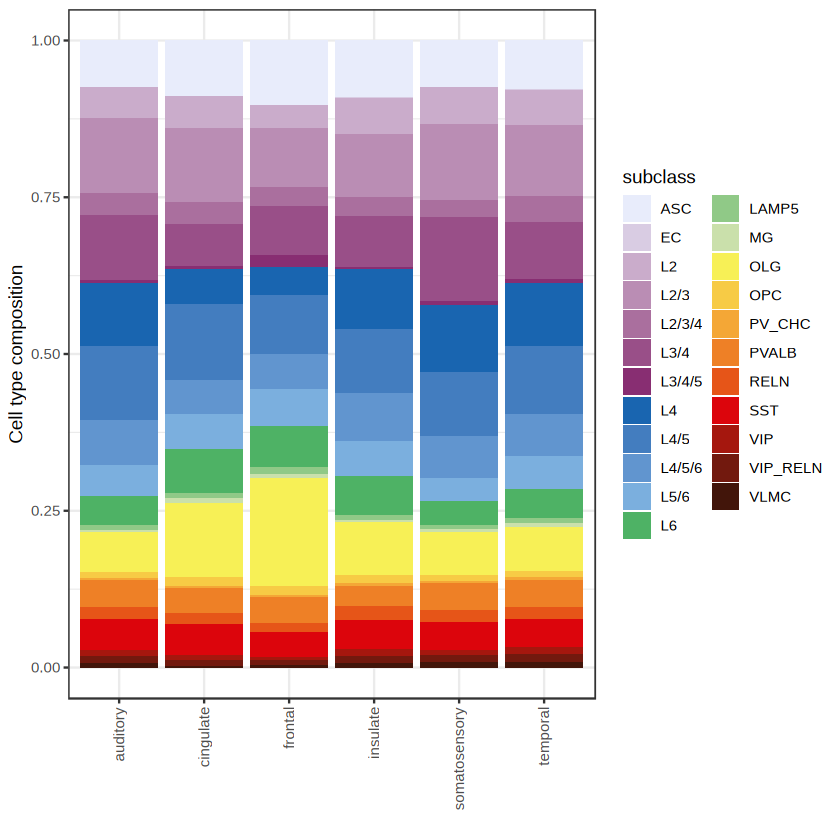

file saved to result/figure3/subclass_annotation_stat_T42_25_12_23.pdf

file saved to result/figure3/subclass_annotation_stat_T47_25_12_23.pdf



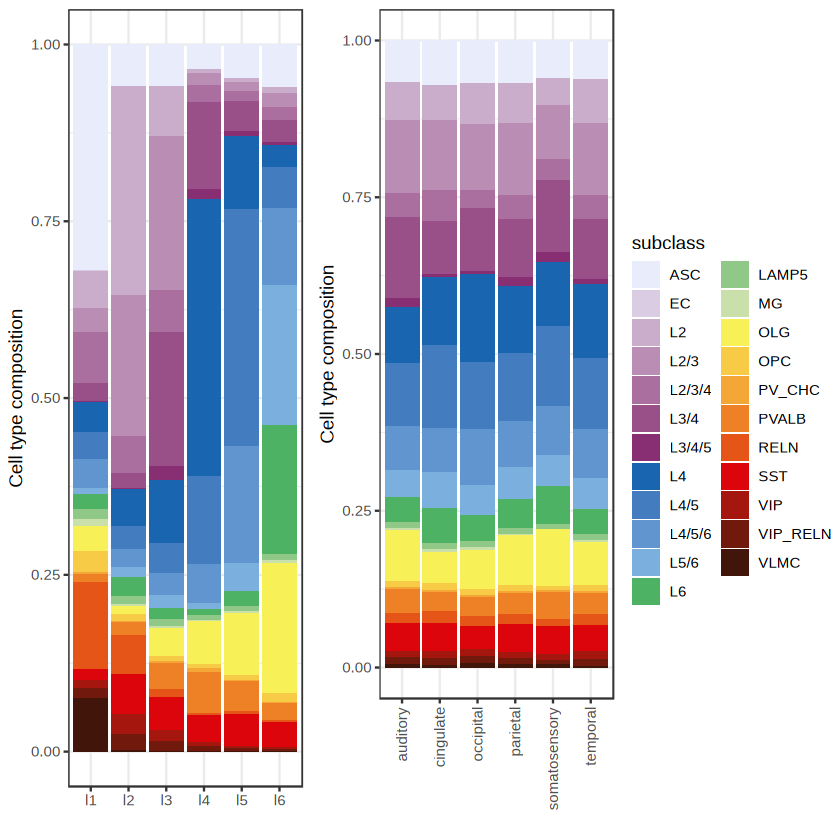

In [63]:
pclst1.t42 = ggplot(data = cellstlayer.t42[cellstlayer.t42$layer %in% paste0("l",1:6),], 
                    aes(x = layer, y = cellnum, fill = subclass)) +
        geom_bar(
            position = "fill",stat = "identity"
          ) +
        scale_fill_discreterainbow() +
        theme_bw() + ylab("Cell type composition") + xlab("")
pclst1.t42
pclst2.t42 = ggplot(data = cellstlobe.t42[!is.na(cellstlobe.t42$lobe),], 
                    aes(x = lobe, y = cellnum, fill = subclass)) +
        geom_bar(
            position = "fill",stat = "identity"
          ) +
        scale_fill_discreterainbow() +
        theme_bw() + theme(axis.text.x = element_text(angle = 90,hjust = 1,vjust = 0.5))  + 
        ylab("Cell type composition") + xlab("")
pclst2.t42

pclst1.t47 = ggplot(data = cellstlayer.t47[cellstlayer.t47$layer %in% paste0("l",1:6),], 
                    aes(x = layer, y = cellnum, fill = subclass)) +
        geom_bar(
            position = "fill",stat = "identity"
          ) +
        scale_fill_discreterainbow() +
        theme_bw()  + ylab("Cell type composition") + xlab("")
pclst1.t47
pclst2.t47 = ggplot(data = cellstlobe.t47[!is.na(cellstlobe.t47$lobe),], 
                    aes(x = lobe, y = cellnum, fill = subclass)) +
        geom_bar(
            position = "fill",stat = "identity"
          ) +
        scale_fill_discreterainbow() +
        theme_bw()  + ylab("Cell type composition") + xlab("") +
        theme(axis.text.x = element_text(angle = 90,hjust = 1,vjust = 0.5))
pclst2.t47
ggarrange(pclst1.t42,pclst2.t42,common.legend = T,legend = "right")
ggexport(ggarrange(pclst1.t42,pclst2.t42,common.legend = T,legend = "right"), 
         filename = "result/figure3/subclass_annotation_stat_T42_25_12_23.pdf", width = 6, height = 4)
ggexport(ggarrange(pclst1.t47,pclst2.t47,common.legend = T,legend = "right"), 
         filename = "result/figure3/subclass_annotation_stat_T47_25_12_23.pdf", width = 6, height = 4)

In [ ]:
pmetacp = ggplot(data = cellanuq, aes(x, y,color = layer)) +
    scattermore::geom_scattermore(
        pointsize = 1.5
      ) +
    # geom_pointdensity(size = 0.1) +
    scale_color_discreterainbow() +
    # scale_color_viridis(option = "D") +
    guides(color = guide_legend(override.aes = list(size=3),
                                title = "Cell subclass")) +
    facet_wrap(~subclass) +
    theme_presentation() + scale_y_reverse() + scale_x_reverse()
pmetacp
ggexport(pmetacp, filename = "result/figure2/subclass_annotation_facet_wrap_24_05_14.pdf", width = 12, height = 12)

## Cross region annotation and analysis

In [189]:
anodf.cb = read.csv("ref/cross_region/macaque_T42_anno.csv")
anodf.cb$subclass = anodf.cb$celltype_new
anodf.cb$class = anodf.cb$celltype_new
anodf.cb[anodf.cb$celltype_new == "Astrocyte",]$subclass = "ASC"
anodf.cb[anodf.cb$celltype_new == "Microglia",]$subclass = "MG"
anodf.cb[anodf.cb$celltype_new == "ODC",]$subclass = "OLG"
anodf.cb[anodf.cb$celltype_new %in% c("MLI1","MLI2"),]$subclass = "MLI"
anodf.cb[anodf.cb$celltype_new %in% c("Granule","UBC"),]$class = "GLU"
anodf.cb[anodf.cb$celltype_new %in% c("Purkinje","Golgi","MLI1","MLI2","PLI"),]$class = "GABA"
anodf.cb[anodf.cb$celltype_new %in% c("Astrocyte","Bergmann","ODC","OPC","Microglia",
                                    "Endothelial_stalk","Fibroblast","Choroid"),]$class = "NonNeuron"
table(anodf.cb$subclass)
table(anodf.cb$class)
write.csv(anodf.cb,file = "ref/cross_region/macaque_T42_myanno.csv",row.names = F, quote = F)


              ASC          Bergmann           Choroid Endothelial_stalk 
              910              1528               917              2292 
       Fibroblast             Golgi           Granule                MG 
              865              1394             24958               953 
              MLI               OLG               OPC               PLI 
             2730               734               952               326 
         Purkinje               UBC 
             1162              1285 


     GABA       GLU NonNeuron 
     5612     26243      9151 

In [197]:
# fsraw.t42
fsraw.sub = fsraw.t42[fsraw.t42$subcortical %in% c("Cerebellum"),]
cellmatch = match(fsraw.sub$cell_label,anodf.cb$cell_label)
fsraw.sub$subclass = anodf.cb[cellmatch,]$subclass
fsraw.sub$class = anodf.cb[cellmatch,]$class
fsraw.t42 = rbind(fsraw.t42[!fsraw.t42$subcortical %in% c("Cerebellum"),],fsraw.sub)
qsave(fsraw.t42,file = "data/reads_full_anotation/T42_main_data_read_total_annotation_delete_multiread_total_hubselect_crossan_25_12_22.qs")

In [198]:
anodf.hp = read.csv("ref/cross_region/T47.hp.csv")
#table(anodf.hp$cellType)
anodf.hp$subclass = anodf.hp$cellType
anodf.hp$class = anodf.hp$cellType
anodf.hp[anodf.hp$cellType == "astrocyte",]$subclass = "ASC"
anodf.hp[anodf.hp$cellType %in% c("GABA CCK-1","GABA CCK-2","GABA CCK-3","GABA CCK-4"),]$subclass = "CCK"
anodf.hp[anodf.hp$cellType %in% c("GABA LAMP5-1","GABA LAMP5-2","GABA LAMP5-3","GABA LAMP5-4"),]$subclass = "LAMP5"
anodf.hp[anodf.hp$cellType %in% c("GABA PVALB-1","GABA PVALB-2","GABA PVALB-3"),]$subclass = "PVALB"
anodf.hp[anodf.hp$cellType %in% c("GABA SST-1","GABA SST-2"),]$subclass = "SST"
anodf.hp[anodf.hp$cellType %in% c("GABA VIP-1"),]$subclass = "VIP"
anodf.hp[anodf.hp$cellType %in% c("Glu CA1-1","Glu CA1-2","Glu CA2/3-1",
                                  "Glu CA3/4-1","Glu  CA3/4-2","Glu CA3/4-2"),]$subclass = "Pyr"
anodf.hp[anodf.hp$cellType %in% c("Glu DG-1","Glu DG-2","Glu DG-3","Glu DG-4"),]$subclass = "Granule"
anodf.hp[anodf.hp$cellType %in% c("Glu pSUB-deep-1","Glu pSUB-deep-2","Glu pSUB-deep-3","Glu pSUB-int-1",
                                  "Glu pSUB-int-2","Glu pSUB-int-3","Glu pSUB-int-4","Glu pSUB-int-5",
                                  "Glu pSUB-int-6","Glu pSUB-int-7","Glu SUB-1"),]$subclass = "pSUB"
anodf.hp[anodf.hp$cellType %in% c("microglia"),]$subclass = "MG"
anodf.hp[anodf.hp$cellType %in% c("olig"),]$subclass = "OLG"
anodf.hp$class = MySplit(anodf.hp$cellType," ",1)
anodf.hp[anodf.hp$cellType %in% c("astrocyte","microglia","olig","OPC","VLMC"),]$class = "NonNeuron"
anodf.hp[anodf.hp$class == "Glu",]$class = "GLU"
table(anodf.hp$subclass)
table(anodf.hp$class)
write.csv(anodf.hp,file = "ref/cross_region/macaque_T47_myanno_hippo.csv",row.names = F, quote = F)


    ASC     CCK Granule   LAMP5      MG     OLG     OPC    pSUB   PVALB     Pyr 
   8612     431    4103     203    1373    4829     239    4630     513    3326 
    SST     VIP    VLMC 
    235      70     157 


     GABA       GLU NonNeuron 
     1452     12059     15210 

In [205]:
# fsraw.t42
fsraw.sub = fsraw.t47[fsraw.t47$subcortical %in% c("Hippocampus"),]
cellmatch = match(fsraw.sub$cell_label,anodf.hp$cellID)
fsraw.sub$subclass = anodf.hp[cellmatch,]$subclass
fsraw.sub$class = anodf.hp[cellmatch,]$class
table(fsraw.sub$subclass)
fsraw.t47 = rbind(fsraw.t47[!fsraw.t47$subcortical %in% c("Hippocampus"),],fsraw.sub)
qsave(fsraw.t47,file = "data/reads_full_anotation/T47_main_data_read_total_annotation_delete_multiread_total_hubselect_crossan_25_12_22.qs")


    ASC     CCK Granule   LAMP5      MG     OLG     OPC    pSUB   PVALB     Pyr 
  51235    3937   30430    1454    6544   27463    1336   46658    4562   47014 
    SST     VIP    VLMC 
   2575     462     856 

In [15]:
fsraw.t42 = qread("data/reads_full_anotation/T42_main_data_read_total_annotation_delete_multiread_total_hubselect_crossan_25_12_22.qs")
fsraw.t47 = qread("data/reads_full_anotation/T47_main_data_read_total_annotation_delete_multiread_total_hubselect_crossan_25_12_22.qs")

`summarise()` has grouped output by 'cell_label', 'subclass'. You can override
using the `.groups` argument.
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
`summarise()` has grouped output by 'cell_label', 'subclass'. You can override
using the `.groups` argument.
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."


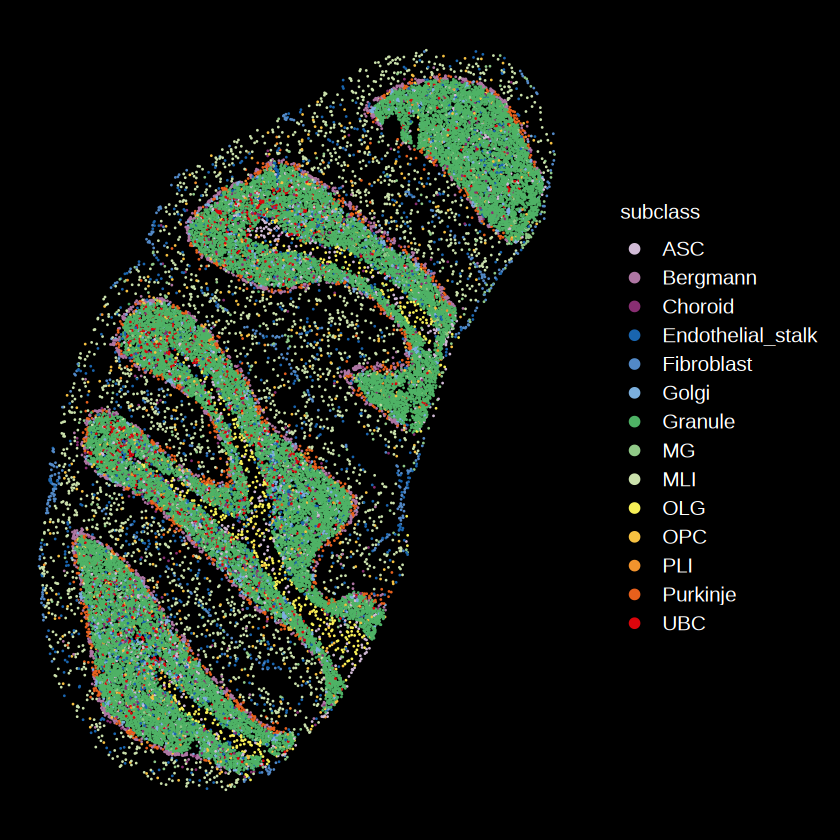

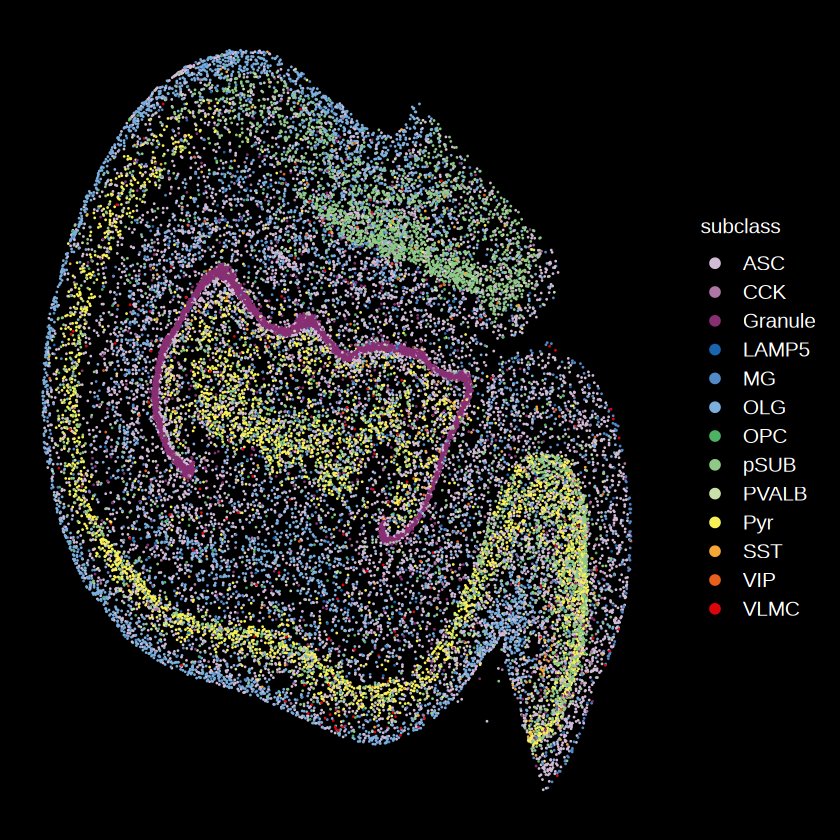

In [18]:
#unique(cell.cb$celltype_new)
cellanuq.cb = fsraw.t42[fsraw.t42$subcortical %in% c("Cerebellum"),] %>% group_by(cell_label,subclass,class) %>% 
            summarise(x = mean(x),y = mean(y))
#head(cellanuq)
pan1 = ggplot(cellanuq.cb[!is.na(cellanuq.cb$subclass),], aes(x = x, y = y, color = subclass)) +
  geom_point(size = 0.5, stroke = 0) +
  theme_presentation() +
  scale_color_discreterainbow() +
  #facet_wrap(~subcortical,scales = "free") +
  scale_x_reverse() +
  scale_y_reverse() +
  guides(color = guide_legend(override.aes = list(size = 3)))
pan1

#unique(cell.cb$celltype_new)
cellanuq.hp = fsraw.t47[fsraw.t47$subcortical %in% c("Hippocampus"),] %>% group_by(cell_label,subclass,class) %>% 
                summarise(x = mean(x),y = mean(y))
#head(cellanuq)
pan2 = ggplot(cellanuq.hp[!is.na(cellanuq.hp$subclass),], aes(x = x, y = y, color = subclass)) +
  geom_point(size = 0.5, stroke = 0) +
  theme_presentation() +
  scale_color_discreterainbow() +
  #facet_wrap(~subcortical,scales = "free") +
  scale_x_reverse() +
  scale_y_reverse() +
  guides(color = guide_legend(override.aes = list(size = 3)))
pan2

In [19]:
ggexport(pan1,filename = "result/figure_revision/T42_cb_cross_region_cellan_spatial_26_01_06.pdf",width = 4.5,height = 3.5)
ggexport(pan2,filename = "result/figure_revision/T47_hp_cross_region_cellan_spatial_26_01_06.pdf",width = 4.5,height = 3.5)


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
file saved to result/figure_revision/T42_cb_cross_region_cellan_spatial_26_01_06.pdf

Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
file saved to result/figure_revision/T47_hp_cross_region_cellan_spatial_26_01_06.pdf



### Cross region replicates correlation

In [220]:
# fsraw.cor.sub = qread(file = "data/cross_region/total_annotation_delete_multiread_cross_region_25_10_22.qs")
# table(fsraw.cor.sub$class)
fsraw.cor.sub2 = fsraw.cor.sub[fsraw.cor.sub$class == "Glu",]
fsraw.cor.sub2$class = "GLU"
fsraw.cor.sub = rbind(fsraw.cor.sub[fsraw.cor.sub$class != "Glu",],fsraw.cor.sub2)
table(fsraw.cor.sub$class)


     GABA       GLU NonNeuron 
   736430  10926176    981767 

In [222]:
#T44
fsraw.sub = fsraw.cor.sub
fsraw.sub = fsraw.sub[fsraw.sub$subclass != "",]
fsraw.sub = fsraw.sub[!is.na(fsraw.sub$subclass),]
fsraw.sub$areatr = paste0(fsraw.sub$subcortical,"-",
                              fsraw.sub$class,"-",
                              fsraw.sub$subclass)
fsraw.sub$areatr = fsraw.sub$subclass
transt.hp.t44 = FullLengthTranSt(fsraw.sub[fsraw.sub$subcortical == "Hippocampus",])
transt.cb.t44 = FullLengthTranSt(fsraw.sub[fsraw.sub$subcortical == "Cerebellum",])
isosig.hp.t44 = CalSigIsoform(transt.hp.t44)
isosig.cb.t44 = CalSigIsoform(transt.cb.t44)

#T42
fsraw.sub = fsraw.t42[fsraw.t42$subcortical %in% c("Cerebellum"),]
fsraw.sub = fsraw.sub[fsraw.sub$subclass != "",]
fsraw.sub = fsraw.sub[!is.na(fsraw.sub$subclass),]
fsraw.sub$areatr = paste0(fsraw.sub$subcortical,"-",
                              fsraw.sub$class,"-",
                              fsraw.sub$subclass)
fsraw.sub$areatr = fsraw.sub$subclass
transt.cb.t42 = FullLengthTranSt(fsraw.sub[fsraw.sub$subcortical == "Cerebellum",])
isosig.cb.t42 = CalSigIsoform(transt.cb.t42)

#T47
fsraw.sub = fsraw.t47[fsraw.t47$subcortical %in% c("Hippocampus"),]
fsraw.sub = fsraw.sub[fsraw.sub$subclass != "",]
fsraw.sub = fsraw.sub[!is.na(fsraw.sub$subclass),]
fsraw.sub$areatr = paste0(fsraw.sub$subcortical,"-",
                              fsraw.sub$class,"-",
                              fsraw.sub$subclass)
fsraw.sub$areatr = fsraw.sub$subclass
transt.hp.t47 = FullLengthTranSt(fsraw.sub[fsraw.sub$subcortical == "Hippocampus",])
isosig.hp.t47 = CalSigIsoform(transt.hp.t47)
head(isosig.hp.t47)

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
Warning message:
"There were 2857 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "AACS"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 2856 remaining warnings."
Warning message:
"There were 3388 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "AAAS"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 3387 remaining warnings."
`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.g

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
1,AAMDC,NM_001283690.1,ASC,4,5,0.8,0.9142857,0.9333333,-0.1333333,N,0.497716,0.6720751
2,AAMDC,NM_001283690.1,Granule,2,2,1.0,0.9142857,0.9000000,0.1000000,N,0.497716,0.6720751
3,AAMDC,NM_001283690.1,MG,2,2,1.0,0.9142857,0.9000000,0.1000000,N,0.497716,0.6720751
4,AAMDC,NM_001283690.1,OLG,3,3,1.0,0.9142857,0.9000000,0.1000000,N,0.497716,0.6720751
5,AAMDC,NM_001283690.1,OPC,1,1,1.0,0.9142857,0.9000000,0.1000000,N,0.497716,0.6720751
6,AAMDC,NM_001283690.1,PVALB,5,5,1.0,0.9142857,0.9000000,0.1000000,N,0.497716,0.6720751


In [226]:
isosig.cb.t42

gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
AAMDC,NM_001283690.1,ASC,2,2,1.0000000,0.9292763,0.9191729,0.08082707,N,0.734367834,0.75448750
AAMDC,NM_001283690.1,Choroid,2,2,1.0000000,0.9292763,0.9191729,0.08082707,N,0.734367834,0.75448750
AAMDC,NM_001283690.1,Endothelial_stalk,4,4,1.0000000,0.9292763,0.9191729,0.08082707,N,0.734367834,0.75448750
AAMDC,NM_001283690.1,Granule,26,38,0.6842105,0.9292763,0.9642857,-0.28007519,N,0.734367834,0.75448750
AAMDC,NM_001283690.1,MLI,6,6,1.0000000,0.9292763,0.9191729,0.08082707,N,0.734367834,0.75448750
AAMDC,NM_001283690.1,OLG,2,2,1.0000000,0.9292763,0.9191729,0.08082707,N,0.734367834,0.75448750
AAMDC,NM_001283690.1,Purkinje,6,8,0.7500000,0.9292763,0.9548872,-0.20488722,N,0.734367834,0.75448750
AAMDC,NM_001283690.1,UBC,2,2,1.0000000,0.9292763,0.9191729,0.08082707,N,0.734367834,0.75448750
AAMDC,XM_005579175.2,Granule,6,38,0.1578947,0.2039474,0.2500000,-0.09210526,N,0.734367834,0.75448750


In [225]:
isosigi1 = isosig.cb.t44
isosigi2 = isosig.cb.t42
jcdf1 = DTUCormx(isosigi1,isosigi2,20)
jcdf1

Var1,Var2,value,nt
<chr>,<chr>,<dbl>,<int>
Endothelial_stalk,Granule,0.12236186,88
Granule,Granule,0.22149381,247
MLI,Granule,-0.09337573,88
Bergmann,Granule,-0.26413165,63
Purkinje,Granule,-0.07923302,101
UBC,Granule,0.10707581,78


file saved to result/figure_revision/relicates_DTU_compare_subcortical_celltype_25_12_16.pdf



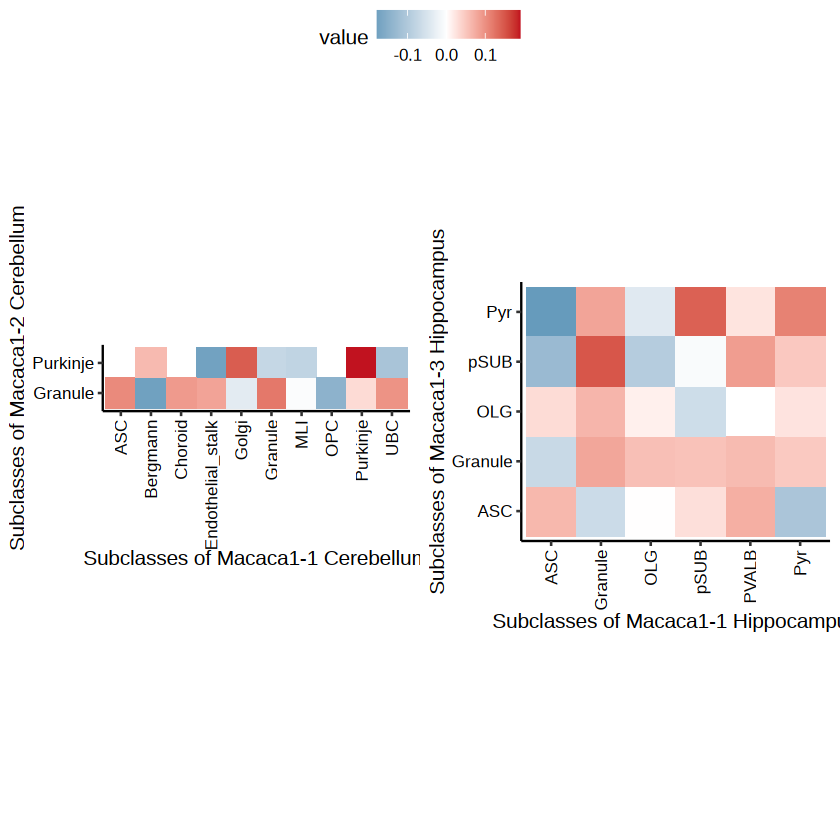

In [229]:
isosigi1 = isosig.cb.t44
isosigi2 = isosig.cb.t42
jcdf1 = DTUCormx(isosigi1,isosigi2,10)

p1.1 = ggplot(jcdf1,aes(x = Var1,y = Var2, fill = value)) + 
    geom_tile() + 
    scale_fill_gradient2(low = "#669bbc",high = "#c1121f",mid = "white") + theme_pubr() + coord_fixed(ratio = 1) +
    theme(
    axis.text.x = element_text(
      size = 10,
      angle = 90,vjust = 0.5,
      hjust = 1
    ),
    axis.text.y = element_text(
      size = 10
    ),
    legend.position = "right", 
    panel.grid.minor = element_blank(),
    panel.background = element_blank(),
    plot.background = element_rect(fill = "white", color = NA)
  ) + xlab("Subclasses of Macaca1-1 Cerebellum")  + ylab("Subclasses of Macaca1-2 Cerebellum")

isosigi1 = isosig.hp.t44
isosigi2 = isosig.hp.t47
jcdf2 = DTUCormx(isosigi1,isosigi2,10)
p1.2 = ggplot(jcdf2,aes(x = Var1,y = Var2, fill = value)) + 
    geom_tile() + 
    scale_fill_gradient2(low = "#669bbc",high = "#c1121f",mid = "white") + theme_pubr() + coord_fixed(ratio = 1) +
    theme(
    axis.text.x = element_text(
      size = 10,
      angle = 90,vjust = 0.5,
      hjust = 1
    ),
    axis.text.y = element_text(
      size = 10
    ),
    legend.position = "right", 
    panel.grid.minor = element_blank(),
    panel.background = element_blank(),
    plot.background = element_rect(fill = "white", color = NA)
  ) + xlab("Subclasses of Macaca1-1 Hippocampus")  + ylab("Subclasses of Macaca1-3 Hippocampus")

p1t = ggarrange(p1.1,p1.2,nrow = 1,common.legend = T)
p1t
ggexport(p1t,filename = "result/figure_revision/relicates_DTU_compare_subcortical_celltype_25_12_16.pdf",width = 6,height = 3)

file saved to result/figure_revision/relicates_DTU_compare_subcortical_25_12_16.pdf



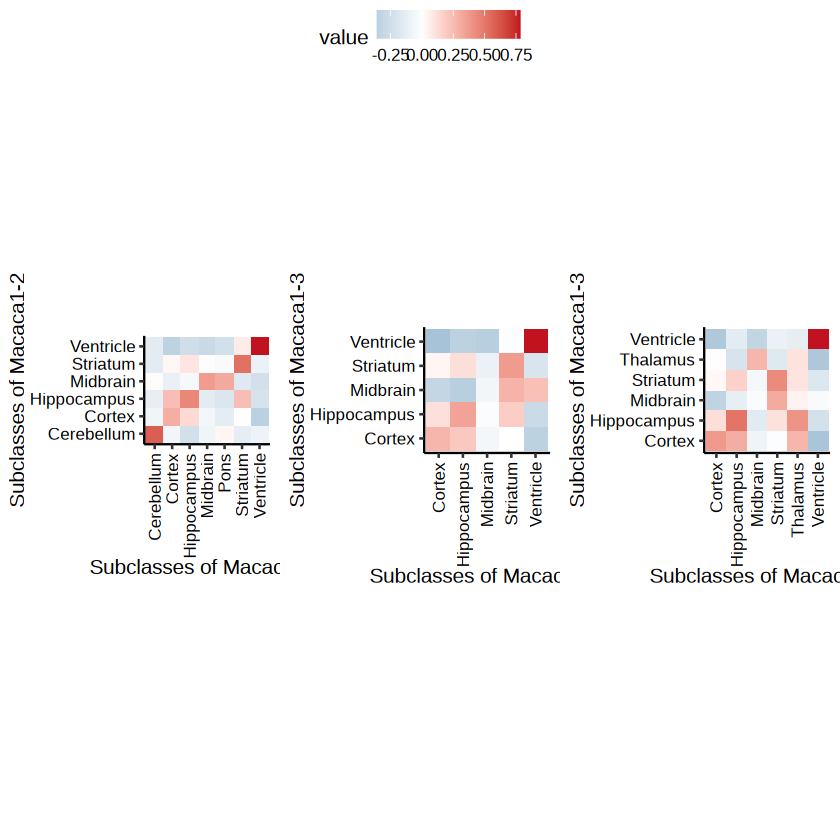

In [212]:
isosigi1 = isosigls.t44$subcortical
isosigi2 = isosigls.t42$subcortical
jcdf1 = DTUCormx(isosigi1,isosigi2,50)

p1.1 = ggplot(jcdf1,aes(x = Var1,y = Var2, fill = value)) + 
    geom_tile() + 
    scale_fill_gradient2(low = "#669bbc",high = "#c1121f",mid = "white") + theme_pubr() + coord_fixed(ratio = 1) +
    theme(
    axis.text.x = element_text(
      size = 10,
      angle = 90,vjust = 0.5,
      hjust = 1
    ),
    axis.text.y = element_text(
      size = 10
    ),
    legend.position = "right", 
    panel.grid.minor = element_blank(),
    panel.background = element_blank(),
    plot.background = element_rect(fill = "white", color = NA)
  ) + xlab("Subclasses of Macaca1-1")  + ylab("Subclasses of Macaca1-2")

isosigi1 = isosigls.t44$subcortical
isosigi2 = isosigls.t47$subcortical
jcdf2 = DTUCormx(isosigi1,isosigi2,50)
p1.2 = ggplot(jcdf2,aes(x = Var1,y = Var2, fill = value)) + 
    geom_tile() + 
    scale_fill_gradient2(low = "#669bbc",high = "#c1121f",mid = "white") + theme_pubr() + coord_fixed(ratio = 1) +
    theme(
    axis.text.x = element_text(
      size = 10,
      angle = 90,vjust = 0.5,
      hjust = 1
    ),
    axis.text.y = element_text(
      size = 10
    ),
    legend.position = "right", 
    panel.grid.minor = element_blank(),
    panel.background = element_blank(),
    plot.background = element_rect(fill = "white", color = NA)
  ) + xlab("Subclasses of Macaca1-1")  + ylab("Subclasses of Macaca1-3")

isosigi1 = isosigls.t42$subcortical
isosigi2 = isosigls.t47$subcortical
jcdf3 = DTUCormx(isosigi1,isosigi2,50)

p1.3 = ggplot(jcdf3,aes(x = Var1,y = Var2, fill = value)) + 
    geom_tile() + 
    scale_fill_gradient2(low = "#669bbc",high = "#c1121f",mid = "white") + theme_pubr() + coord_fixed(ratio = 1) +
    theme(
    axis.text.x = element_text(
      size = 10,
      angle = 90,vjust = 0.5,
      hjust = 1
    ),
    axis.text.y = element_text(
      size = 10
    ),
    legend.position = "right", 
    panel.grid.minor = element_blank(),
    panel.background = element_blank(),
    plot.background = element_rect(fill = "white", color = NA)
  ) + xlab("Subclasses of Macaca1-2")  + ylab("Subclasses of Macaca1-3")
p1t = ggarrange(p1.1,p1.2,p1.3,nrow = 1,common.legend = T)
p1t
ggexport(p1t,filename = "result/figure_revision/relicates_DTU_compare_subcortical_25_12_16.pdf",width = 9,height = 3)

#### Cross region case

In [230]:
#head(subcoran)
# pref = qread("../ref/area_figure_an.qs")
# subcoran = unique(fsraw.cor[,c("region","subcortical")])
# edgesdf = pref$areaedges
# edgesdf[edgesdf$areaid == "1/2",]$areaid = "1|2"
# edgesdf = merge(edgesdf,subcoran,by.x = "areaid",by.y = "region")
# mycolor = distinctColorPalette(length(unique(edgesdf$subcortical)))
# names(mycolor) = unique(edgesdf$subcortical)


#head(edgesdf)
#backpt = qread("longread_cell_isoform_")
SpCasePlot = function(fsraw.cor,geneex,hubtrans,edgesdf,ptsize = 1,mycolor,downsample = 0){
    mkdf = fsraw.cor[fsraw.cor$gene_id == geneex,]
    if(downsample != 0){
        mkdf = mkdf[sample(1:nrow(mkdf),size = as.integer(downsample*nrow(mkdf)),replace = F),]
    }
    # mkdf$transtype = MySplit(mkdf$transcript_id,"-",1)
    # mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$transcript_id = 
    # paste0(mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$gene_id,"-",
    #        mkdf[mkdf$transtype != MySplit(mkdf$gene_id,"-",1),]$transcript_id)
    hubtrans = hubtrans[hubtrans %in% mkdf$transcript_id]
    mkdf = mkdf[mkdf$transcript_id %in% hubtrans,]
    # mkdf.st = mkdf %>% group_by(transcript_id) %>% summarise(count = length(readid))
    # mkdf.st = mkdf.st[order(mkdf.st$count),]
    # transorder = unique(mkdf.st$transcript_id)
    mkdf$transcript_id = factor(mkdf$transcript_id,levels = hubtrans)
    mkdf = mkdf[order(-as.numeric(mkdf$transcript_id)),]
    #mkdf = mkdf[order(mkdf$transcript_id),]
    #edgesdf.zoom = edgesdf[,]
    pmkpti1 = ggplot() +
        geom_segment(data = edgesdf, 
                   aes(x = x1, y = y1, xend = x2, yend = y2,color = subcortical),
                   size = 0.2,alpha = 1) +
      geom_point(data = mkdf,
                 aes(x,y,fill = transcript_id),size = ptsize,stroke = NA,shape = 21) + 
      # geom_segment(data = edgesdf, aes(x = x1, y = y1, xend = x2, yend = y2,color = areatr),
      #            size = 0.5,alpha = 0.75) + 
     # scale_size(range = c(0.05,0.1)) +
      #facet_wrap(~layer,nrow = 2) 

      theme_void() +
      #scale_fill_discreterainbow() +
      scale_color_flatui() +
      scale_fill_manual(values = mycolor) +
      #scale_color_manual(values = mycolor) +
      #scale_color_flatui() +
      theme_presentation() + 
      theme(legend.position = "top",legend.title = element_blank(),
            legend.text = element_text(size = 8)) +
      guides(color = "none",
            fill = guide_legend(override.aes = list(size=6),nrow = 2),size = 7) +
      scale_y_reverse() + scale_x_reverse()
    return(pmkpti1)
}

SpCasePlot = function(fsraw.cor, geneex, hubtrans, edgesdf, ptsize = 1, mycolor, downsample = 0) {
    # 处理数据
    mkdf = fsraw.cor[fsraw.cor$gene_id == geneex, ]
    if (downsample != 0) {
        mkdf = mkdf[sample(1:nrow(mkdf),size = as.integer(downsample*nrow(mkdf)),replace = F),]
    }
    hubtrans = hubtrans[hubtrans %in% mkdf$transcript_id]
    mkdf = mkdf[mkdf$transcript_id %in% hubtrans, ]
    mkdf$transcript_id = factor(mkdf$transcript_id, levels = hubtrans)
    mkdf = mkdf[order(-as.numeric(mkdf$transcript_id)), ]
    
    # 计算isoform比例用于饼图
    isoform_counts <- table(mkdf$transcript_id)
    isoform_prop <- prop.table(isoform_counts)
    pie_data <- data.frame(
        transcript_id = names(isoform_prop),
        proportion = as.numeric(isoform_prop),
        stringsAsFactors = FALSE
    )
    
    # 创建饼图
    pie_plot <- ggplot(pie_data, aes(x = "", y = proportion, fill = transcript_id)) +
        geom_bar(width = 1, stat = "identity", color = "white") +
        coord_polar("y", start = 0) +
        scale_fill_manual(values = mycolor[2:1]) +
        theme_void() +
        theme(legend.position = "none")
    
    # 创建主图
    pmkpti1 <- ggplot() +
        geom_segment(data = edgesdf, 
                     aes(x = x1, y = y1, xend = x2, yend = y2, color = subcortical),
                     size = 0.2, alpha = 1) +
        geom_point(data = mkdf,
                   aes(x, y, fill = transcript_id), size = ptsize, stroke = NA, shape = 21) + 
        theme_void() +
        scale_color_flatui() +
        scale_fill_manual(values = mycolor) +
        theme_presentation() + 
        theme(legend.position = "top", legend.title = element_blank(),
              legend.text = element_text(size = 8)) +
        guides(color = "none",
              fill = guide_legend(override.aes = list(size = 6), nrow = 2), size = 7) +
        scale_y_reverse() + 
        scale_x_reverse()
    
    # 在右上角添加饼图
    pmkpti1 <- pmkpti1 + 
        annotation_custom(
            ggplotGrob(pie_plot),
            xmin = max(mkdf$x, na.rm = TRUE) - diff(range(mkdf$x, na.rm = TRUE)) * 0.3,
            xmax = max(mkdf$x, na.rm = TRUE) + diff(range(mkdf$x, na.rm = TRUE)) * 0.1,
            ymin = min(mkdf$y, na.rm = TRUE) - diff(range(mkdf$y, na.rm = TRUE)) * 0.3,
            ymax = min(mkdf$y, na.rm = TRUE) + diff(range(mkdf$y, na.rm = TRUE)) * 0.1
        )
    
    return(pmkpti1)
}

In [231]:
areaedges.t47 = qread(file = paste0("ref/areaedge_density_T47_12_02.qs"))
areaedges.t42 = qread(file = paste0("ref/areaedge_density_T42_12_02.qs"))
edgesdf.t47 = areaedges.t47
suban = unique(fsraw.t47[sample(1:nrow(fsraw.t47),10000),c("region","subcortical")])
edgesdf.t47 = merge(edgesdf.t47,suban,by.x = "areaid",by.y = "region")

edgesdf.t42 = areaedges.t42
suban = unique(fsraw.t42[sample(1:nrow(fsraw.t42),10000),c("region","subcortical")])
edgesdf.t42 = merge(edgesdf.t42,suban,by.x = "areaid",by.y = "region")
head(edgesdf.t42)

,ind1,ind2,x1,y1,x2,y2,mx1,my1,mx2,my2,bp1,bp2,areaid
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,49868,4534,44481,52614,44486,52552,45046.11,52628.37,44498.80,52584.23,0,0,IPa
2,49868,31959,44481,52614,44483,52678,44510.17,52645.12,45046.11,52628.37,0,0,IPa
3,72829,4534,44490,52506,44486,52552,44491.75,52529.33,45851.22,52647.54,0,0,IPa
4,55551,72829,44490,52485,44490,52506,44534.50,52495.50,44727.50,52495.50,0,0,IPa
5,47032,23675,44474,52843,44478,52754,44674.25,52807.41,44613.10,52804.66,0,0,IPa
6,10567,40670,44475,52887,44473,52918,44463.83,52901.84,49924.40,53254.14,0,0,IPa


,areaid,ind1,ind2,x1,y1,x2,y2,mx1,my1,mx2,my2,bp1,bp2,subcortical
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,1/2,528351,294999,9934,33790,9975,33787,9951.227,33743.77,9847.967,32332.55,0,0,Cortex
2,1/2,295627,296264,10061,33787,10171,33786,10114.986,33674.95,10113.879,33553.16,0,0,Cortex
3,1/2,293573,293587,9814,33805,9815,33805,9814.500,33809.00,9814.500,33422.33,0,0,Cortex
4,1/2,521226,283544,8668,33706,8624,33657,8798.255,33544.78,8676.158,33654.42,0,0,Cortex
5,1/2,292436,527158,9689,33815,9726,33815,9707.500,33804.95,9707.500,33469.50,0,0,Cortex
6,1/2,520410,520246,8544,33355,8524,33281,9217.421,33133.29,8596.770,33301.04,0,0,Cortex


Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message:
"Removed 11403 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message:
"Removed 11403 rows containing missing values or values outside the scale range
(`geom_segment()`)."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined in the element hierarchy."
Warning message in plot_theme(plot):
"The `panel.margin` theme element is not defined 

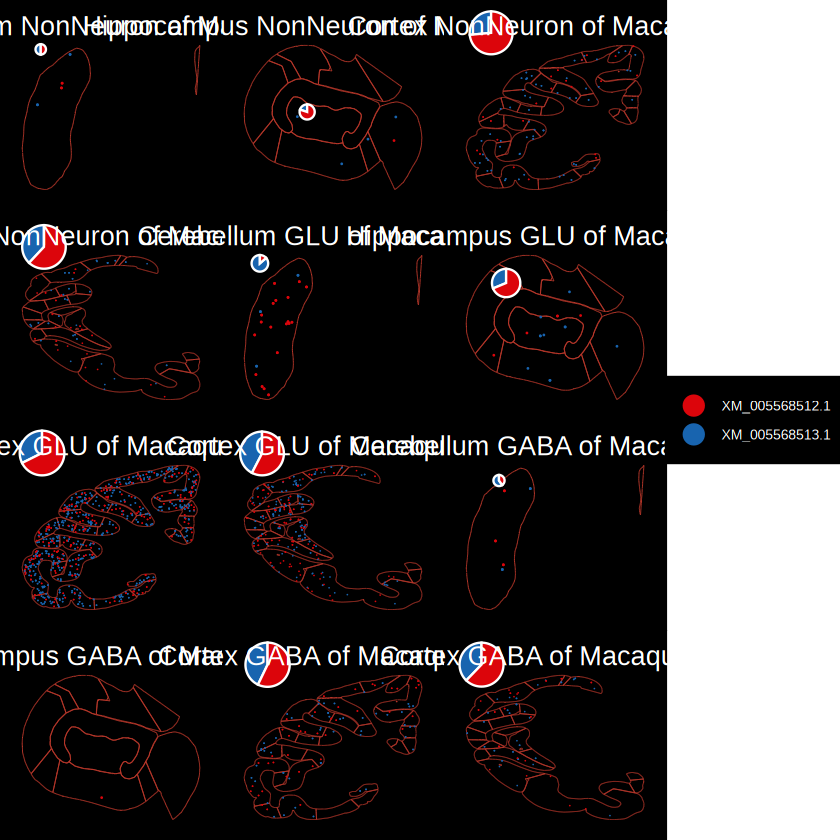

In [241]:
# fsraw.cor.case = fsraw.t42[fsraw.t42$subcortical == "Cerebellum",]
# edgesdf.zoom = edgesdf.t42[edgesdf.t42$subcortical == "Cerebellum",]
# fsraw.cor.case2 = fsraw.t47[fsraw.t47$subcortical == "Hippocampus",]
# edgesdf.zoom2 = edgesdf.t47[edgesdf.t47$subcortical == "Hippocampus",]
# fsraw.cor.case3 = fsraw.t42[fsraw.t42$subcortical == "Cortex",]
# edgesdf.zoom3 = edgesdf.t42[edgesdf.t42$subcortical == "Cortex",]
# fsraw.cor.case4 = fsraw.t47[fsraw.t47$subcortical == "Cortex",]
# edgesdf.zoom4 = edgesdf.t47[edgesdf.t47$subcortical == "Cortex",]
CaseTotalPlot = function(geneex,hubtrans){
    pci.zoom1.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "NonNeuron",],
                       geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum NonNeuron of Macaque1-2")
    pci.zoom1.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "NonNeuron",],
                           geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus NonNeuron of Macaque1-3")
    pci.zoom1.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "NonNeuron",],
                           geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex NonNeuron of Macaque1-2")
    pci.zoom1.4 = SpCasePlot(fsraw.cor.case4[fsraw.cor.case4$class == "NonNeuron",],
                           geneex,hubtrans,edgesdf.zoom4,ptsize = 0.2,mycolor) + ggtitle("Cortex NonNeuron of Macaque1-3")
    
    pci.zoom2.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GLU",],
                           geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GLU of Macaque1-2")
    pci.zoom2.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GLU",],
                           geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GLU of Macaque1-3")
    pci.zoom2.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GLU",],
                           geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GLU of Macaque1-2")
    pci.zoom2.4 = SpCasePlot(fsraw.cor.case4[fsraw.cor.case4$class == "GLU",],
                           geneex,hubtrans,edgesdf.zoom4,ptsize = 0.2,mycolor) + ggtitle("Cortex GLU of Macaque1-3")
    
    pci.zoom3.1 = SpCasePlot(fsraw.cor.case[fsraw.cor.case$class == "GABA",],
                           geneex,hubtrans,edgesdf.zoom,ptsize = 0.5,mycolor) + ggtitle("Cerebellum GABA of Macaque1-2")
    pci.zoom3.2 = SpCasePlot(fsraw.cor.case2[fsraw.cor.case2$class == "GABA",],
                           geneex,hubtrans,edgesdf.zoom2,ptsize = 0.5,mycolor) + ggtitle("Hippocampus GABA of Macaque1-2")
    pci.zoom3.3 = SpCasePlot(fsraw.cor.case3[fsraw.cor.case3$class == "GABA",],
                           geneex,hubtrans,edgesdf.zoom3,ptsize = 0.2,mycolor) + ggtitle("Cortex GABA of Macaque1-2")
    pci.zoom3.4 = SpCasePlot(fsraw.cor.case4[fsraw.cor.case4$class == "GABA",],
                           geneex,hubtrans,edgesdf.zoom4,ptsize = 0.2,mycolor) + ggtitle("Cortex GABA of Macaque1-3")
    
    pci.zoom = ggarrange(pci.zoom1.1,pci.zoom1.2,pci.zoom1.3,pci.zoom1.4,
                         pci.zoom2.1,pci.zoom2.2,pci.zoom2.3,pci.zoom2.4,
                         pci.zoom3.1,pci.zoom3.2,pci.zoom3.3,pci.zoom3.4,
                         ncol = 4,nrow = 3,
                         common.legend = TRUE,legend = "right")
    return(pci.zoom)
}
geneex = "IDH3B"
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("XM_005568512.1","XM_005568513.1")
pci.zoom = CaseTotalPlot(geneex,hubtrans)
pci.zoom
# ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_20.pdf"),
#         width = 9/2,height = 8/2)


In [ ]:
ggexport(pci.zoom,filename = paste0("result/figure_revision/cross_region_shift_DTU_case_",geneex,"_25_11_20.pdf"),
        width = 6,height = 4)

In [ ]:
geneex = "NTRK2"
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("XM_005582051.2","XM_005582047.2")
pci.zoom = CaseTotalPlot(geneex,hubtrans)
pci.zoom

In [414]:
FullLengthTranSt = function(fs.info,threld){
      transt = fs.info %>% group_by(gene_id, areatr) %>% 
        mutate(genecount = length(unique(readid))) %>% 
        group_by(gene_id,transcript_id,areatr) %>% 
        summarise(count = length(unique(readid)),
                  genecount = unique(genecount))
      transt = transt[transt$areatr != "" &
                          !is.na(transt$areatr),]

        transt$relative = transt$count/transt$genecount
        #transtf = transt[transt$count > 5,]
        transtf = transt[transt$genecount > threld,]
        transtf = transtf %>% group_by(transcript_id) %>% 
          mutate(meanrelative = mean(relative),
                 otherrelative = (sum(relative) - relative)/(n() - 1))
        transtf = transtf[which(transtf$meanrelative > 0.05),]
    
        arean = length(unique(transtf$areatr))
    
        #areanth = arean*(1/3)
       # print(areanth)
        transtf = transtf %>% group_by(transcript_id) %>% 
           filter(length(unique(areatr)) > 1)
        transtf = transtf %>% group_by(gene_id) %>% 
          filter(length(unique(transcript_id))>1)
        
        # transtf$lfc = log2(transtf$relative/transtf$meanrelative)
        transtf$dr = transtf$relative - transtf$otherrelative
      return(transtf)
}


In [238]:
fsraw.t42$areatr = paste0(fsraw.t42$subcortical,"-",fsraw.t42$class,"-",fsraw.t42$subclass)
transt.cl.t42 = FullLengthTranSt(fsraw.t42[fsraw.t42$subclass != "" & !is.na(fsraw.t42$subclass),],20)
fsraw.t47$areatr = paste0(fsraw.t47$subcortical,"-",fsraw.t47$class,"-",fsraw.t47$subclass)
transt.cl.t47 = FullLengthTranSt(fsraw.t47[fsraw.t47$subcortical %in% c("Cortex","Hippocampus") & fsraw.t47$subclass != "" & 
                                           !is.na(fsraw.t47$subclass),],20)
transt.cl.t47 = FullLengthTranSt(fsraw.t47[fsraw.t47$subcortical %in% c("Cortex","Hippocampus") & fsraw.t47$subclass != "" & 
                                           !is.na(fsraw.t47$subclass),],20)

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.


file saved to result/figure_revision/T47_case_subcortical_subclass_isoform_rate_stat_pie_25_12_23.pdf



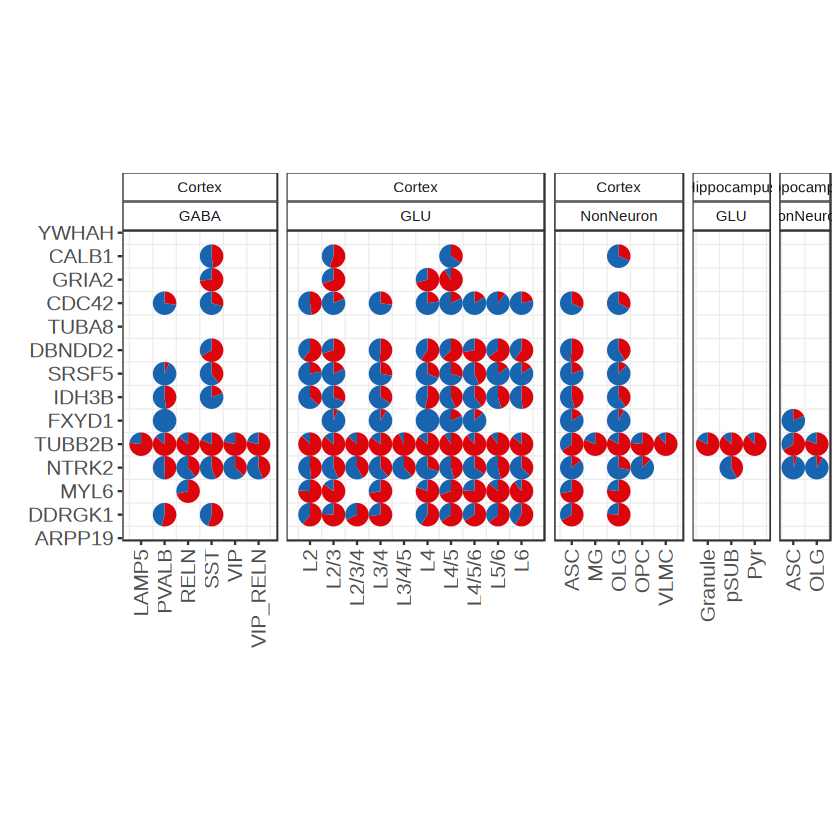

In [239]:

#case plot
#hubgene = c("ARPP19","DDRGK1","FXYD1","IDH3B","MYL6","TSTD1","PDHA1","RPS27","NKX6-2")

#hubgene = c("ARPP19","DDRGK1","FXYD1","IDH3B","MYL6","SYNGR1","PDHA1","RPS27","NKX6-2","PPP3CB","SLC8A1","RPL7A")
hubgene = c("ARPP19","DDRGK1","MYL6","NTRK2","TUBB2B","FXYD1",
            "IDH3B","SRSF5","DBNDD2","TUBA8","CDC42","GRIA2","CALB1","YWHAH","C7H14orf132")
#NPFF ZNF71
mycolor =  c('#DC050B','#1864AF','#F7EF55')
hubtrans = c("NM_001283415.1","XM_015452432.1",
             "XM_005569136.2","XM_015429879.1","XM_015454192.1","XM_015454193.1",
             "XR_001487780.1","XM_005594227.2",
             "XM_015454768.1","NM_001284560.1","NM_001284100.1","XM_015456947.1",
             "TUBA8-FS-1","NM_001283804.1","NM_001283401.1","CDC42-FS-1",
             "XM_005556162.2","XM_005556163.2",
             "DDRGK1-FS-1","XM_005568473.2",
             "XM_005545496.2","XM_005545480.2","XM_015444956.1",
             "XM_005588819.1","XM_005588818.2",
             "TUBB2B-FS-1","NM_001283898.1",
             "XM_005568512.1","XM_005568513.1",
             "XM_005544192.2","XM_005544198.2",
             "MYL6-FS-2","MYL6-FS-1",
             "XM_005541224.2","XM_005541226.2",
             "GPX4-FS-2","XM_005587358.2",
             "NKX6-2-FS-1","NKX6-2-FS-3",
             "PDHA1-FS-1","XM_005593119.2",
             "XM_005541720.2","RPS27-FS-1",
            "XM_005567237.2","XM_005567239.2",
            "XM_015455847.1","XM_015455855.1",
            "XM_005576034.2","XM_005576035.2",
            "NM_001284957.1","RPL7A-FS-1",
            "XM_005561612.2","SRSF5-FS-1","XM_005582047.2","XM_005582051.2")
#caseg = colnames(isosigimx)
isosigi2 = transt.cl.t47
#isosigi2 = isosigi2[isosigi2$meanrelative > 0.1,]
casecti = isosigi2[isosigi2$gene_id %in% hubgene & isosigi2$transcript_id %in% hubtrans,]
casecti$transcript_id = factor(casecti$transcript_id,levels = hubtrans)
casecti = casecti[order(casecti$gene_id,casecti$transcript_id),]
casecti = casecti %>% group_by(gene_id) %>% 
    mutate(id = as.character(as.numeric(factor(transcript_id,levels = unique(transcript_id)))))

casecti$gene_tran = paste0(casecti$gene_id,"-",casecti$id)
library(scatterpie)
casectl = dcast(casecti,areatr+gene_id~id,value.var = "relative",fun.aggregate = sum)
casectl[is.na(casectl)] = 0
casectl = casectl[order(casectl$areatr),]
casectl$groupid = as.numeric(factor(casectl$areatr,levels = unique(casectl$areatr)))
casectl$geneidn = as.numeric(factor(casectl$gene_id,levels = hubgene))


library(patchwork)
ison = casecti %>% group_by(gene_id) %>% summarise(transn = length(unique(transcript_id)))
ison = max(ison$transn)
casectl$sig = 'N'
#caseg = c("INTU",'DNAJC7',"TUSC3","GRIP1","CACNB4","FAM173A","KLC1","MPG","MTG2","EIF5A","ARID4A","SIVA1","IDH3B")
#caseg = c("MYL6",'NTRK2',"DBNDD2","DDRGK1","ARPP19","ARPP21")
#casectl[paste0(casectl$gene_id,"-",casectl$areatr) %in% highlight,]$sig = "Y"
casectl$gene_id = factor(casectl$gene_id,levels = hubgene)
casectl$subcortical = MySplit(casectl$areatr,"-",1)
casectl$class = MySplit(casectl$areatr,"-",2)
casectl$subclass = MySplit(casectl$areatr,"-",3)

plt = ggplot() + 
      geom_scatterpie(data = casectl,
                      aes(x = groupid, y = geneidn, group = groupid, r = 0.5),
                      cols= colnames(casectl)[3:(3+ison-1)],color=NA) + 
      coord_fixed() +
      facet_grid(~ subcortical+class,space = "free",scale = "free") + 
      scale_x_continuous(breaks = c(1:length(unique(casectl$areatr))),labels = casectl$subclass[!duplicated(casectl$areatr)]) +
      scale_y_continuous(breaks = c(1:length(hubgene)),labels = hubgene) +
      scale_color_manual(values = c("white","black")) +
      # geom_smooth(data = tem2, aes(x=x, y=y), se = F, method = 'loess',color = "black") +
      scale_fill_manual(values = mycolor) +
      #annotate("text", x = 8, y = 7, label = caseg[i], hjust = 1.1, vjust = 1.1, size = 5, angle = 90) +
      ylab("") + xlab("") +
      theme_bw() + theme(legend.position="none",axis.text = element_text(size = 12),panel.grid.major = element_blank(),
                         axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1),
                        strip.background =element_rect(fill="white"))
plt
ggexport(plt,filename = "result/figure_revision/T47_case_subcortical_subclass_isoform_rate_stat_pie_25_12_23.pdf",width = 8,height = 6)

## Calculate Disease score

In [246]:
suborder = c('L2','L2/3','L2/3/4','L3/4','L3/4/5','L4','L4/5','L4/5/6','L5/6','L6','LAMP5','RELN',
             'VIP_RELN','VIP','PV_CHC',"PVALB",'SST','ASC','OPC','OLG','MG','EC','VLMC')
regionorder = c("29","30","23a","23b","31","23c","1|2","PE","PEa","VIP","LIPv","LIPd","PG","7op","CM","AI","CL","CPB","TPO",
               "PGa","FST","V4t","V4","TEO","TEpd","TEpv","TFO","V3v","V2","v23b")
lobeorder = c('cingulate','somatosensory','parietal','auditory','temporal','occipital')
layerorder = c("l1","l2","l3","l4","l5","l6")
subcororder = c('Cerebellum','Cortex','Hippocampus','Midbrain','Pons','Striatum','Ventricle')

file saved to result/figure6_snp_analysis/T42_cross_species_case_subclass_stat_25_12_22.pdf



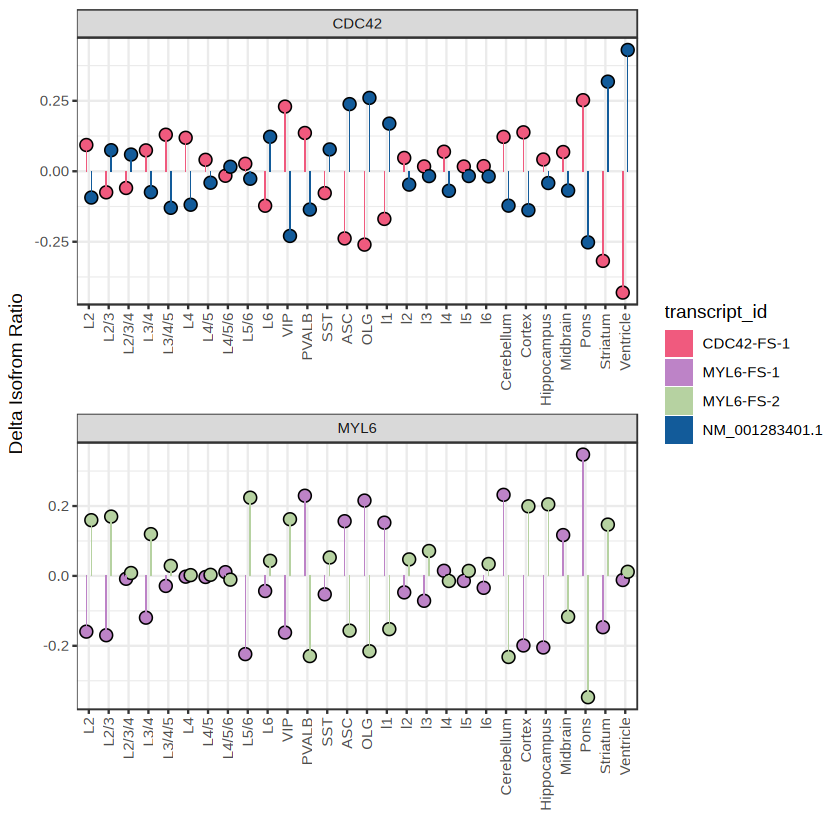

In [253]:
isosigls = isosigls.t42
mycolors = c("#B6D2A1","#BD83C7","#F05A7E","#125B9A")
names(mycolors) = c("MYL6-FS-2","MYL6-FS-1", "CDC42-FS-1", "NM_001283401.1")
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$transcript_id %in% c("MYL6-FS-1","MYL6-FS-2", "CDC42-FS-1", "NM_001283401.1"),]
isosigi = isosigi %>% group_by(areatr) %>% filter(length(unique(transcript_id)) == 4)
isosigi$group = "subclass"

isosigi2 = isosigls$layer
isosigi2 = isosigi2[isosigi2$transcript_id %in% c("MYL6-FS-1","MYL6-FS-2", "CDC42-FS-1", "NM_001283401.1"),]
isosigi2$group = "layer"

isosigi3 = isosigls$subcortical
isosigi3 = isosigi3[isosigi3$transcript_id %in% c("MYL6-FS-1","MYL6-FS-2", "CDC42-FS-1", "NM_001283401.1"),]
isosigi3$group = "subcortical"

isosigi = rbind(isosigi,isosigi2,isosigi3)
isosigi$areatr = factor(isosigi$areatr,c(suborder,layerorder,subcororder))
isosigi = isosigi[!is.na(isosigi$areatr),]
p1.1 = ggplot(isosigi,aes(x = areatr,fill = transcript_id, y = dr)) + 
        geom_point(shape = 21,size = 3,position = position_dodge(0.5)) +
        geom_bar(stat = "identity",width = 0.05,color = NA,position = position_dodge(0.5)) +
        facet_wrap(~gene_id,ncol = 1,scales = "free") +
        scale_fill_manual(values = mycolors) +
        theme_bw() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1)) + xlab("") + ylab("Delta Isofrom Ratio")
# p1.t = ggarrange(p1.0,p1.1,widths = c(0.3,1.5),common.legend = T)
p1.1
ggexport(p1.1,filename = "result/figure6_snp_analysis/T42_cross_species_case_subclass_stat_25_12_22.pdf",width = 6,height = 5.5)

file saved to result/figure6_snp_analysis/T47_cross_species_case_subclass_stat_25_12_22.pdf



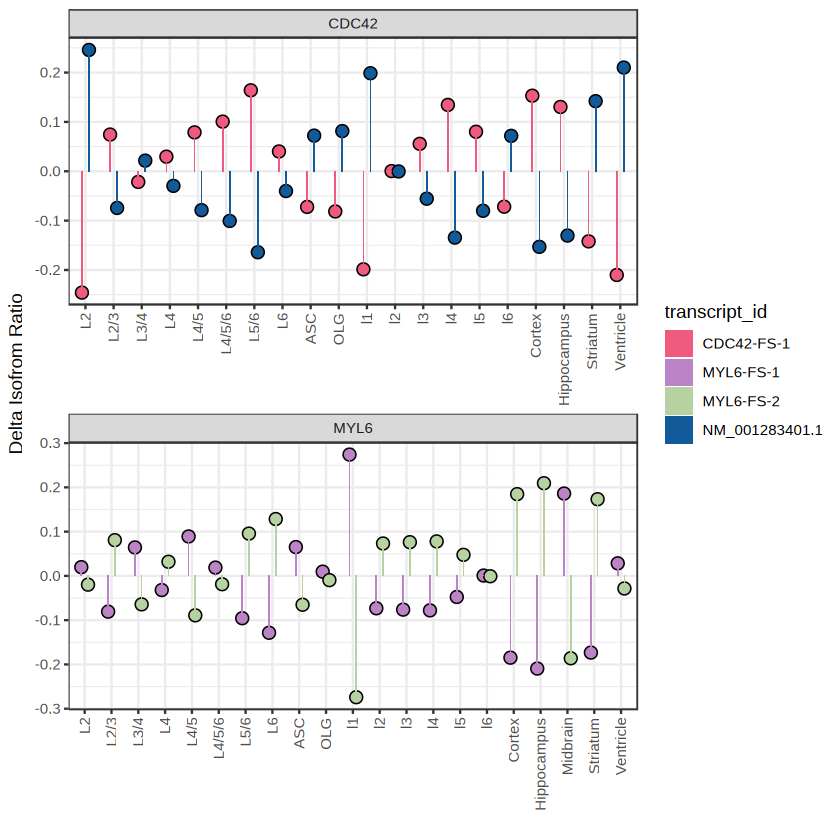

In [252]:
isosigls = isosigls.t47
mycolors = c("#B6D2A1","#BD83C7","#F05A7E","#125B9A")
names(mycolors) = c("MYL6-FS-2","MYL6-FS-1", "CDC42-FS-1", "NM_001283401.1")
isosigi = isosigls$subclass
isosigi = isosigi[isosigi$transcript_id %in% c("MYL6-FS-1","MYL6-FS-2", "CDC42-FS-1", "NM_001283401.1"),]
isosigi = isosigi %>% group_by(areatr) %>% filter(length(unique(transcript_id)) == 4)
isosigi$group = "subclass"

isosigi2 = isosigls$layer
isosigi2 = isosigi2[isosigi2$transcript_id %in% c("MYL6-FS-1","MYL6-FS-2", "CDC42-FS-1", "NM_001283401.1"),]
isosigi2$group = "layer"

isosigi3 = isosigls$subcortical
isosigi3 = isosigi3[isosigi3$transcript_id %in% c("MYL6-FS-1","MYL6-FS-2", "CDC42-FS-1", "NM_001283401.1"),]
isosigi3$group = "subcortical"

isosigi = rbind(isosigi,isosigi2,isosigi3)
isosigi$areatr = factor(isosigi$areatr,c(suborder,layerorder,subcororder))
isosigi = isosigi[!is.na(isosigi$areatr),]
p1.1 = ggplot(isosigi,aes(x = areatr,fill = transcript_id, y = dr)) + 
        geom_point(shape = 21,size = 3,position = position_dodge(0.5)) +
        geom_bar(stat = "identity",width = 0.05,color = NA,position = position_dodge(0.5)) +
        facet_wrap(~gene_id,ncol = 1,scales = "free") +
        scale_fill_manual(values = mycolors) +
        theme_bw() + theme(axis.text.x = element_text(angle = 90,vjust = 0.5,hjust = 1)) + xlab("") + ylab("Delta Isofrom Ratio")
# p1.t = ggarrange(p1.0,p1.1,widths = c(0.3,1.5),common.legend = T)
p1.1
ggexport(p1.1,filename = "result/figure6_snp_analysis/T47_cross_species_case_subclass_stat_25_12_22.pdf",width = 6,height = 5.5)

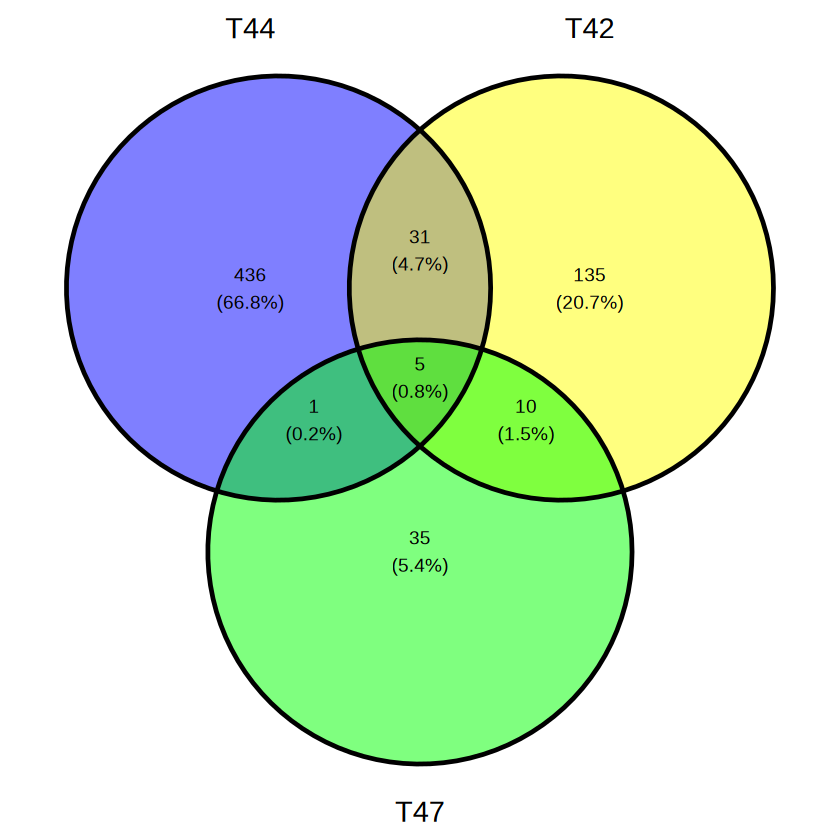

In [260]:
isosigi = isosigls.t44$class
isosigi.t44 = isosigi[isosigi$sig != "N",]
isosigi = isosigls.t42$class
isosigi.t42 = isosigi[isosigi$sig != "N",]
isosigi = isosigls.t47$class
isosigi.t47 = isosigi[isosigi$sig != "N",]
ggvenn::ggvenn(list("T44" = isosigi.t44$gene_id,
                    "T42" = isosigi.t42$gene_id,
                   "T47" = isosigi.t47$gene_id))

## Compare to other single cell data

#### Tilgner

In [477]:
cellst = fsraw.t44 %>% group_by(subclass) %>% summarise(celln = length(unique(cell_id)))
cellst

subclass,celln
<chr>,<int>
,1
ASC,27040
EC,106
L2,20794
L2/3,47025
L2/3/4,17775
L3/4,37563
L3/4/5,3328
L4,37339


In [479]:
cellst$prop = cellst$celln/sum(cellst$celln)*100
cellst

subclass,celln,prop
<chr>,<int>,<dbl>
,1,2.574519e-04
ASC,27040,6.961501e+00
EC,106,2.728991e-02
L2,20794,5.353456e+00
L2/3,47025,1.210668e+01
L2/3/4,17775,4.576208e+00
L3/4,37563,9.670667e+00
L3/4/5,3328,8.568001e-01
L4,37339,9.612998e+00


In [269]:
srtdata <- qread("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/C12L/spatial_data.qs")
srtdata

An object of class Seurat 
70310 features across 10037 samples within 1 assay 
Active assay: Spatial (70310 features, 0 variable features)
 1 layer present: counts
 1 dimensional reduction calculated: spatial

In [67]:
srtdata <- Read10X(data.dir = "/cluster/home/liuhengxin/P1_brain_nanopore/downstream_analysis/ref/biccn_tilgner_scisorseq/data/LR_annotTranscripts_byCT/")
# Initialize the Seurat object with the raw (non-normalized data).
srt <- CreateSeuratObject(counts = srtdata, project = "mmbrain", min.cells = 3, min.features = 200)
srt

Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"


An object of class Seurat 
85935 features across 395 samples within 1 assay 
Active assay: RNA (85935 features, 0 variable features)
 1 layer present: counts

In [68]:
srt$regions = MySplit(colnames(srt),"::",3)
srt$class = MySplit(colnames(srt),"::",5)
srt$subclass = MySplit(colnames(srt),"::",6)
Idents(srt) = srt$regions
srt.sub = subset(srt,idents = "VisCortex")
Idents(srt.sub) = srt.sub$subclass

In [475]:
unique(MySplit(colnames(srt),"::",2))

[1] "M5" "M6" "M1" "M2" "M8" "M9"

In [69]:
Idents(srt.sub) = srt.sub$subclass
srtdata = AverageExpression(srt.sub,layer = "counts")
head(srtdata$RNA)
srtdata = srtdata$RNA
srtdata = srtdata[rowSums(srtdata > 0) > 5,]
srtdatal = as.data.frame(srtdata)
srtdatal = melt(as.matrix(srtdatal))
colnames(srtdatal) = c("transcript_id","areatr","count")
srtdatal$transcript_id = as.character(srtdatal$transcript_id)
srtdatal$areatr = as.character(srtdatal$areatr)
srtdatal$gene_id = MySplit(srtdatal$transcript_id,"-",1)
head(srtdatal)
srtdatal.sub = srtdatal %>% group_by(areatr,gene_id) %>% mutate(genecount = sum(count))
hubsub = c('OPCs','Microglia','InhibNeuron','Astrocytes','ExciteL5','ExciteL6','ExciteL23','ExciteL4')
srtdatal.sub = srtdatal.sub[srtdatal.sub$areatr %in% hubsub,]

As of Seurat v5, we recommend using AggregateExpression to perform pseudo-bulk analysis.
This message is displayed once per session.
  [[ suppressing 20 column names 'Astrocytes', 'Ependymal', 'COPs' ... ]]



6 x 20 sparse Matrix of class "dgCMatrix"
                                                                           
Fasl-201    .     .         .     .         .      .     .     .      .    
Aox1-201    4.525 0.2857143 0.125 .         .      0.250 0.125 .      0.125
Cnnm3-201   .     .         .     .         .      .     .     .      .    
Lman2l-201  .     .         .     .         .      .     .     .      .    
Ankrd39-201 1.125 0.1428571 4.375 0.1428571 2.000 10.375 3.125 3.5625 6.500
Usf1-201    0.750 .         0.875 .         0.125  3.750 0.875 1.3750 2.250
                                                                          
Fasl-201    .     .     .    .         .     .     .     .     .     .    
Aox1-201    .     .     .    0.2857143 .     .     0.125 0.125 0.125 .    
Cnnm3-201   .     0.125 .    .         0.125 .     .     0.250 .     .    
Lman2l-201  .     0.125 .    .         .     .     .     .     .     .    
Ankrd39-201 3.875 5.375 0.25 .         1.625 0.750 

,transcript_id,areatr,count,gene_id
,<chr>,<chr>,<dbl>,<chr>
1,Aox1-201,Astrocytes,4.52500,Aox1
2,Ankrd39-201,Astrocytes,1.12500,Ankrd39
3,Usf1-201,Astrocytes,0.75000,Usf1
4,Rrp15-201,Astrocytes,11.62500,Rrp15
5,Ddx18-201,Astrocytes,33.50000,Ddx18
6,Rgs20-201,Astrocytes,36.91625,Rgs20


In [70]:
Idents(srt.sub) = srt.sub$class
srtdata = AverageExpression(srt.sub,layer = "counts")
head(srtdata$RNA)
srtdata = srtdata$RNA
srtdata = srtdata[rowSums(srtdata > 0) > 5,]
srtdatal = as.data.frame(srtdata)
srtdatal = melt(as.matrix(srtdatal))
colnames(srtdatal) = c("transcript_id","areatr","count")
srtdatal$transcript_id = as.character(srtdatal$transcript_id)
srtdatal$areatr = as.character(srtdatal$areatr)
srtdatal$gene_id = MySplit(srtdatal$transcript_id,"-",1)
head(srtdatal)
srtdatal.class = srtdatal %>% group_by(areatr,gene_id) %>% mutate(genecount = sum(count))
srtdatal.class[srtdatal.class$areatr %in% c("Astro","Oligo"),]$areatr = "NN"
srtdatal.class = srtdatal.class %>% group_by(areatr,gene_id,transcript_id) %>% summarise(count = sum(count),
                                                                                   genecount = sum(genecount))
srtdatal.class = srtdatal.class[srtdatal.class$areatr %in% c("NN","ExciteNeuron","InhibNeuron"),]

6 x 7 sparse Matrix of class "dgCMatrix"
                Astro     Oligo ExciteNeuron InhibNeuron Progenitor Immune
Fasl-201    .         .               .       .               .      .    
Aox1-201    2.5466667 0.1025641       0.0250  0.13333333      .      0.125
Cnnm3-201   .         .               0.0250  0.06666667      .      0.125
Lman2l-201  .         .               0.0250  .               .      .    
Ankrd39-201 0.6666667 4.1025641       3.9125  0.86666667      0.750  2.875
Usf1-201    0.4000000 1.1538462       1.5250  0.60000000      0.125  2.000
                  Vasc
Fasl-201    .         
Aox1-201    0.08333333
Cnnm3-201   .         
Lman2l-201  .         
Ankrd39-201 1.20833333
Usf1-201    0.08333333

,transcript_id,areatr,count,gene_id
,<chr>,<chr>,<dbl>,<chr>
1,Aox1-201,Astro,2.5466667,Aox1
2,Ankrd39-201,Astro,0.6666667,Ankrd39
3,Usf1-201,Astro,0.4000000,Usf1
4,Rrp15-201,Astro,6.7333333,Rrp15
5,Ddx18-201,Astro,19.1333333,Ddx18
6,Rgs20-201,Astro,20.2553333,Rgs20


`summarise()` has grouped output by 'areatr', 'gene_id'. You can override using
the `.groups` argument.


In [71]:
CalSigIsoform = function(transt){
    transt$relative = transt$count/transt$genecount
    transt = transt[!is.na(transt$areatr),]
    transt = transt[transt$areatr != "",]
    transtf = transt %>% group_by(transcript_id) %>% 
      mutate(meanrelative = mean(relative),
             otherrelative = (sum(relative) - relative)/(n() - 1))
    transtf = transtf[which(transtf$meanrelative > 0.05),]

    arean = length(unique(transtf$areatr))

    transtf = transtf %>% group_by(transcript_id) %>% 
       filter(length(unique(areatr)) > 1)
    transtf = transtf %>% group_by(gene_id) %>% 
      filter(length(unique(transcript_id))>1)
    
    transtf$dr = transtf$relative - transtf$otherrelative
    transtf$sig = "N"
    table(transtf$sig)
    
    #transtf$pvalue = 1
    MyChiqTest = function(transcript_id, areatr, count){
      dat = data.frame(transcript_id = transcript_id, areatr = areatr,
                       count = count)
      dat = dcast(dat, areatr~transcript_id,
                  value.var = "count",
                  fun.aggregate = sum)
      rownames(dat) = dat$areatr;dat = dat[-1]
      p = tryCatch(chisq.test(as.matrix(dat))$p.value, 
                   error = function(e) NA)
      return(p)
    }
    transtf <- transtf %>% filter(!is.na(transcript_id), !is.na(areatr), !is.na(count))
    if(nrow(transtf) == 0) return(transtf)
    pvdf = transtf %>% group_by(gene_id) %>% summarise(pvalue = MyChiqTest(transcript_id, areatr, count))
    pvdf$padj = p.adjust(pvdf$pvalue,method = "BH")
    transtf = merge(transtf,pvdf,by = "gene_id")
    #print(head(transtf))
    # table(transtf[transtf$padj < 0.05,]$sig)
    #transtf[transtf$padj < 0.05,]$sig = "Y"
    transtf[which(transtf$dr > 0.1 & transtf$padj < 0.05 & transtf$count > 10), "sig"] = "Up"
    transtf[which(transtf$dr < -0.1 & transtf$padj < 0.05 & transtf$count > 10), "sig"] = "Down"
    return(transtf)
}

isosigref.cl = CalSigIsoform(srtdatal.class)
isosigref.sub = CalSigIsoform(srtdatal.sub)
# head(isosigref.cl)
# names(isosigls) = names(transtls)
# for (i in 1:length(isosigls)) {
#     print(length(unique(isosigls[[i]][isosigls[[i]]$sig!="N",]$gene_id)))
# }
# qsave(isosigls,file = "data/dtu_analysis/dtu_isoform_ls_fsraw_cor_25_10_10.qs")

Warning message:
"There were 6979 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "0610009E02Rik"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 6978 remaining warnings."
Warning message:
"There were 8601 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "0610009E02Rik"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 8600 remaining warnings."


In [72]:
length(unique(isosigref.sub[isosigref.sub$sig != "N",]$gene_id))
isosigref.sub[isosigref.sub$gene_id == "Myl6",]
isosigref.sub[isosigref.sub$gene_id == "Cdc42",]

[1] 745

,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
155657,Myl6,Myl6-201,ExciteL4,526.22875,631.2487,0.83363135,0.6520731,0.6261362,0.2074951,Up,1.259262e-206,1.285427e-203
155658,Myl6,Myl6-201,Astrocytes,41.68750,222.4375,0.18741219,0.6520731,0.7184532,-0.5310410,Down,1.259262e-206,1.285427e-203
155659,Myl6,Myl6-206,ExciteL4,66.29125,631.2487,0.10501605,0.2991414,0.3268736,-0.2218576,Down,1.259262e-206,1.285427e-203
155660,Myl6,Myl6-206,ExciteL23,24.90625,282.1875,0.08826135,0.2991414,0.3292672,-0.2410058,Down,1.259262e-206,1.285427e-203
155661,Myl6,Myl6-206,OPCs,176.93750,344.8750,0.51304821,0.2991414,0.2685833,0.2444649,Up,1.259262e-206,1.285427e-203
155662,Myl6,Myl6-201,ExciteL6,872.86375,1020.4250,0.85539236,0.6520731,0.6230275,0.2323649,Up,1.259262e-206,1.285427e-203
155663,Myl6,Myl6-206,Microglia,52.60375,314.4987,0.16726219,0.2991414,0.3179813,-0.1507191,Down,1.259262e-206,1.285427e-203
155664,Myl6,Myl6-206,InhibNeuron,137.95750,252.7687,0.54578543,0.2991414,0.2639066,0.2818789,Up,1.259262e-206,1.285427e-203
155665,Myl6,Myl6-206,ExciteL5,45.53125,498.8750,0.09126785,0.2991414,0.3288377,-0.2375698,Down,1.259262e-206,1.285427e-203


,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
29833,Cdc42,Cdc42-202,InhibNeuron,96.0000,404.2075,0.2375018,0.3894863,0.4111984,-0.1736966,Down,0,0
29834,Cdc42,Cdc42-201,OPCs,186.2500,596.8750,0.3120419,0.5593177,0.5946428,-0.2826009,Down,0,0
29835,Cdc42,Cdc42-201,ExciteL6,1682.2500,2312.6413,0.7274150,0.5593177,0.5353038,0.1921113,Up,0,0
29836,Cdc42,Cdc42-202,OPCs,403.2500,596.8750,0.6756021,0.3894863,0.3486126,0.3269895,Up,0,0
29837,Cdc42,Cdc42-202,ExciteL4,317.0625,1640.9075,0.1932239,0.3894863,0.4175238,-0.2242999,Down,0,0
29838,Cdc42,Cdc42-201,InhibNeuron,301.6250,404.2075,0.7462133,0.5593177,0.5326183,0.2135950,Up,0,0
29839,Cdc42,Cdc42-202,ExciteL23,170.2500,810.9425,0.2099409,0.3894863,0.4151356,-0.2051947,Down,0,0
29840,Cdc42,Cdc42-201,Astrocytes,102.6875,288.6250,0.3557817,0.5593177,0.5883942,-0.2326125,Down,0,0
29841,Cdc42,Cdc42-201,ExciteL23,564.6250,810.9425,0.6962577,0.5593177,0.5397548,0.1565029,Up,0,0


In [385]:
isosigref.case = isosigref[isosigref$gene_id == "Arpp19",]
ggplot(isosigref.case,aes(x = areatr,y = relative,fill = transcript_id)) +
            geom_bar(stat = "identity",position = "dodge") + theme(axis.text.x = element_text(angle = 90,hjust = 1))

ERROR: Error: object 'isosigref' not found


In [92]:
unique(isosigi2$areatr)

[1] "OPCs"            "ExciteNP"        "Microglia"       "InhibNeuron"    
 [5] "Astrocytes"      "ExciteL5"        "ExciteL6"        "NIPCs"          
 [9] "ExciteL23"       "ExciteL4"        "Endo"            "MOLs"           
[13] "COPs"            "Pericytes"       "Macrophages"     "DivOPCs"        
[17] "Ependymal"       "Fibroblasts"     "MFOLs"           "InhCajalRetzius"

In [73]:
#calculate jaccard score
# isosigi = rbind(isosigls.t44$class,
#                isosigls.t44$subcortical)


# isosig.t42
# isosig.t47
jaccard_similarity <- function(vec1, vec2) {
  intersection <- length(intersect(vec1, vec2))
  union <- length(union(vec1, vec2))
  return(intersection/union)
}

# isosigi1 = rbind(isosigls.t44$class,
#                isosigls.t44$subcortical)


DTUJaccard = function(isosigi1,isosigi2){
    comarea1 = unique(isosigi1$areatr)
    comarea2 = unique(isosigi2$areatr)
    jcdf = NULL
    for(i in 1:length(comarea1)){
        for(j in 1:length(comarea2)){
            df1 = isosigi1[isosigi1$areatr == comarea1[i],]
            df2 = isosigi2[isosigi2$areatr == comarea2[j],]
            comgene = unique(c(df1$gene_id,df2$gene_id))
            nt = length(comgene)
            vec1 = unique(unique(df1$gene_id))
            vec2 = unique(unique(df2$gene_id))
            nt1 = length(vec1)
            nt2 = length(vec2)
            jcv = jaccard_similarity(vec1,vec2)
            jcdf = rbind(jcdf,data.frame("Var1" = comarea1[i],"Var2" = comarea2[j],"value" = jcv,
                                         "nt" = nt,"nt" = nt1,"nt" = nt2))
        }
    }
    return(jcdf)
}


DTUCormx = function(isosigi1,isosigi2){
    comarea1 = unique(isosigi1$areatr)
    comarea2 = unique(isosigi2$areatr)
    jcdf = NULL
    for(i in 1:length(comarea1)){
        for(j in 1:length(comarea2)){
            df1 = isosigi1[isosigi1$areatr == comarea1[i],]
            df2 = isosigi2[isosigi2$areatr == comarea2[j],]
            # comgene = intersect(df1$gene_id,df2$gene_id)
            # df1 = df1[(df1$gene_id %in% comgene) & (df1$sig != "N"),]
            # df2 = df2[(df2$gene_id %in% comgene) & (df2$sig != "N"),]
            df = merge(df1[,c("gene_id","dr")],df2[,c("gene_id","dr")],by = "gene_id")
            nt = nrow(df)
            corv = cor(df$dr.x,df$dr.y)
            jcdf = rbind(jcdf,data.frame("Var1" = comarea1[i],"Var2" = comarea2[j],"value" = corv,
                                         "nt" = nt))
        }
    }
    return(jcdf)
}




[1] 30

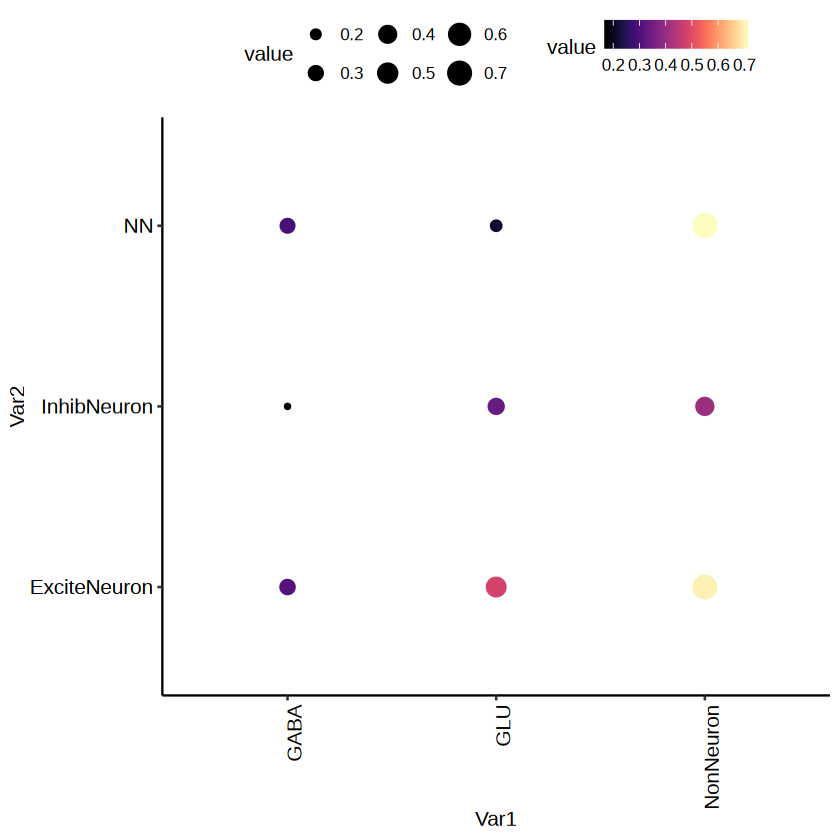

In [169]:
isosigi1 = isosigls.t44$class
isosigi1 = isosigi1[isosigi1$sig != "N",]
isosigi1 = isosigi1 %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))

isosigi2 = isosigref.cl[isosigref.cl$sig != "N",]
isosigi2$gene_id = toupper(isosigi2$gene_id)
isosigi2 = isosigi2 %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))

comgene = intersect(toupper(isosigi1$gene_id),isosigi2$gene_id)
length(comgene)
isosigi2 = isosigi2[isosigi2$gene_id %in% comgene,]
isosigi1 = isosigi1[isosigi1$gene_id %in% comgene,]
jcdf = DTUJaccard(isosigi1,isosigi2)

ggplot(jcdf,aes(x = Var1,y = Var2, color = value,size = value)) + geom_point() + 
        scale_color_viridis(option = "A") + theme_pubr() + 
        theme(axis.text.x = element_text(angle = 90,hjust = 1))


In [170]:
jcdf

Var1,Var2,value,nt,nt.1,nt.2
<chr>,<chr>,<dbl>,<int>,<int>,<int>
NonNeuron,ExciteNeuron,0.7000000,30,27,24
NonNeuron,NN,0.7142857,28,27,21
NonNeuron,InhibNeuron,0.4074074,27,27,11
GLU,ExciteNeuron,0.4800000,25,13,24
GLU,NN,0.2142857,28,13,21
GLU,InhibNeuron,0.3333333,18,13,11
GABA,ExciteNeuron,0.3076923,26,10,24
GABA,NN,0.2916667,24,10,21
GABA,InhibNeuron,0.1666667,18,10,11


#### My st data analysis

In [6]:
# setwd("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/C12L/")
library(data.table)
gemdf.12 = fread("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/C12L/C03542C6.cellbin.gem")
gemdf.62 = fread("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/62L/C03537C6.cellbin.gem")

In [7]:
head(gemdf.62)
head(gemdf.12)

geneID,x,y,MIDCount,ExonCount,CellID
<chr>,<int>,<int>,<int>,<int>,<int>
Zwint,12042,17174,1,1,62914
Ift81,12044,17174,1,1,62914
Tsga10,12035,17175,4,0,62914
2810459M11Rik,12035,17175,1,1,62914
Pdxdc1,12035,17175,3,0,62914
Ntm,12036,17175,3,0,62914


geneID,x,y,MIDCount,ExonCount,CellID
<chr>,<int>,<int>,<int>,<int>,<int>
Gm42418,12158,19509,1,1,70312
Gm42418,12159,19509,1,1,70312
Nsun2,12155,19510,2,2,70312
Gm42418,12157,19510,1,1,70312
Nap1l1,12158,19510,2,0,70312
Chmp5,12152,19511,1,1,70312


In [452]:
# 创建细胞-基因表达矩阵
# df = gemdf
# output_rds_path = "spatial_data.qs"
GEMToseurat = function(df,output_rds_path){
    assay_name = "RNA"
    min_cells = 3
    min_features = 200
    
    expression_matrix <- df %>%
        dplyr::group_by(CellID, geneID) %>%
        dplyr::summarise(count = sum(.data[["MIDCount"]]), .groups = 'drop') %>%
        tidyr::pivot_wider(
          id_cols = geneID,
          names_from = CellID,
          values_from = count,
          values_fill = 0
        ) %>%
        tibble::column_to_rownames("geneID") %>%
        as.matrix()
      
    # 转换为稀疏矩阵
    sparse_matrix <- Matrix::Matrix(expression_matrix, sparse = TRUE)
      
    # 3. 创建Seurat对象
    cat("正在创建Seurat对象...\n")
      
    # 创建Seurat对象
    seurat_obj <- Seurat::CreateSeuratObject(
        counts = sparse_matrix,
        assay = assay_name,
        min.cells = min_cells,
        min.features = min_features,
        project = "SpatialTranscriptomics"
    )
    
    # 4. 添加空间坐标信息
    
        # 获取每个细胞的平均坐标
    cell_coords <- df %>%
          dplyr::group_by(CellID) %>%
          dplyr::summarise(
            x = mean(x, na.rm = TRUE),
            y = mean(y, na.rm = TRUE),
            .groups = 'drop'
          ) %>%
          tibble::column_to_rownames("CellID")
        
    # 确保坐标顺序与细胞顺序一致
    cell_coords <- cell_coords[rownames(seurat_obj@meta.data), ]
    
    # 添加空间坐标到metadata
    seurat_obj@meta.data$x <- cell_coords$x
    seurat_obj@meta.data$y <- cell_coords$y
        
    # 创建空间坐标矩阵
    spatial_coords_matrix <- as.matrix(cell_coords)
    colnames(spatial_coords_matrix) <- c("spatial_1", "spatial_2")
    
    seurat_obj@reductions$spatial <- Seurat::CreateDimReducObject(
          embeddings = spatial_coords_matrix,
          key = "spatial_",
          assay = assay_name)
    # The [[ operator can add columns to object metadata. This is a great place to stash QC stats
    seurat_obj[["percent.mt"]] <- PercentageFeatureSet(seurat_obj, pattern = "^MT-")
    # Visualize QC metrics as a violin plot
    # VlnPlot(seurat_obj, features = c("nFeature_RNA", "percent.mt"), ncol = 1)
    seurat_obj <- NormalizeData(seurat_obj)
    seurat_obj <- FindVariableFeatures(seurat_obj, selection.method = "vst", nfeatures = 2000)
    seurat_obj = ScaleData(seurat_obj)
    seurat_obj <- RunPCA(seurat_obj, features = VariableFeatures(object = seurat_obj))
    seurat_obj <- RunUMAP(seurat_obj, dims = 1:10)
    seurat_obj <- FindNeighbors(seurat_obj, dims = 1:10)
    seurat_obj <- FindClusters(seurat_obj, resolution = 0.8)
    qsave(seurat_obj,output_rds_path)
    return(seurat_obj)
}

srt.12 = GEMToseurat(gemdf.12,"/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/C12L/seurat.obj.qs")
srt.12
srt.62 = GEMToseurat(gemdf.62,"/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/62L/seurat.obj.qs")
srt.62

正在创建Seurat对象...


Normalizing layer: counts

Finding variable features for layer counts

Centering and scaling data matrix

PC_ 1 
Positive:  Malat1, Rbfox1, Dlg2, Nrg3, Csmd1, Kcnip4, Celf2, Fgf14, Ptprd, Lrrtm4 
	   Nrxn3, Fam155a, Nrxn1, Nrg1, Nlgn1, Lsamp, Gm28928, Tenm2, Opcml, Erc2 
	   Dlgap2, Grm7, Sgcz, Pcdh9, Asic2, Il1rapl1, Kcnma1, Auts2, Lingo2, Nav3 
Negative:  Plp1, Mbp, Mobp, Ptgds, Mag, Apod, Cnp, Mal, Cryab, Sst 
	   Enpp2, Ttr, Npy, Mgp, Qk, Tprn, Gad1, 1700047M11Rik, Prr5l, Cartpt 
	   Vip, Gm21983, Ecel1, Tac2, Thbs4, Pdyn, Arhgap31, Tmem212, Plpp2, Gm45767 
PC_ 2 
Positive:  Gpc5, Npas3, Trpm3, Qk, Gm3764, Plp1, Msi2, Pitpnc1, Rora, Slc4a4 
	   Sox6, Mbp, Dock1, Mag, Nfia, Malat1, Mobp, Mal, Lsamp, Cnp 
	   Luzp2, Mertk, Ntm, Prex2, Apod, Maml2, Erbb4, Pcdh9, Trps1, Cryab 
Negative:  Syt1, Mef2c, Gm28928, Celf2, Arpp21, Grin2a, Cnksr2, Kalrn, Gabrb3, Pde1a 
	   Csmd1, Dlg2, Kcnip4, Dlgap2, Dlgap1, Grm5, Nrg1, Erc2, Kcnq5, Gm21949 
	   Tenm2, Sst, Cacna1e, Rbfox1, Dpp10, Kcnh7, Slit

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 31638
Number of edges: 793711

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7677
Number of communities: 12
Elapsed time: 9 seconds


An object of class Seurat 
19361 features across 31638 samples within 1 assay 
Active assay: RNA (19361 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 3 dimensional reductions calculated: spatial, pca, umap

正在创建Seurat对象...


Normalizing layer: counts

Finding variable features for layer counts

Centering and scaling data matrix

PC_ 1 
Positive:  Plp1, Ptgds, Mal, Apod, Mag, Vtn, Igf2, Mgp, Prr5l, Sst 
	   Slc6a3, Cartpt, Npy, Ranbp3l, St18, Dock10, Th, Prg4, Cort, Efemp1 
	   Slc18a2, Thbs4, Vip, Gja4, H2-Ab1, Chd7, Pcdhb8, Fkbp11, Cryba4, Ajuba 
Negative:  Malat1, Dlg2, Csmd1, Rbfox1, Nrg3, Nrg1, Celf2, Fgf14, Kcnip4, Lrrtm4 
	   Fam155a, Dlgap2, Gm28928, Nlgn1, Meg3, Ptprd, Nrxn3, Lingo2, Kctd16, Nav3 
	   Lsamp, Grm5, Grm7, Macrod2, Adgrb3, Nkain2, Prkg1, Hs6st3, Lrrc7, Asic2 
PC_ 2 
Positive:  Syt1, Meg3, Mef2c, Arpp21, Pde1a, Cnksr2, Grin2a, Gm28928, Cacna1e, Grm5 
	   Tenm2, Grin2b, Gria3, Gm21949, Kcnip4, Homer1, Fam19a1, Gabrb3, Kcnq5, Dlg2 
	   Anks1b, Nrg3, Csmd1, Celf2, Fam155a, Erc2, R3hdm1, Rbfox1, Cacna2d1, Kcnh7 
Negative:  Gpc5, Npas3, Trpm3, Gm3764, Msi2, Malat1, Luzp2, Slc4a4, Lsamp, Pitpnc1 
	   Sox6, Rora, Ntm, Dock1, Macf1, Mertk, Zeb1, Nhsl1, Trps1, Nfia 
	   Maml2, Cdh20, Zbtb20, Hd

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 44021
Number of edges: 996563

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7511
Number of communities: 10
Elapsed time: 15 seconds


An object of class Seurat 
20147 features across 44021 samples within 1 assay 
Active assay: RNA (20147 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 3 dimensional reductions calculated: spatial, pca, umap

Warning message:
"`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.
ℹ The deprecated feature was likely used in the Seurat package.
  Please report the issue at <https://github.com/satijalab/seurat/issues>."


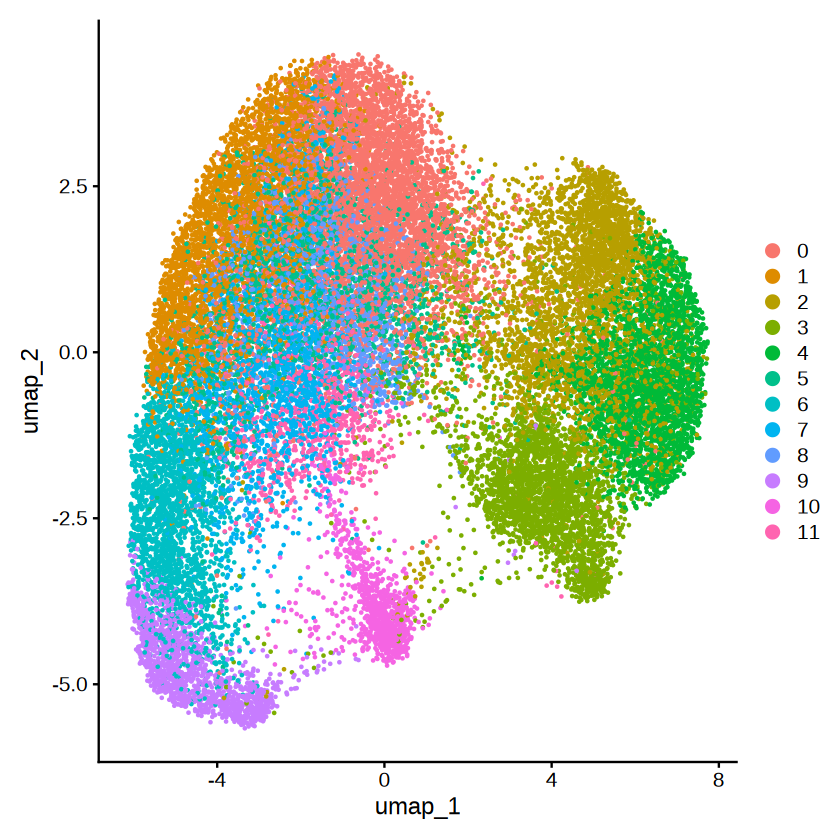

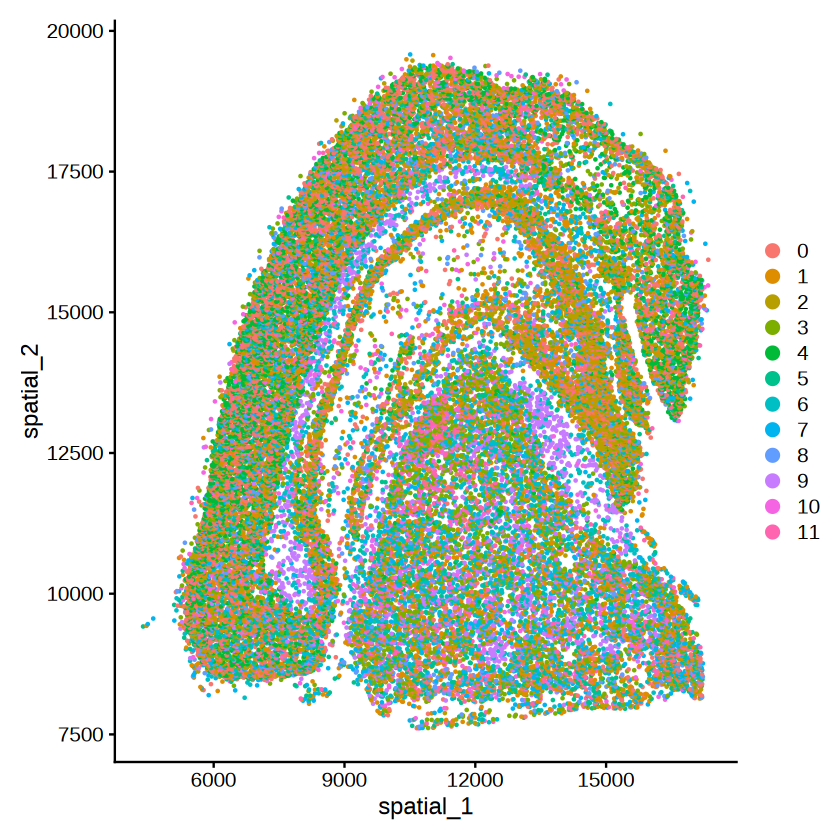

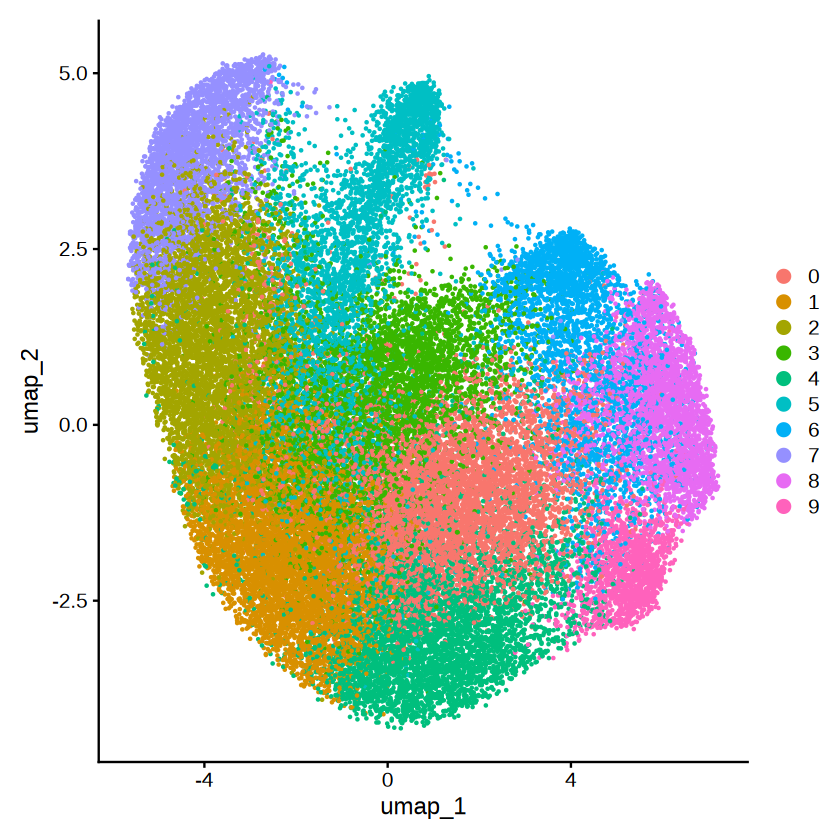

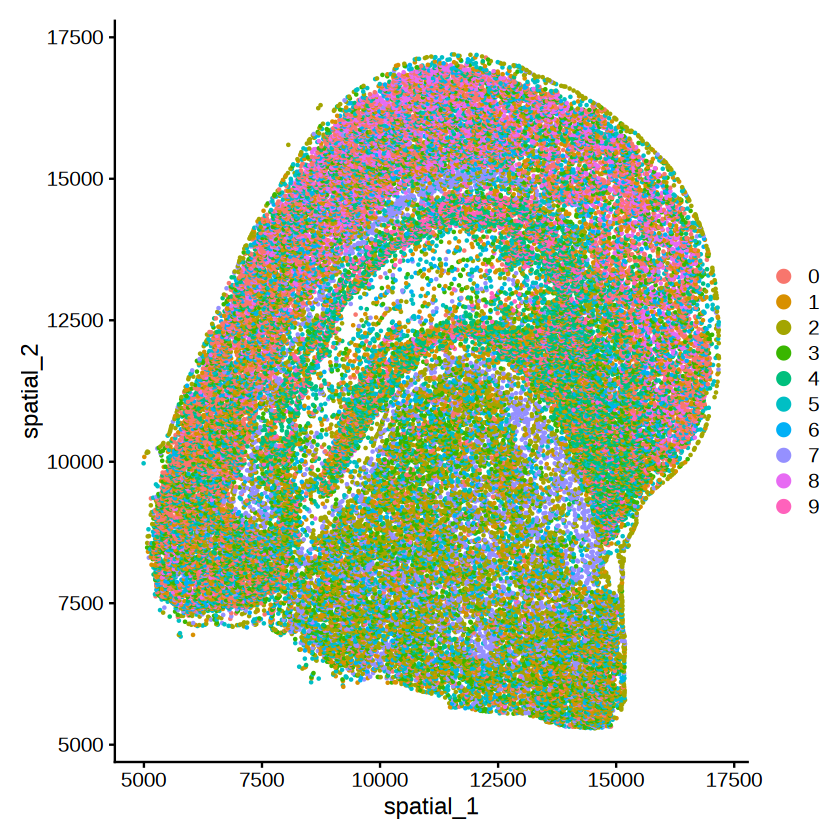

In [8]:
srt.12 = qread("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/C12L/seurat.obj.qs")
srt.62 = qread("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/refdata/62L/seurat.obj.qs")
DimPlot(srt.12, reduction = "umap")
DimPlot(srt.12, reduction = "spatial")
DimPlot(srt.62, reduction = "umap")
DimPlot(srt.62, reduction = "spatial")

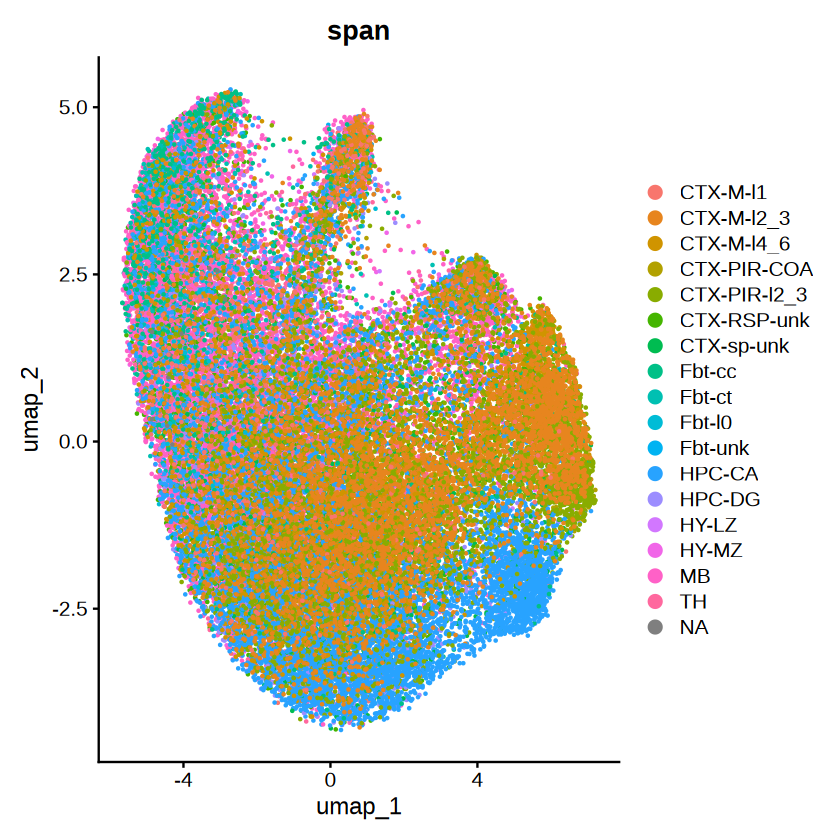

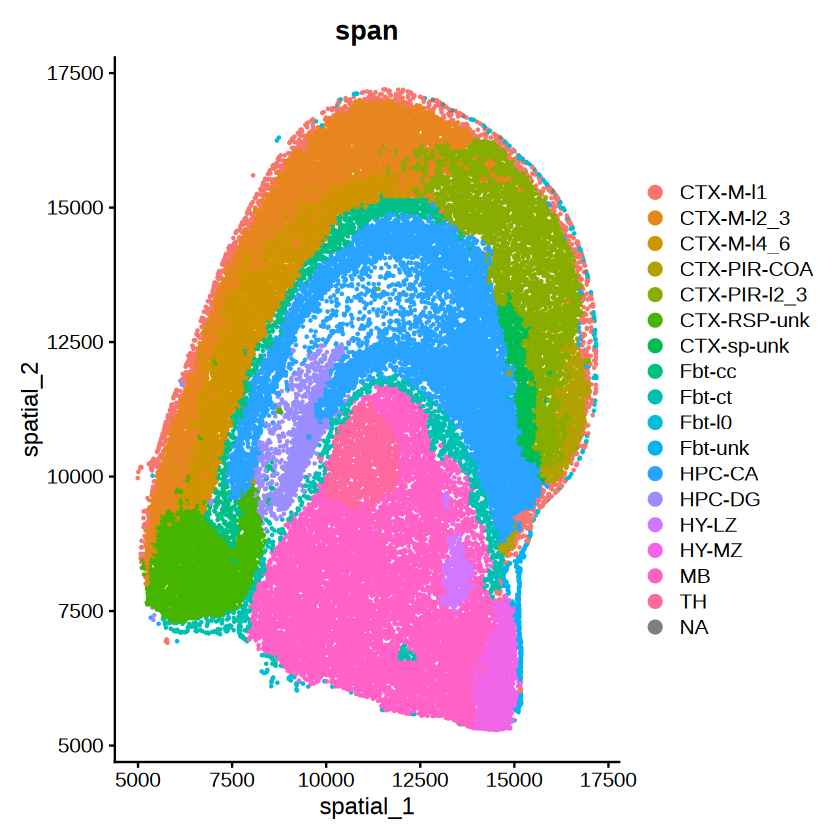

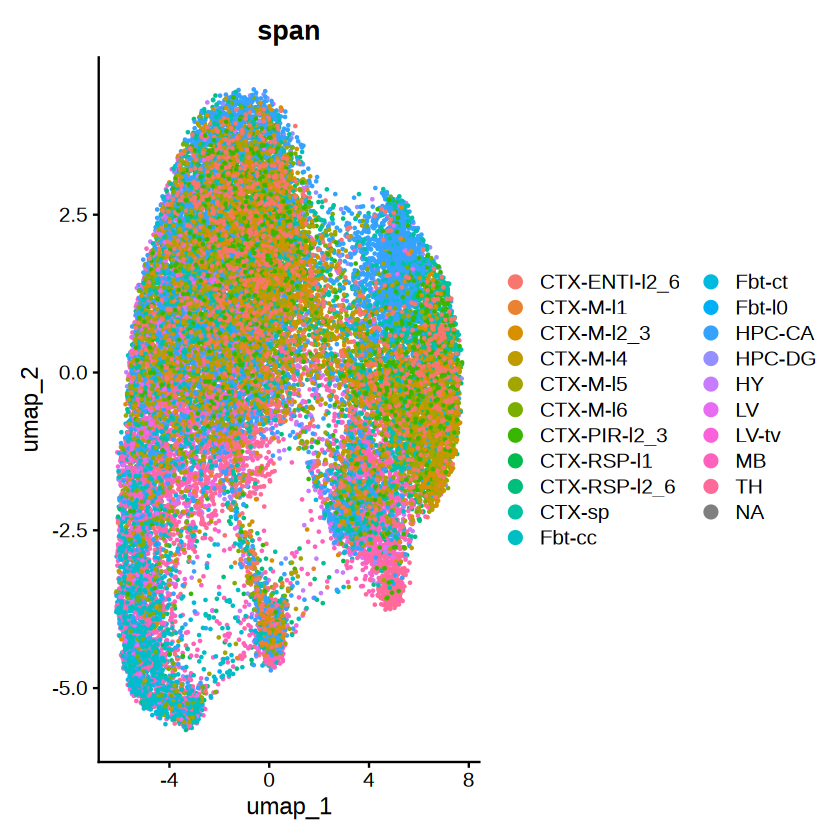

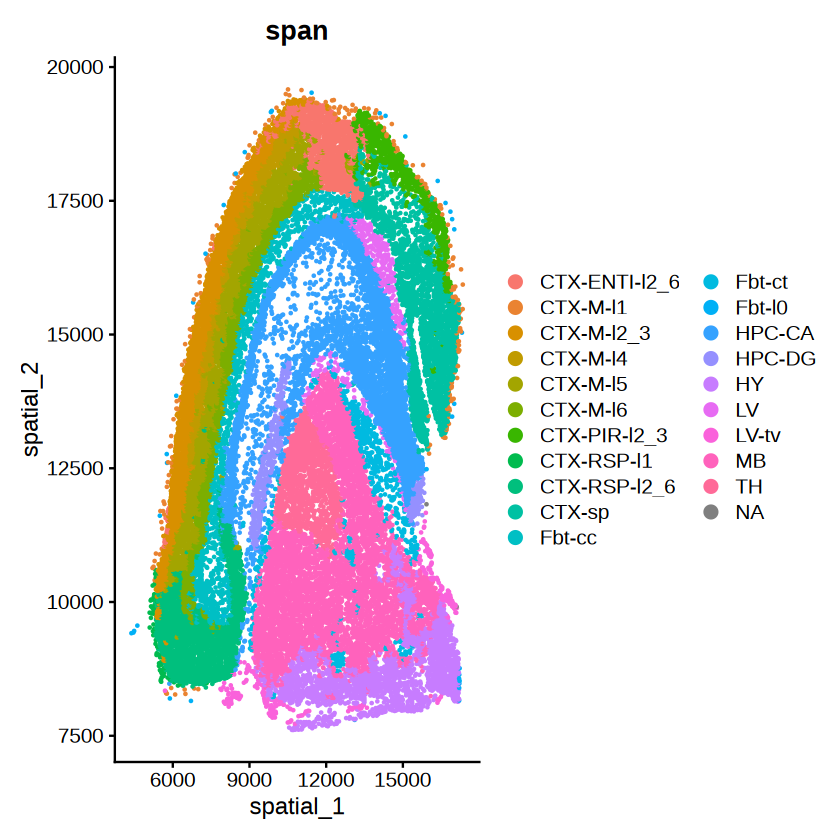

In [12]:
## combine with span
AddSpan = function(span,gemdf,seurat_obj,bin = 200){
     colnames(span)[1:2] = c("spatial_1","spatial_2")
     cell_coords <- gemdf %>%
      dplyr::group_by(CellID) %>%
      dplyr::summarise(
        x = mean(x, na.rm = TRUE),
        y = mean(y, na.rm = TRUE),
        .groups = 'drop'
      ) %>%
      tibble::column_to_rownames("CellID")
    cell_coords <- cell_coords[rownames(seurat_obj@meta.data), ]
    
    span.cl = cell_coords
    span.cl$cellid = rownames(seurat_obj@meta.data)
    ra = bin
    span.cl$spatial_1 = as.integer(span.cl$x/(ra*2)) * ra * 2 + ra
    span.cl$spatial_2 = as.integer(span.cl$y/(ra*2)) * ra * 2 + ra
    nrow(span.cl)
    span.cl = merge(span.cl,span,by = c("spatial_1","spatial_2"))
    nrow(span.cl)
    clusteran = span.cl$region
    names(clusteran) = span.cl$cellid
    seurat_obj$span = clusteran
    return(seurat_obj)
}
span.12 = read.csv("/cluster/home/liuhengxin/P_fullscope_crosspecies/downstream_analysis/processed_data/spatial_annotation/C12_spatialcluster_STAGATE.csv")
span.62 = read.csv("/cluster/home/liuhengxin/P_fullscope_crosspecies/downstream_analysis/processed_data/spatial_annotation/B62_spatialcluster_STAGATE.csv")

srt.12 = AddSpan(span.12,gemdf.12,srt.12,50)
srt.62 = AddSpan(span.62,gemdf.62,srt.62,50)
DimPlot(srt.62, reduction = "umap",group.by = "span")
DimPlot(srt.62, reduction = "spatial",group.by = "span")
DimPlot(srt.12, reduction = "umap",group.by = "span")
DimPlot(srt.12, reduction = "spatial",group.by = "span")

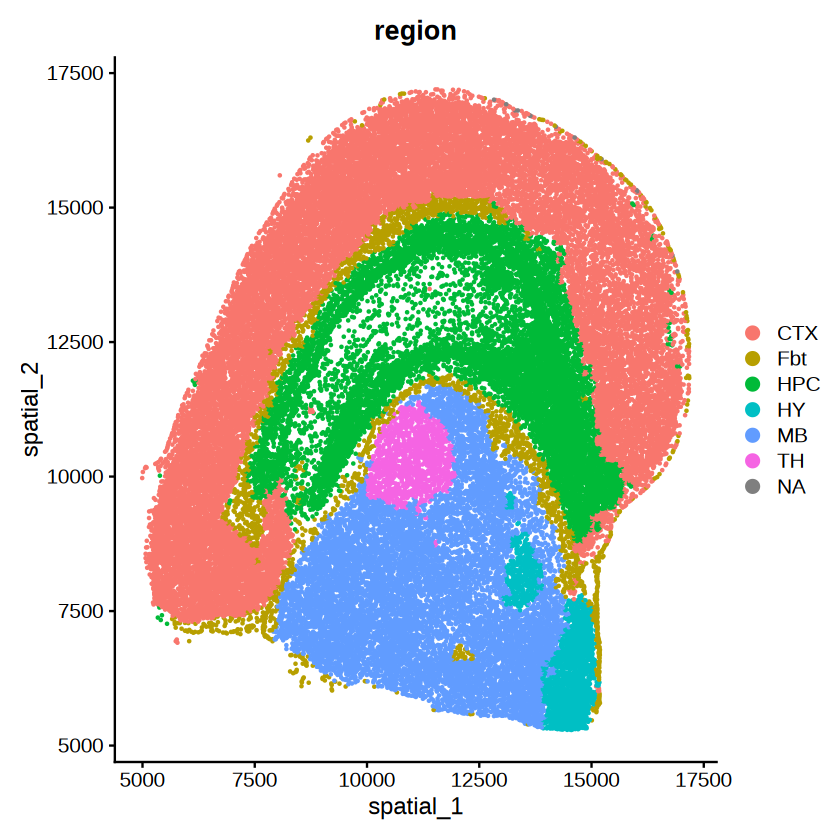

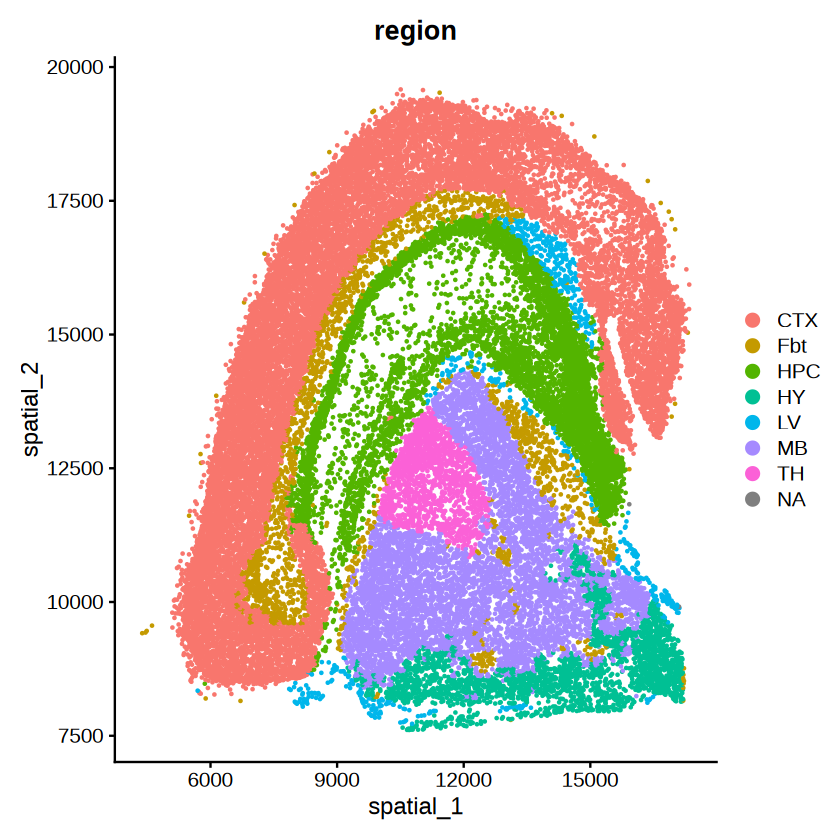

In [14]:
srt.62$region = MySplit(srt.62$span,"-",1)
DimPlot(srt.62, reduction = "spatial",group.by = "region")
srt.12$region = MySplit(srt.12$span,"-",1)
DimPlot(srt.12, reduction = "spatial",group.by = "region")

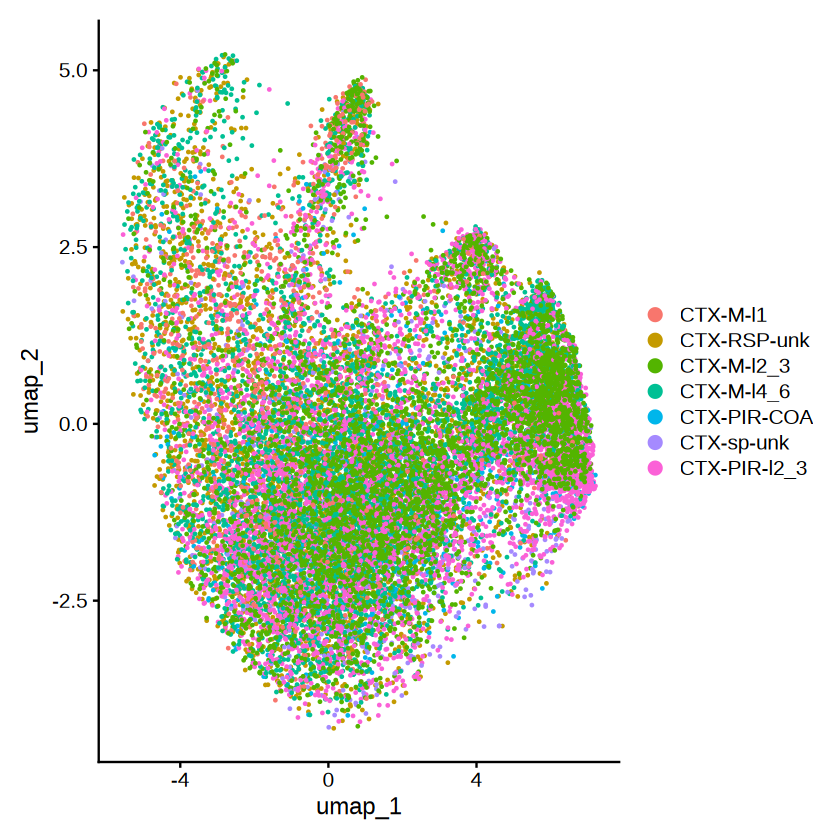

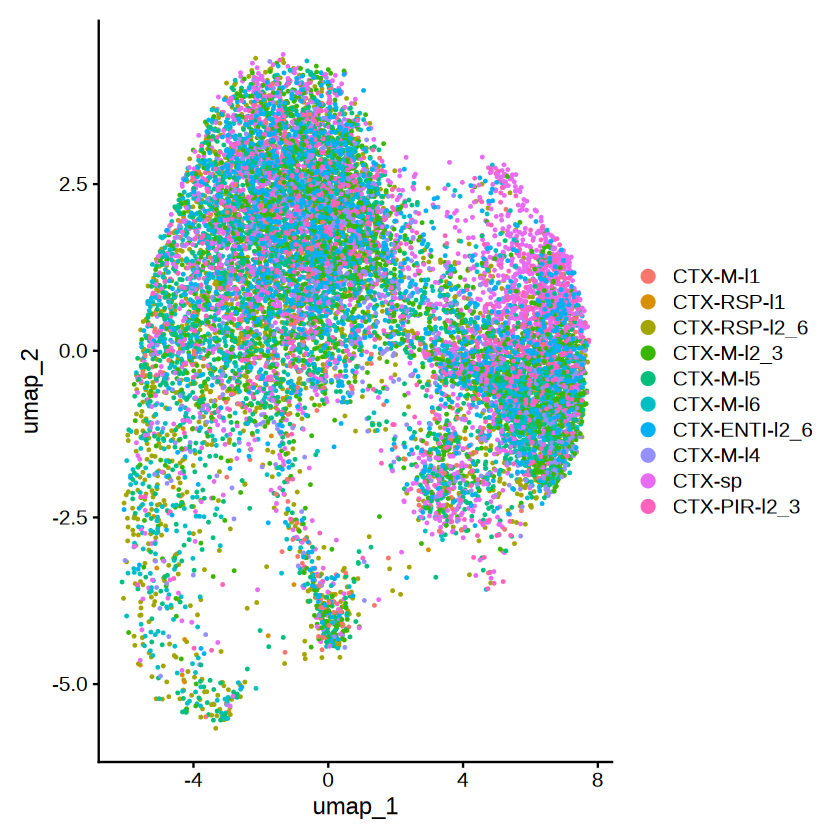

In [15]:
Idents(srt.62) = srt.62$region
srt.62.sub = subset(srt.62,idents = c("CTX"))
Idents(srt.62.sub) = srt.62.sub$span
DimPlot(srt.62.sub, reduction = "umap")

Idents(srt.12) = srt.12$region
srt.12.sub = subset(srt.12,idents = c("CTX"))
Idents(srt.12.sub) = srt.12.sub$span
DimPlot(srt.12.sub, reduction = "umap")

newan
   0    1    2    3    4    5 
6495 3045 2405 1543  594  430 

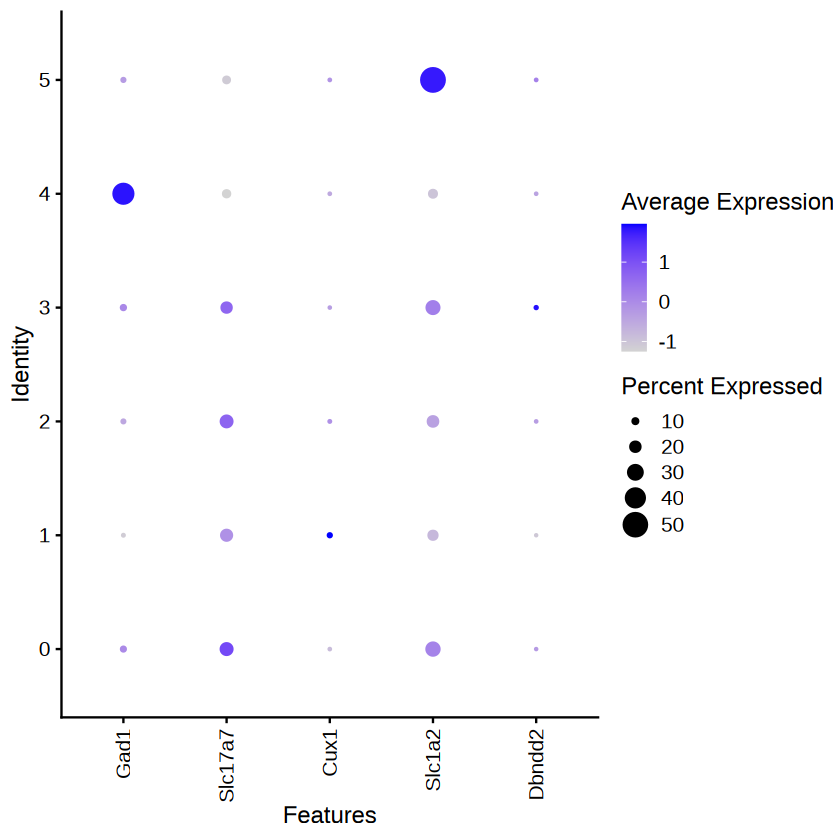

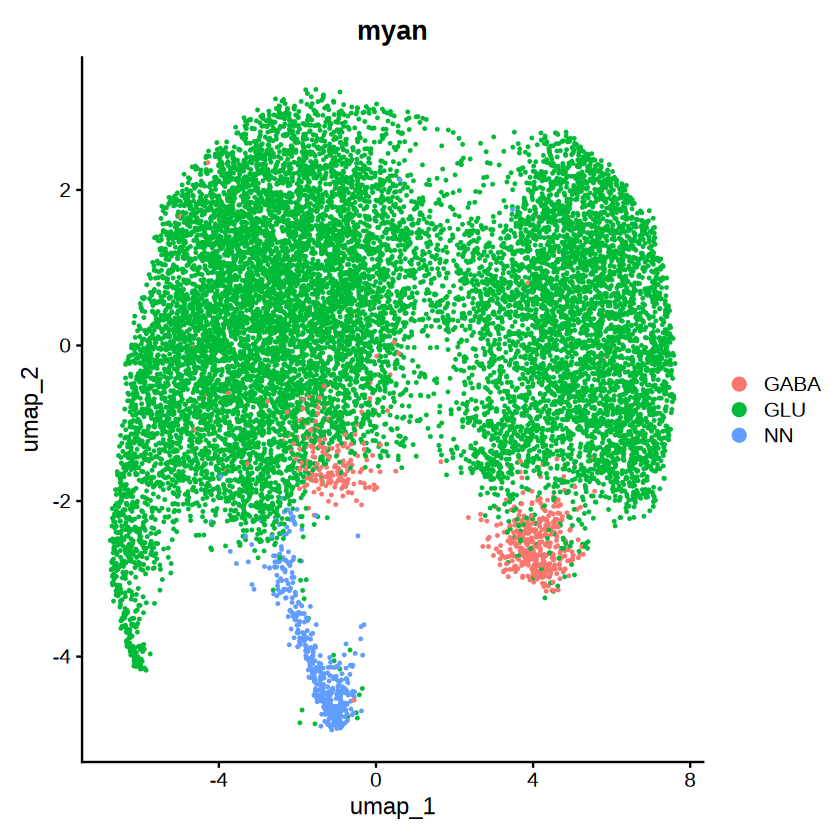

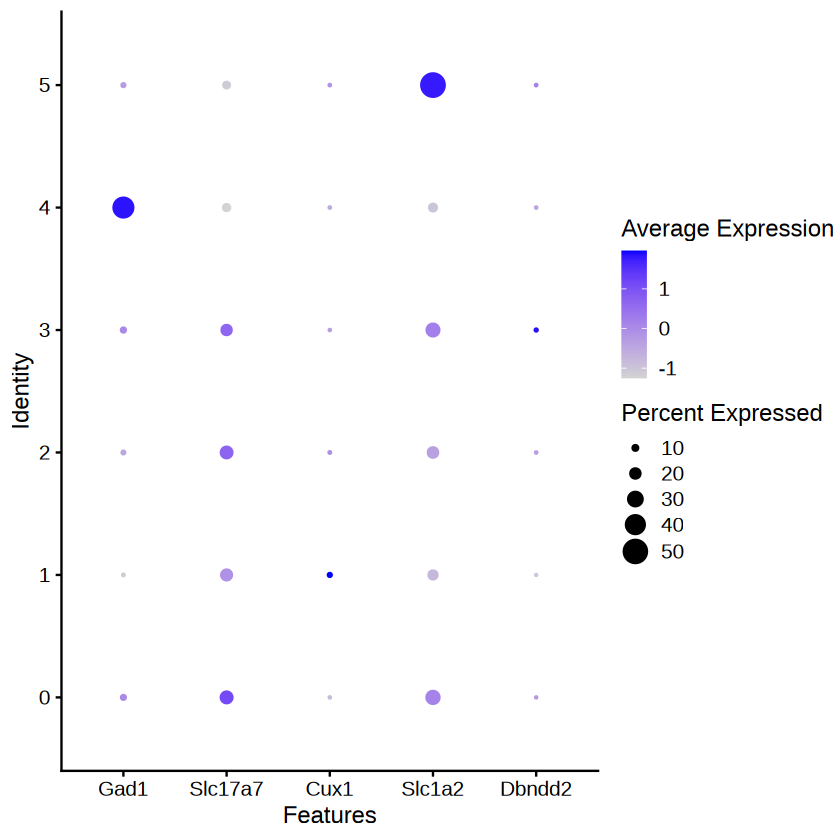

In [104]:
DotPlot(srt.12.sub,c("Gad1", "Slc17a7", "Cux1",'Slc1a2','Dbndd2')) + 
theme(axis.text.x = element_text(angle = 90,hjust = 1,vjust = 0.5))
newan = srt.12.sub$`RNA_snn_res.0.5`
table(newan)
groupan = data.frame("seurat" = c(0:5),"myan" = c("GLU","GLU","GLU","GLU","GABA","NN"))
newan = groupan[match(newan,groupan$seurat),]$myan
# # newan
names(newan) = colnames(srt.12.sub)
srt.12.sub$myan = newan
DimPlot(srt.12.sub, reduction = "umap",group.by = "myan")
DotPlot(srt.12.sub,c("Gad1", "Slc17a7", "Cux1",'Slc1a2','Dbndd2'))

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 19405
Number of edges: 477687

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7049
Number of communities: 13
Elapsed time: 4 seconds


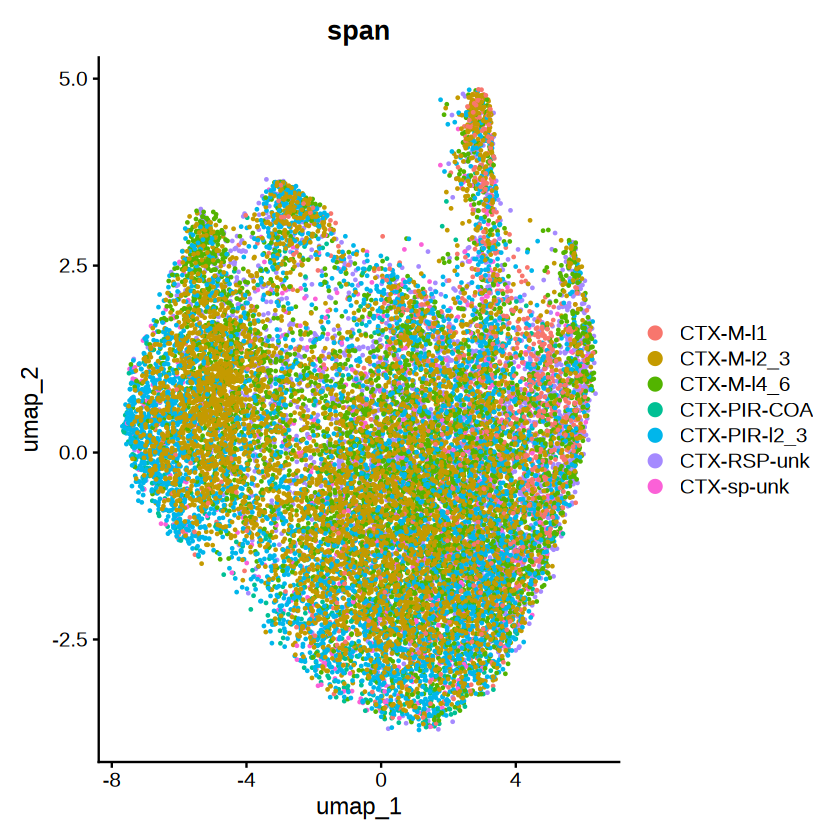

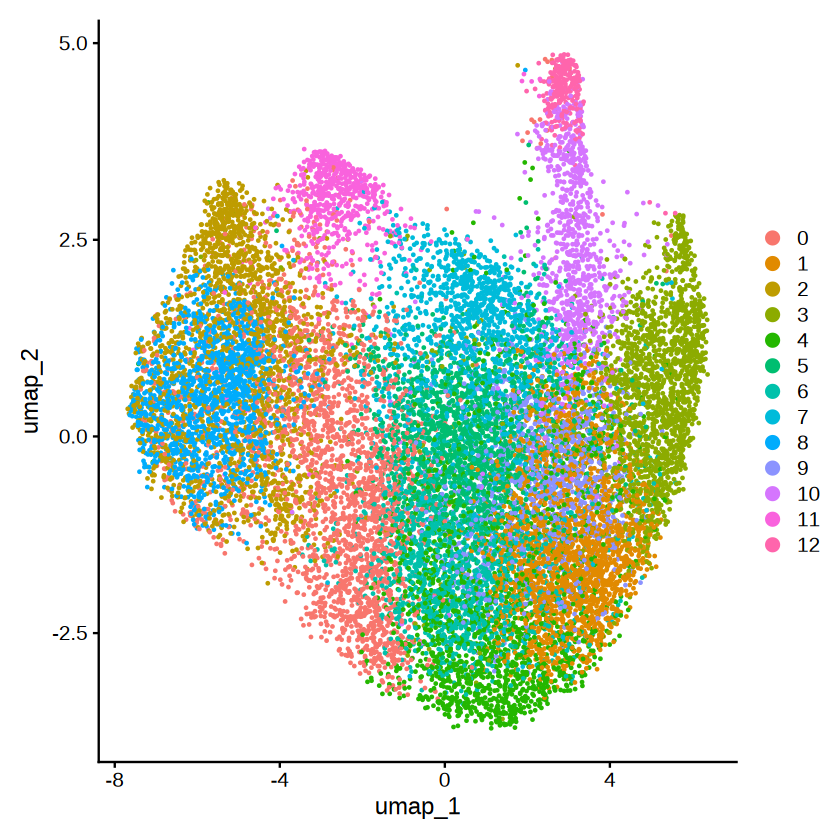

In [193]:
# srt.62.sub <- RunUMAP(srt.62.sub, dims = 1:10)
# srt.62.sub <- FindNeighbors(srt.62.sub, dims = 1:10)
srt.62.sub <- FindClusters(srt.62.sub, resolution = 1)

# srt.12.sub <- RunUMAP(srt.12.sub, dims = 1:10)
# srt.12.sub <- FindNeighbors(srt.12.sub, dims = 1:10)
# srt.12.sub <- FindClusters(srt.12.sub, resolution = 0.5)
# DimPlot(srt.12.sub, reduction = "umap",group.by = "span")
# DimPlot(srt.12.sub, reduction = "umap")
DimPlot(srt.62.sub, reduction = "umap",group.by = "span")
DimPlot(srt.62.sub, reduction = "umap")


Warning message:
"The following requested variables were not found: 9130024F11Rik"
Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


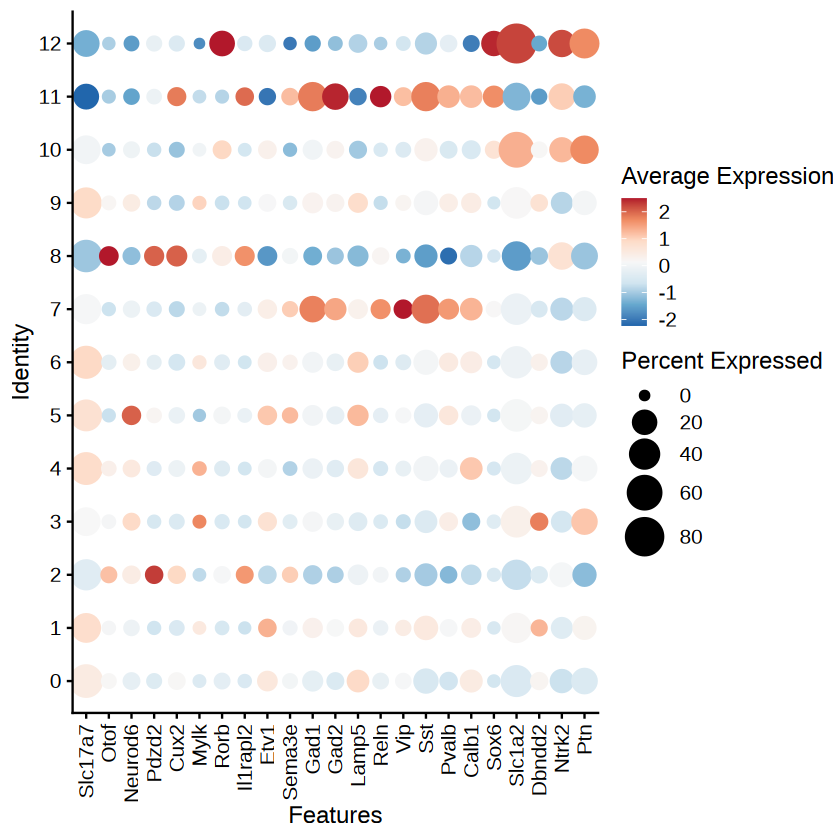

Warning message:
"Scaling data with a low number of groups may produce misleading results"


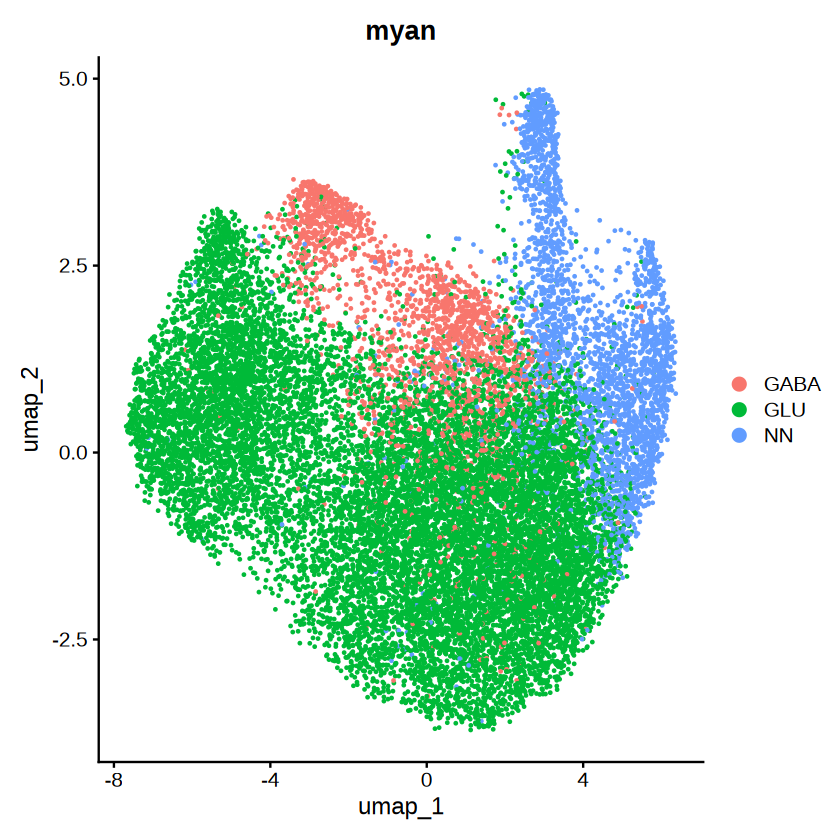

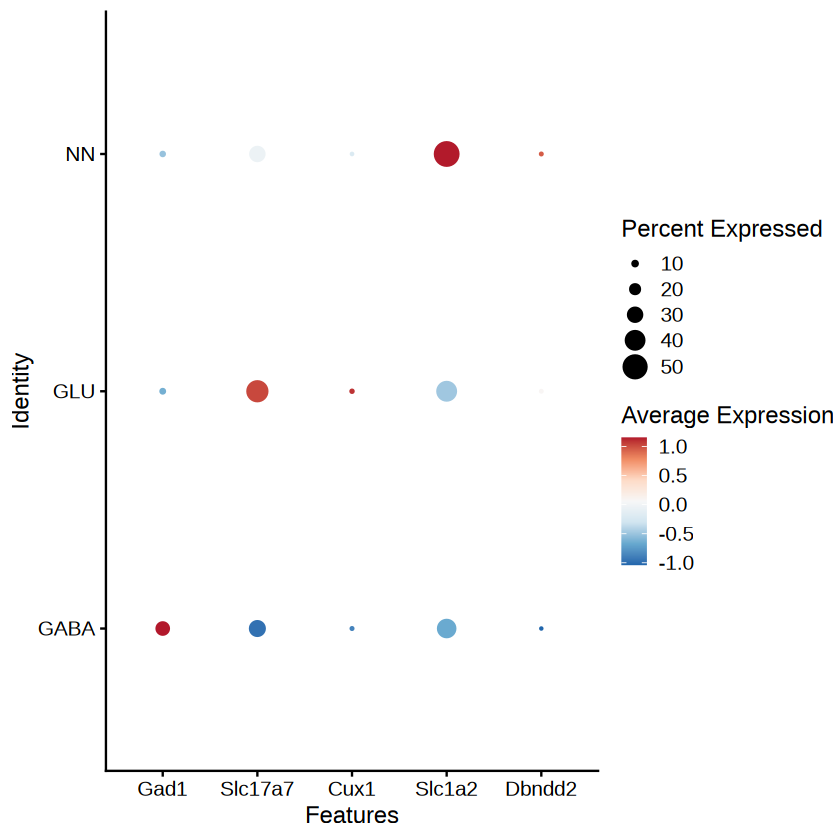

In [354]:
DotPlot(srt.62.sub,c("Slc17a7", "Otof","9130024F11Rik",
                     # "Slc17a7","Slc17a8",
                     "Neurod6","Pdzd2","Cux2","Mylk","Rorb","Il1rapl2","Etv1","Sema3e",
                     "Gad1","Gad2","Lamp5","Reln","Vip",'Sst',"Pvalb","Calb1","Sox6",
                        'Slc1a2','Dbndd2','Ntrk2',"Ptn"),cols="RdBu") + 
scale_size_continuous(range = c(2,10)) +
theme(axis.text.x = element_text(angle = 90,hjust = 1,vjust = 0.5))
# DotPlot(srt.62.sub,c("Gad1", "Slc17a7", "Cux1",'Slc1a2','Dbndd2')) + 
# theme(axis.text.x = element_text(angle = 90,hjust = 1,vjust = 0.5))
newan = srt.62.sub$`RNA_snn_res.1`
# table(newan)
# groupan = c(0 = "Unkn",1 = "GLU",2 = "GLU",3 = "NN",4 = "GLU",
#             5 = "GLU",6 = "GLU",7 = "GABA",
#             8 = "Unkn",9 = "Unkn",10 = "NN",11 = "GABA",12 = "NN")
groupan = data.frame("seurat" = c(0:12),"myan" = c("GLU","GLU","GLU",
                                                   "NN","GLU","GLU","GLU",
                                                   "GABA","GLU","GLU","NN","GABA","NN"))
# groupan = data.frame("seurat" = c(0:12),"myan" = c("GLU","GLU","Unkn",
#                                                    "NN","GLU","GLU","GLU",
#                                                    "GABA","Unkn","GLU","NN","GABA","NN"))
# groupan = data.frame("seurat" = c(0:12),"myan" = c("Unkn","GLU_L6","GLU_L2/3",
#                                                    "GLU_L4","GLU_L4","GLU_L5","Unkn",
#                                                    "GABA","GLU_L2/3","Unkn","NN","GABA","NN"))
newan = groupan[match(newan,groupan$seurat),]$myan
# # # newan
names(newan) = colnames(srt.62.sub)
srt.62.sub$myan = newan
DimPlot(srt.62.sub, reduction = "umap",group.by = "myan")
DotPlot(srt.62.sub,c("Gad1", "Slc17a7", "Cux1",'Slc1a2','Dbndd2'),group.by = "myan",cols="RdBu")
qsave(srt.62.sub,file = "data/fullscope_qc/Mouse_ST_seurat_B62_witnan_26_01_03.qs")

Warning message:
"Scaling data with a low number of groups may produce misleading results"
file saved to result/figure_revision/B62_celltype_annotation_26_01_04.pdf



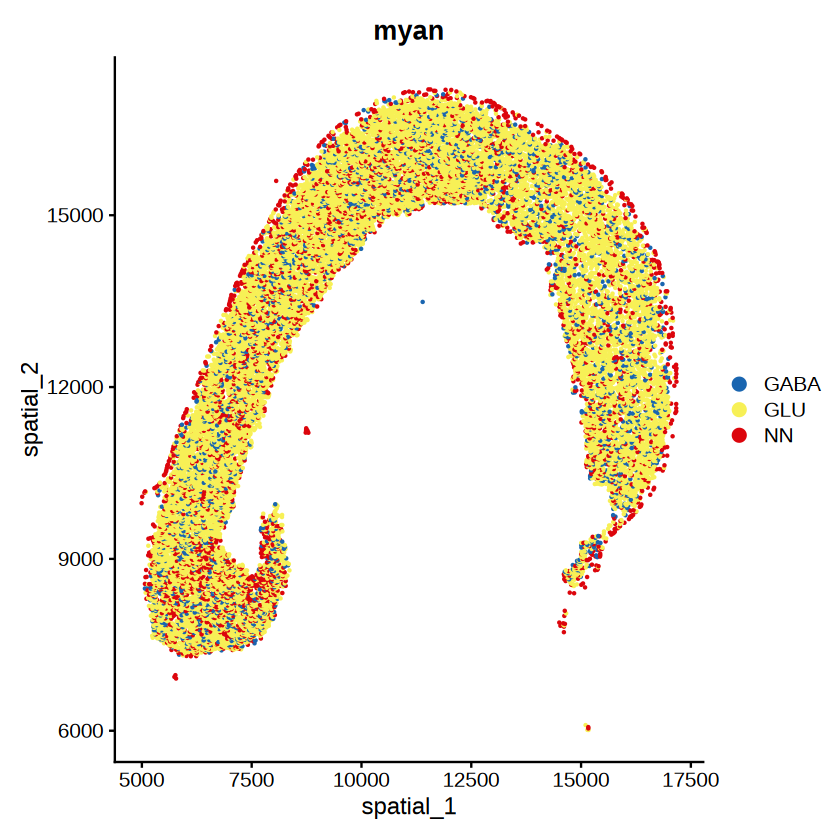

In [472]:
p1.0 = DimPlot(srt.62.sub, reduction = "umap",group.by = "myan") + scale_size(range = c(0.01,0.1)) + scale_color_discreterainbow()
p1.1 = DimPlot(srt.62.sub, reduction = "spatial",group.by = "myan",pt.size = 0.001) + scale_size(range = c(0.001,0.01)) + scale_color_discreterainbow()
p1.2 = DotPlot(srt.62.sub,c("Gad1", "Slc17a7", 'Slc1a2'),group.by = "myan",cols="RdBu")
p1t = ggarrange(p1.1,p1.0,p1.2,nrow = 1) 
p1.1
ggexport(p1t,filename = "result/figure_revision/B62_celltype_annotation_26_01_04.pdf",width = 15,height = 4)

In [59]:
fsraw.c12 = qread("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/preprocess/C12_read_trans_anno_withcoord_withregionan_remove_dedupread_ctx_25_07_18.qs")
cellidan = unique(gemdf.12[,c("x","y","CellID")])
cellidan$CellID = as.character(cellidan$CellID)
fsraw.c12 = fsraw.c12[fsraw.c12$brainr == "CTX",]
nrow(fsraw.c12)

newan = srt.12.sub$myan
newandf = data.frame("CellID" = names(newan),"class" = newan)
cellidan.12 = merge(cellidan,newandf,by = "CellID")
nrow(fsraw.c12)
fsraw.c12 = merge(fsraw.c12,cellidan.12,by = c("x","y"))
nrow(fsraw.c12)
length(unique(fsraw.c12$CellID))
qsave(fsraw.c12,"/cluster/home/liuhengxin/P_fullscope_crosspecies/data/preprocess/C12_read_trans_anno_withcoord_withregionan_remove_dedupread_ctx_with_cellan_25_12_31.qs")

[1] 18960077

[1] 18960077

[1] 1464251

[1] 7736

In [58]:
fsraw.b62 = qread("/cluster/home/liuhengxin/P_fullscope_crosspecies/data/preprocess/B62_read_trans_anno_withcoord_withregionan_remove_dedupread_25_07_18.qs")
cellidan = unique(gemdf.62[,c("x","y","CellID")])
cellidan$CellID = as.character(cellidan$CellID)
# fsraw.b62 = fsraw.b62[fsraw.b62$brainr == "CTX",]
newan = srt.62.sub$myan
newandf = data.frame("CellID" = names(newan),"class" = newan)
cellidan.62 = merge(cellidan,newandf,by = "CellID")
nrow(fsraw.b62)
fsraw.b62 = merge(fsraw.b62,cellidan.62,by = c("x","y"))
nrow(fsraw.b62)
qsave(fsraw.b62,"/cluster/home/liuhengxin/P_fullscope_crosspecies/data/preprocess/B62_read_trans_anno_withcoord_withregionan_remove_dedupread_ctx_with_cellan_25_12_31.qs")

[1] 82685709

[1] 82685709

[1] 7227767

In [ ]:
comid = intersect(colnames(fsraw.b62),colnames(fsraw.c12))
fsrawt = rbind(fsraw.b62[,comid],fsraw.c12[,comid])
head(fsrawt)

In [355]:
cellidan = unique(gemdf.62[,c("x","y","CellID")])
cellidan$CellID = as.character(cellidan$CellID)
newan = srt.62.sub$myan
newandf = data.frame("CellID" = names(newan),"class" = newan)
cellidan.62 = merge(cellidan,newandf,by = "CellID")
fsraw.b62$pos = paste0(fsraw.b62$x,"_",fsraw.b62$y)
cellidan.62$pos = paste0(cellidan.62$x,"_",cellidan.62$y)
fsraw.b62$class = cellidan.62[match(fsraw.b62$pos,cellidan.62$pos),]$class
table(fsraw.b62$class)
qsave(fsraw.b62,file = "data/fullscope_qc/Mouse_ST_seurat_B62_fullscope_witnan_26_01_03.qs")


   GABA     GLU      NN 
 788408 5591843  847516 

In [356]:
fsraw.b62$areatr = fsraw.b62$class
fsraw.b62$transcript_id = fsraw.b62$transcript_name
fsraw.b62$gene_id = fsraw.b62$gene_name
transti = FullLengthTranSt(fsraw.b62[fsraw.b62$class != "Unkn",])
isosig.b62 = CalSigIsoform(transti)
head(isosig.b62)
# fsraw.c12$areatr = fsraw.c12$class
# fsraw.c12$transcript_id = fsraw.c12$transcript_name
# fsraw.c12$gene_id = fsraw.c12$gene_name
# transti = FullLengthTranSt(fsraw.c12)
# isosig.c12 = CalSigIsoform(transti)
# head(isosig.c12)

qsave(isosig.b62,file = "data/fullscope_qc/Mouse_ST_B62_fullscope_DTU_sc26_01_03.qs")
qsave(list("subclass" = isosigref.sub,"class" = isosigref.cl),
      file = "data/fullscope_qc/Mouse_SC_tilgner_fullscope_witnan_26_01_03.qs")

`summarise()` has grouped output by 'gene_id', 'transcript_id'. You can
override using the `.groups` argument.
Warning message:
"There were 1117 warnings in `summarise()`.
The first warning was:
ℹ In argument: `pvalue = MyChiqTest(transcript_id, areatr, count)`.
ℹ In group 1: `gene_id = "0610010K14Rik"`.
Caused by warning in `chisq.test()`:
! Chi-squared approximation may be incorrect
ℹ Run `dplyr::last_dplyr_warnings()` to see the 1116 remaining warnings."


,gene_id,transcript_id,areatr,count,genecount,relative,meanrelative,otherrelative,dr,sig,pvalue,padj
,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
1,0610010K14Rik,0610010K14Rik-202,GABA,9,33,0.2727273,0.1916475,0.1511076,0.12161968,N,0.07675171,0.1166655
2,0610010K14Rik,0610010K14Rik-202,GLU,28,158,0.1772152,0.1916475,0.1988636,-0.02164845,N,0.07675171,0.1166655
3,0610010K14Rik,0610010K14Rik-202,NN,2,16,0.1250000,0.1916475,0.2249712,-0.09997123,N,0.07675171,0.1166655
4,0610010K14Rik,0610010K14Rik-204,GABA,6,33,0.1818182,0.1486862,0.1321203,0.04969793,N,0.07675171,0.1166655
5,0610010K14Rik,0610010K14Rik-204,GLU,22,158,0.1392405,0.1486862,0.1534091,-0.01416858,N,0.07675171,0.1166655
6,0610010K14Rik,0610010K14Rik-204,NN,2,16,0.1250000,0.1486862,0.1605293,-0.03552934,N,0.07675171,0.1166655


Warning message:
"Removed 430 rows containing non-finite outside the scale range
(`stat_boxplot()`)."
Warning message:
"Removed 430 rows containing non-finite outside the scale range
(`stat_boxplot()`)."
file saved to result/figure_revision/ST_vs_SC_fulllength_boxst_26_01_04.pdf



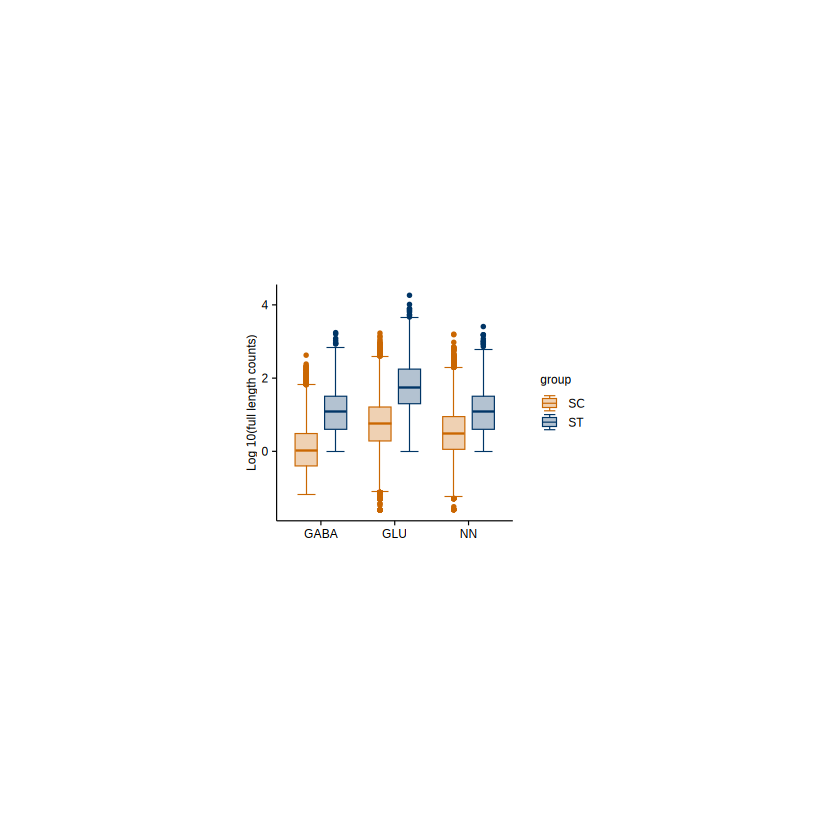

In [464]:
#compare transcript read number with scRNA
isosigi1 = isosig.b62
# isosigi2 = isosigref.cl
isosigi2 = isosigref.cl
renamedf = data.frame("areatr" = c("InhibNeuron","ExciteNeuron","NN"),new = c("GABA","GLU","NN"))
isosigi2 = merge(isosigi2,renamedf,by = "areatr")
isosigi2$areatr = isosigi2$new
isosigi1$group = "ST"
isosigi2$group = "SC"
trans.cmp = rbind(isosigi1[,c("gene_id","transcript_id","areatr","group","count")],
                  isosigi2[,c("gene_id","transcript_id","areatr","group","count")])
trans.cmp$log = log10(trans.cmp$count)
# ggplot(trans.cmp,aes(x = areatr,y = log10(count),fill = group)) + geom_boxplot()
pst = trans.cmp |> 
  tidyplot(x = areatr, y = log, color = group) |> 
  add_boxplot() |> 
  adjust_colors(c("#ca6702","#003566")) |> adjust_x_axis_title("") |> adjust_y_axis_title("Log 10(full length counts)")
pst
ggexport(pst,filename = "result/figure_revision/ST_vs_SC_fulllength_boxst_26_01_04.pdf",width = 5,height = 4)

In [89]:
#calculate jaccard score
# isosigi = rbind(isosigls.t44$class,
#                isosigls.t44$subcortical)


# isosig.t42
# isosig.t47
jaccard_similarity <- function(vec1, vec2) {
  intersection <- length(intersect(vec1, vec2))
  union <- length(union(vec1, vec2))
  return(intersection/union)
}

# isosigi1 = rbind(isosigls.t44$class,
#                isosigls.t44$subcortical)


DTUJaccard = function(isosigi1,isosigi2){
    comarea1 = unique(isosigi1$areatr)
    comarea2 = unique(isosigi2$areatr)
    jcdf = NULL
    for(i in 1:length(comarea1)){
        for(j in 1:length(comarea2)){
            df1 = isosigi1[isosigi1$areatr == comarea1[i],]
            df2 = isosigi2[isosigi2$areatr == comarea2[j],]
            comgene = unique(c(df1$gene_id,df2$gene_id))
            nt = length(comgene)
            vec1 = unique(unique(df1$gene_id))
            vec2 = unique(unique(df2$gene_id))
            nt1 = length(vec1)
            nt2 = length(vec2)
            jcv = jaccard_similarity(vec1,vec2)
            jcdf = rbind(jcdf,data.frame("Var1" = comarea1[i],"Var2" = comarea2[j],"value" = jcv,
                                         "nt" = nt,"nt" = nt1,"nt" = nt2))
        }
    }
    return(jcdf)
}


DTUCormx = function(isosigi1,isosigi2){
    comarea1 = unique(isosigi1$areatr)
    comarea2 = unique(isosigi2$areatr)
    jcdf = NULL
    for(i in 1:length(comarea1)){
        for(j in 1:length(comarea2)){
            df1 = isosigi1[isosigi1$areatr == comarea1[i],]
            df2 = isosigi2[isosigi2$areatr == comarea2[j],]
            # comgene = intersect(df1$gene_id,df2$gene_id)
            # df1 = df1[(df1$gene_id %in% comgene) & (df1$sig != "N"),]
            # df2 = df2[(df2$gene_id %in% comgene) & (df2$sig != "N"),]
            df = merge(df1[,c("transcript_id","dr")],df2[,c("transcript_id","dr")],by = "transcript_id")
            nt = nrow(df)
            corv = cor(df$dr.x,df$dr.y)
            jcdf = rbind(jcdf,data.frame("Var1" = comarea1[i],"Var2" = comarea2[j],"value" = corv,
                                         "nt" = nt))
        }
    }
    return(jcdf)
}




[1] 222

file saved to result/figure_revision/st_vs_sc_mouse_brain_cor_heatmap_26_01_03.pdf



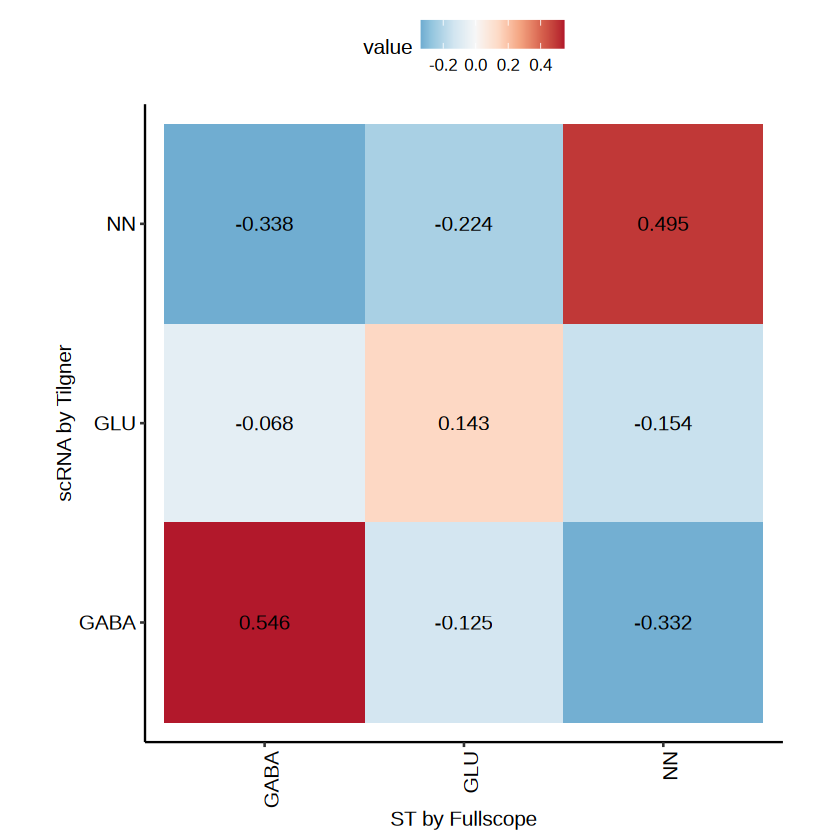

In [369]:
isosigi1 = isosig.b62
# isosigi2 = isosigref.cl
isosigi2 = isosigref.cl
renamedf = data.frame("areatr" = c("InhibNeuron","ExciteNeuron","NN"),new = c("GABA","GLU","NN"))
isosigi2 = merge(isosigi2,renamedf,by = "areatr")
isosigi2$areatr = isosigi2$new
# isosigi1 = isosig.b62[isosig.b62$sig != "N",]
# isosigi1 = isosigi1[isosigi1$sig != "N",]
# isosigi2 = isosigref.cl[isosigref.cl$sig != "N",]
# isosigi1 = isosigi1[isosigi1$sig != "N",]
# hubtrans = unique(c(isosigi1[isosigi1$sig != "N" & isosigi1$genecount > 50 & abs(isosigi1$dr) > 0.1,]$transcript_id,
#                    isosigi2[isosigi2$sig != "N" & isosigi2$genecount > 50 & abs(isosigi2$dr) > 0.1,]$transcript_id))
hubtrans = unique(c(isosigi1[isosigi1$sig != "N",]$transcript_id,
                   isosigi2[isosigi2$sig != "N",]$transcript_id))
isosigi1 = isosigi1[isosigi1$transcript_id %in% hubtrans & isosigi1$count > 50,]
isosigi2 = isosigi2[isosigi2$transcript_id %in% hubtrans & isosigi2$count > 50,]
# isosigi1 = isosigi1[isosigi1$sig != "N" & isosigi1$count > 20,]
# isosigi2 = isosigi2[isosigi2$sig != "N" & isosigi2$count > 20,]
# isosigi2$gene_id = toupper(isosigi2$gene_id)
# isosigi2 = isosigi2 %>% group_by(gene_id) %>% filter(meanrelative == max(meanrelative))

comgene = intersect(isosigi1$transcript_id,isosigi2$transcript_id)
length(comgene)

jcdf = DTUCormx(isosigi1,isosigi2)
p1.0 = ggplot(jcdf,aes(x = Var1,y = Var2, fill = value)) + 
        geom_tile() + geom_text(aes(label = round(value,3))) + 
        scale_fill_BuRd() + theme_pubr() + 
        theme(axis.text.x = element_text(angle = 90,hjust = 1)) + 
        xlab("ST by Fullscope") + ylab("scRNA by Tilgner") + coord_fixed()
p1.0
ggexport(p1.0,filename = "result/figure_revision/st_vs_sc_mouse_brain_cor_heatmap_26_01_03.pdf",width = 5,height = 5)

# hubtrans = unique(c(isosigi1[isosigi1$sig != "N",]$transcript_id,
#                    isosigi2[isosigi2$sig != "N",]$transcript_id))
# isosigi1 = isosigi1[isosigi1$transcript_id %in% hubtrans & isosigi1$count > 50,]
# isosigi2 = isosigi2[isosigi2$transcript_id %in% hubtrans & isosigi2$count > 50,]
isosig.cmp = merge(isosigi1[,c("gene_id","transcript_id","areatr","count","dr")],
                   isosigi2[,c("gene_id","transcript_id","areatr","count","dr")],
                   by = c("gene_id","transcript_id","areatr"))
isosig.cmp = isosig.cmp[abs(isosig.cmp$dr.x) > 0.1 | abs(isosig.cmp$dr.y) > 0.1,]
nrow(isosig.cmp)

[1] 186

[1] 0.285571

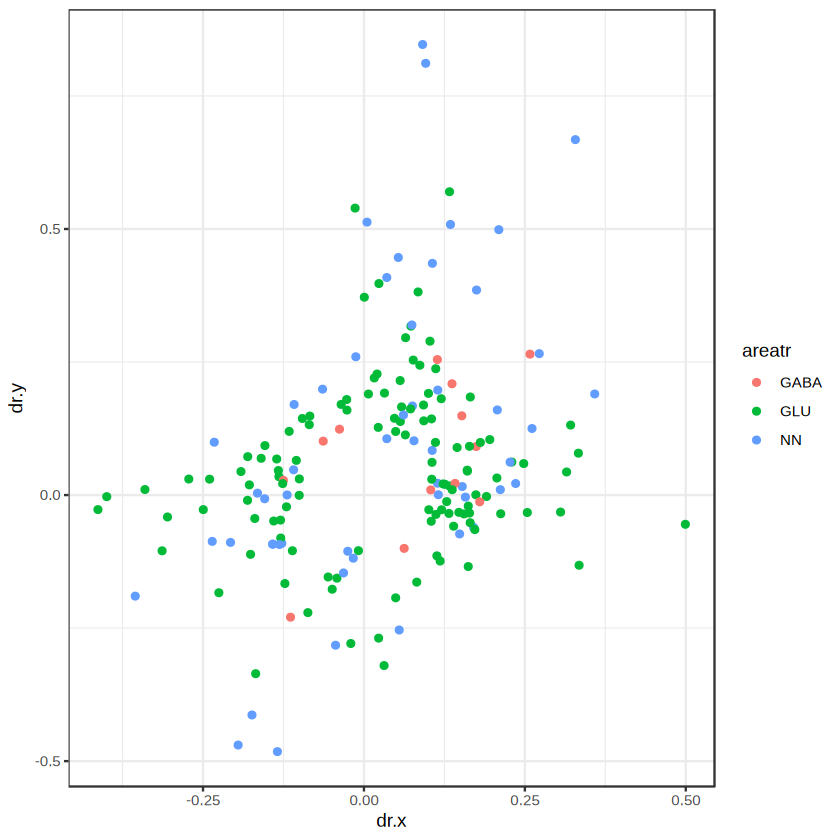

In [372]:
cor(isosig.cmp$dr.x,isosig.cmp$dr.y)
ggplot(isosig.cmp,aes(x = dr.x,y = dr.y,color = areatr)) + geom_point() + theme_bw() + xlab("")

In [4]:
isosig.b62 = qread(file = "data/fullscope_qc/Mouse_ST_B62_fullscope_DTU_sc26_01_03.qs")
isosigref.ls = qread("data/fullscope_qc/Mouse_SC_tilgner_fullscope_witnan_26_01_03.qs")
isosigref.cl = isosigref.ls$class

In [5]:
isosigi1 = isosig.b62
isosigi2 = isosigref.cl
renamedf = data.frame("areatr" = c("InhibNeuron","ExciteNeuron","NN"),new = c("GABA","GLU","NN"))
isosigi2 = merge(isosigi2,renamedf,by = "areatr")
isosigi2$areatr = isosigi2$new
# isosigi1 = isosigi1[isosigi1$count > 50,]
# isosigi2 = isosigi2[isosigi2$count > 50,]
hubtrans = unique(c(isosigi1[isosigi1$sig != "N",]$transcript_id,
                   isosigi2[isosigi2$sig != "N",]$transcript_id))
isosigi1 = isosigi1[isosigi1$transcript_id %in% hubtrans & isosigi1$count > 50,]
isosigi2 = isosigi2[isosigi2$transcript_id %in% hubtrans & isosigi2$count > 50,]
isosig.cmp2 = merge(isosigi1[,c("gene_id","transcript_id","areatr","count","dr")],
                   isosigi2[,c("gene_id","transcript_id","areatr","count","dr")],
                   by = c("gene_id","transcript_id","areatr"))
# isosig.cmp2 = isosig.cmp2[abs(isosig.cmp2$dr.x) > 0.1 | abs(isosig.cmp2$dr.y) > 0.1,]

group,count,prop,thred
<chr>,<int>,<dbl>,<dbl>
Common,116,0.4793388,0.05
STonly,80,0.3305785,0.05
SConly,46,0.1900826,0.05


file saved to result/figure_revision/st_vs_sc_mouse_brain_dtuoverlap_26_01_03.pdf



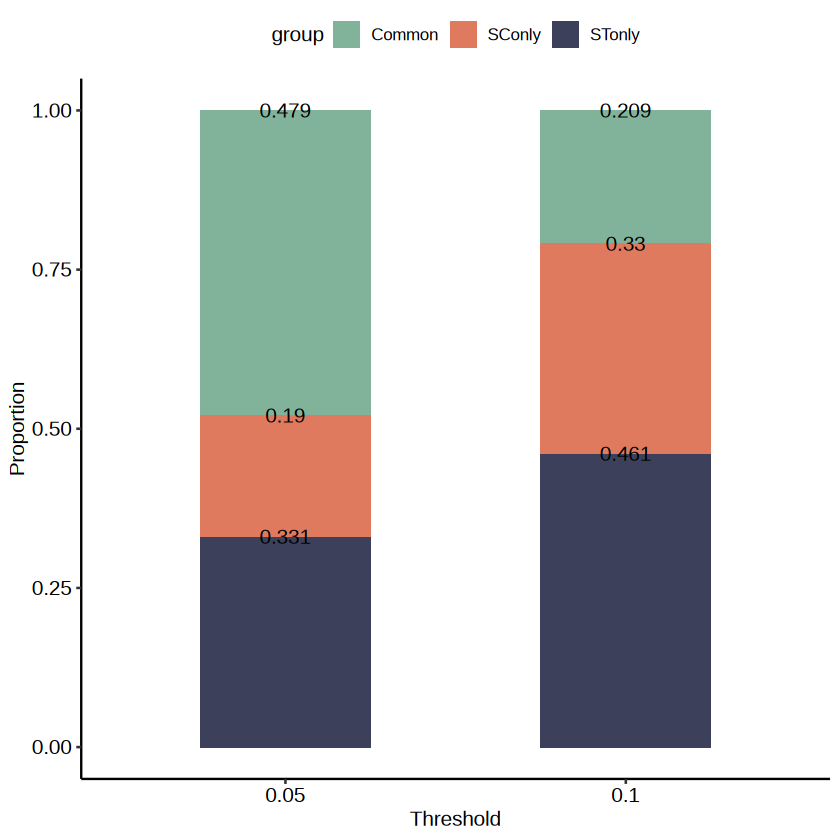

In [436]:
# thred = 0.05
thred = 0.05
statdf1 = data.frame(group = c("Common","STonly","SConly"),
                    count = c(nrow(isosig.cmp2[abs(isosig.cmp2$dr.x) > thred & abs(isosig.cmp2$dr.y) > thred,]),
                      nrow(isosig.cmp2[abs(isosig.cmp2$dr.x) > thred & abs(isosig.cmp2$dr.y) < thred,]),
                      nrow(isosig.cmp2[abs(isosig.cmp2$dr.x) < thred & abs(isosig.cmp2$dr.y) > thred,])))
statdf1$prop = statdf1$count/sum(statdf1$count)
statdf1$thred = thred
statdf1

thred = 0.1
statdf2 = data.frame(group = c("Common","STonly","SConly"),
                    count = c(nrow(isosig.cmp2[abs(isosig.cmp2$dr.x) > thred & abs(isosig.cmp2$dr.y) > thred,]),
                      nrow(isosig.cmp2[abs(isosig.cmp2$dr.x) > thred & abs(isosig.cmp2$dr.y) < thred,]),
                      nrow(isosig.cmp2[abs(isosig.cmp2$dr.x) < thred & abs(isosig.cmp2$dr.y) > thred,])))
statdf2$prop = statdf2$count/sum(statdf2$count)
statdf2$thred = thred
statdf = rbind(statdf2,statdf1)
statdf$thred = as.character(statdf$thred)
p1.2 = ggplot(statdf,aes(x = thred, y = prop, fill = group)) +
        geom_bar(stat = "identity",position = "fill",width = 0.5) +
        geom_text(aes(label = round(prop,3)),position = position_fill()) + 
        scale_fill_manual(values = c("#81b29a","#e07a5f","#3d405b")) +
        theme_pubr() + xlab("Threshold") + ylab("Proportion")
p1.2
ggexport(p1.2,filename = "result/figure_revision/st_vs_sc_mouse_brain_dtuoverlap_26_01_03.pdf",width = 3.5,height = 5)


In [443]:
isosigi1 = isosig.b62
isosigi2 = isosigref.cl
renamedf = data.frame("areatr" = c("InhibNeuron","ExciteNeuron","NN"),new = c("GABA","GLU","NN"))
isosigi2 = merge(isosigi2,renamedf,by = "areatr")
isosigi2$areatr = isosigi2$new
hubtrans = unique(c(isosigi1[isosigi1$sig != "N",]$transcript_id,
                   isosigi2[isosigi2$sig != "N",]$transcript_id))
isosigi1 = isosigi1[isosigi1$transcript_id %in% hubtrans & isosigi1$count > 50,]
isosigi2 = isosigi2[isosigi2$transcript_id %in% hubtrans & isosigi1$count > 50,]
isosigi1$group = "ST"
isosigi2$group = "SC"
isosig.cmpl = rbind(isosigi1[,c("gene_id","transcript_id","areatr","group","dr")],
                    isosigi2[,c("gene_id","transcript_id","areatr","group","dr")])
isosig.mx = dcast(isosig.cmpl,transcript_id~group+areatr,value.var = "dr",fill = 0)
row.names(isosig.mx) = isosig.mx$transcript_id;isosig.mx = isosig.mx[,-1]
isosig.mx = isosig.mx[rowSums(isosig.mx != 0) == 6,]
head(isosig.mx)
dim(isosig.mx)

Warning message in isosigi2$transcript_id %in% hubtrans & isosigi1$count > 50:
"longer object length is not a multiple of shorter object length"


,SC_GABA,SC_GLU,SC_NN,ST_GABA,ST_GLU,ST_NN
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Acbd6-201,0.10527062,-0.027336607,-0.07793401,-0.006099194,-0.24959753,0.25569672
Anapc11-201,0.17348724,-0.255868407,0.08238117,0.100928157,-0.08493188,-0.01599628
Anapc13-204,-0.01349437,0.003159295,0.01033507,-0.110358675,0.05244812,0.05791056
Arpp19-203,-0.22151519,0.539252064,-0.31773687,-0.049908719,-0.01375078,0.06365950
Asph-217,0.17195015,0.165670626,-0.33762078,-0.106925758,0.05852001,0.04840575
Atp5c1-203,0.09116647,0.098791368,-0.18995784,0.174431948,0.18083150,-0.35526344


[1] 109   6

Warning message:
"The input is a data frame-like object, convert it to a matrix."
file saved to result/figure_revision/st_vs_sc_mouse_brain_dtu_heatmap_26_01_03.pdf



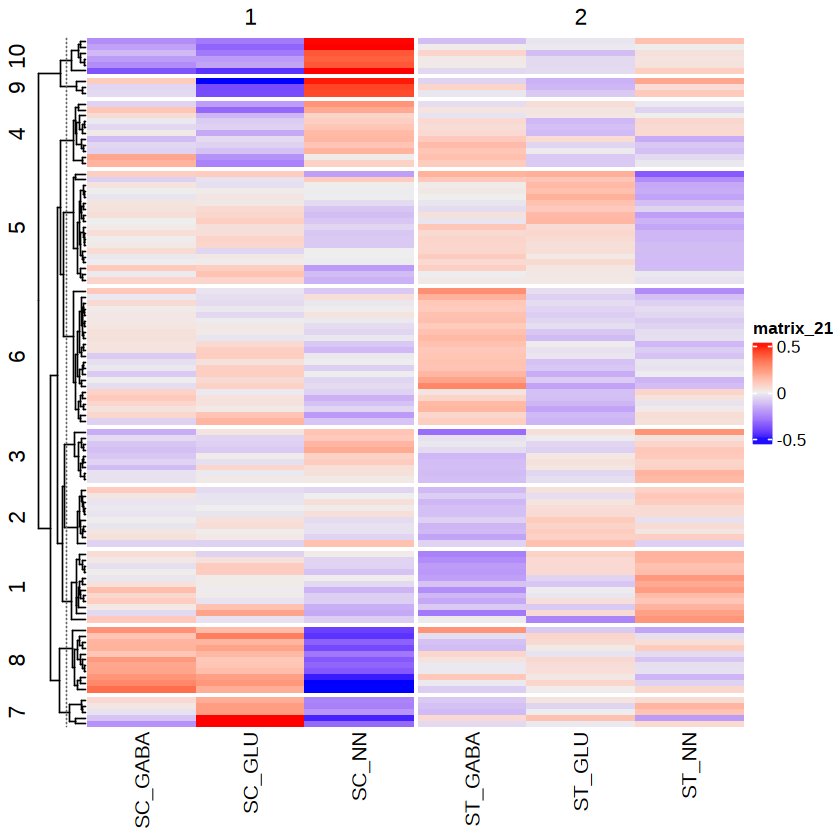

In [447]:
library(ComplexHeatmap)
p1.3 = Heatmap(isosig.mx,show_row_names = FALSE,cluster_columns = FALSE,km = 10,column_split = (c(rep("SC",3),rep("ST",3))))
p1.3
ggexport(p1.3,filename = "result/figure_revision/st_vs_sc_mouse_brain_dtu_heatmap_26_01_03.pdf",width = 3,height = 5)


In [14]:
library(VennDiagram)
thred = 0.05
cmpls = list("ST" = isosig.cmp2[abs(isosig.cmp2$dr.x) > thred,]$transcript_id,
     "SC" = isosig.cmp2[abs(isosig.cmp2$dr.y) > thred,]$transcript_id)
library(VennDiagram)
vd1 <- VennDiagram::venn.diagram(cmpls, filename = NULL,fill = c("#003566","#ca6702"),scaled = T)
pdf("result/figure_revision/st_vs_sc_mouse_brain_dtuoverlap_0.05_26_01_06.pdf",width = 5,height = 5)
grid::grid.draw(vd1)
dev.off()

library(VennDiagram)
thred = 0.1
cmpls = list("ST" = isosig.cmp2[abs(isosig.cmp2$dr.x) > thred,]$transcript_id,
     "SC" = isosig.cmp2[abs(isosig.cmp2$dr.y) > thred,]$transcript_id)
library(VennDiagram)
vd2 <- VennDiagram::venn.diagram(cmpls, filename = NULL,fill = c("#003566","#ca6702"),scaled = T)
pdf("result/figure_revision/st_vs_sc_mouse_brain_dtuoverlap_0.1_26_01_06.pdf",width = 5,height = 5)
grid::grid.draw(vd2)
dev.off()


pdf 
  2

pdf 
  2